# Streamlined Dating Profile Descriptions

## Types

In [1]:
import functools as fn
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn.cluster as cls
import sklearn.metrics as met
from pyclustering.cluster.kmedoids import kmedoids
from scipy.spatial import ConvexHull

import entropy as ent
import parametersearch as ps
import unsupervisedcv as ucv
import utility as utl
import visualization as viz

%matplotlib inline

warnings.filterwarnings('ignore')

In [2]:
# notebook-wide presets
MINUTE = 60
TIME_BOUND = 120 * MINUTE
MISSING_IND = -1
N_JOBS = -1
N_ITER = 100

# functions sensitive to missing values
mutual_info = fn.partial(ent.mutual_info, missing_ind=MISSING_IND)
non_missing_series = fn.partial(
    utl.non_missing_series, missing_ind=MISSING_IND)

# resource-bounded functions
parameter_search = fn.partial(
    ps.condensing_search,
    n_iter=N_ITER,
    max_time=TIME_BOUND,
    print_iter=True,
    tol=0.001
)

# visualization
scatter_parallel = fn.partial(viz.scatter_parallel, scatter_alpha=0.25)
scatter_param_search = fn.partial(viz.scatter_param_search, alpha=0.02)

In [3]:
# load profile data
# raw data was pre-processed in a separate notebook: Data Wrangling.ipynb
profiles = pd.read_feather('../processed_data/profiles.feather')

n_profiles = len(profiles)
features = [x for x in profiles.columns if x != 'missing_count']
profiles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68371 entries, 0 to 68370
Columns: 2595 entries, q2 to missing_count
dtypes: int64(1), int8(2594)
memory usage: 169.7 MB


In [4]:
# load questions metadata
question_columns = [
    'qid',
    'text',
    'option_1',
    'option_2',
    'option_3',
    'option_4',
]
questions = pd.read_csv(
    '../source_data/okcupid_2015/question_data.csv',
    delimiter=';',
    names=question_columns,
    header=0,
    usecols=np.arange(6),
    index_col='qid',
)

In [5]:
# load embedding
emb_data = pd.read_feather('../processed_data/embedded_profiles.feather')
emb_data = emb_data.values

In [6]:
# folds are used to create smaller samples that are faster to work with
# seed specified so folds are the same across notebooks in the project
randy = np.random.default_rng(733616026)

n_folds = 10
fold_masks = ucv.kfolds_masks(n_profiles, n_folds, rng=randy)

In [7]:
# select fold for embedding parameter exploration
X = profiles[fold_masks[1]][features]
X_missing = profiles[fold_masks[1]]['missing_count']

In [8]:
# precompute distance matrix to accelerate parameter search
entropy_hamming = ent.hamming_variation_func(
    'uniform', 'entropy', 'max', X, missing_ind=MISSING_IND
)
X_dist_matrix, X_implied_dim, X_max_dim = utl.dist_matrix_and_dim(
    X, entropy_hamming)

print(
    f'Dimension implied by profile distances: {X_implied_dim:.3f}. Working max dimension: {X_max_dim}.'
)

Dimension implied by profile distances: 6.716. Working max dimension: 7.


## Profile Types

So what types of dating profiles are there? This is a clustering problem. I try clustering using DBSCAN first in hopes that it can identify a suitable number of clusters automatically. I fit the cluster model using the original profile distance matrix to avoid any distortion from the embedding; but I can't visualize that, so the plots of clusters use the embedding for spatial position.

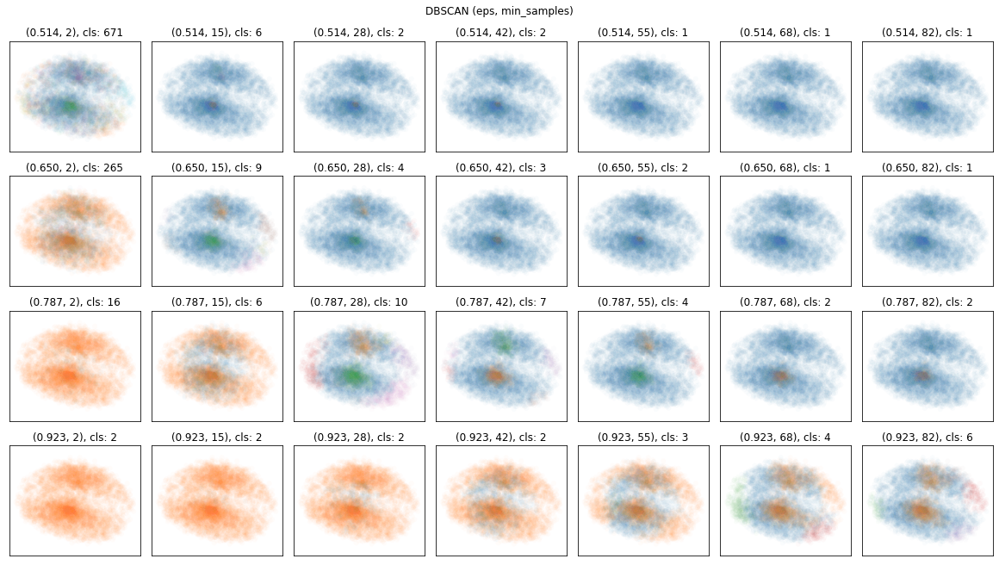

In [9]:
# experiment with DBSCAN clustering
def test_dbscan(**kwargs):
    labels = cls.DBSCAN(metric='euclidean', **kwargs).fit_predict(emb_data)
    n_clusters = len(np.unique(labels))

    eps = kwargs['eps']
    min_samples = kwargs['min_samples']
    subtitle = f'({eps:.3f}, {min_samples}), cls: {n_clusters}'
    return emb_data, labels, np.NINF, subtitle


n_rows = 4
n_cols = 7

eps_min = np.quantile(X_dist_matrix, 0.01)
eps_max = np.quantile(X_dist_matrix, 0.3)
n_points = len(X)
param_specs = {
    'eps': np.linspace(eps_min, eps_max, n_rows),
    'min_samples': np.linspace(2, np.floor(np.sqrt(n_points)), n_cols).astype(int),
}

_ = scatter_param_search(
    n_rows,
    n_cols,
    ps.param_grid(param_specs),
    test_dbscan,
    'DBSCAN (eps, min_samples)'
)

Well, that doesn't work. DBSCAN looks for high-density regions separated by empty regions, but the profile data form a single connected component. Next, I experiment with agglomerative and k-medoids clustering, which can be forced to produce as many clusters as I want (again using the original profile distance matrix).

I also switch to clustering on the embedding rather than the original distance matrix. Homogenous distances in high-dimensional geometry frequently make clustering ineffective.

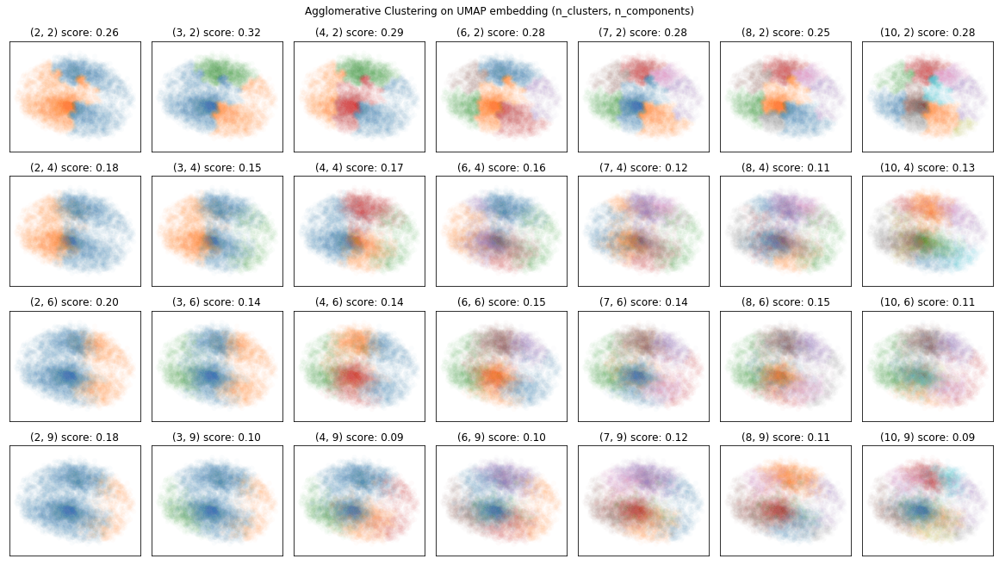

In [10]:
# experiment with agglomerative clustering on UMAP embedding
def test_agglomerative_umap(n_clusters, n_dims):
    sub_emb = emb_data.T[:n_dims].T
    model = cls.AgglomerativeClustering(
        affinity='euclidean', linkage='complete', n_clusters=n_clusters
    )
    labels = model.fit_predict(sub_emb)
    score = met.silhouette_score(sub_emb, labels, metric='euclidean')

    subtitle = f'({n_clusters}, {n_dims}) score: {score:.2f}'
    return sub_emb, labels, score, subtitle


n_rows = 4
n_cols = 7

# parameter test values
param_spec = {
    'n_dims': np.linspace(2, emb_data.shape[1], n_rows).astype(int),
    'n_clusters': np.linspace(2, 10, n_cols).astype(int),
}

_ = scatter_param_search(
    n_rows,
    n_cols,
    ps.param_grid(param_spec),
    test_agglomerative_umap,
    'Agglomerative Clustering on UMAP embedding (n_clusters, n_components)'
)

In [11]:
def kmedoids_labels(data, n_medoids, initial_method, **kmedoids_args):
    """Fits a k-Medoids cluster model and returns the cluster labels"""
    if initial_method == 'extrema':
        initial_indices = utl.initial_medoids_extrema(data, n_medoids)
    else:
        initial_indices = utl.initial_medoids_random(len(data), n_medoids)

    km_model = kmedoids(data, initial_indices, **kmedoids_args)
    km_model.process()
    return km_model, utl.invert_index_lists(km_model.get_clusters())

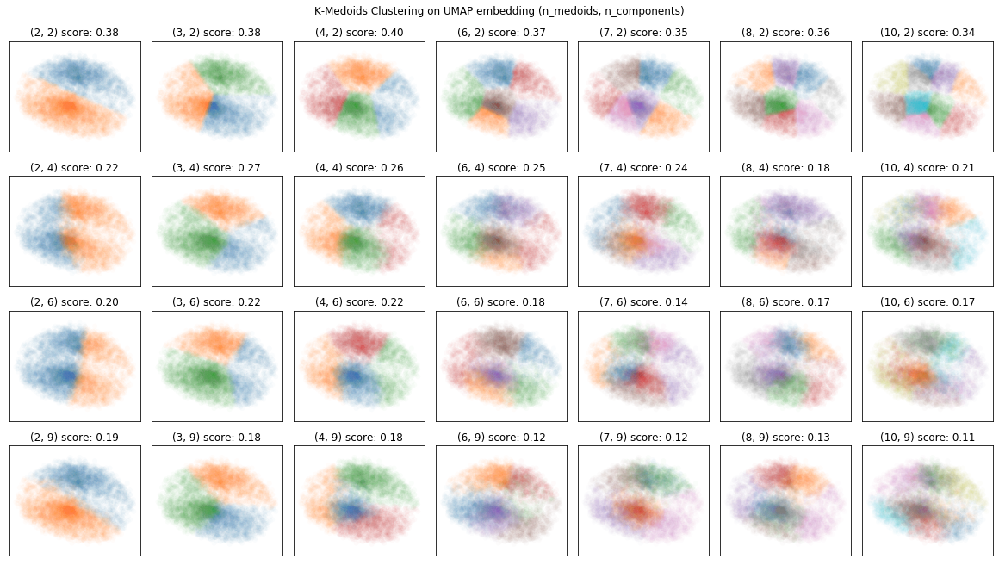

In [12]:
# test K-Medoids clustering parameters on UMAP embedding
def test_kmedoids_umap(n_medoids, n_dims):
    sub_emb = emb_data.T[:n_dims].T
    km_model, labels = kmedoids_labels(sub_emb, n_medoids, 'random')
    score = met.silhouette_score(sub_emb, labels, metric='euclidean')

    subtitle = f'({n_medoids}, {n_dims}) score: {score:.2f}'
    return sub_emb, labels, score, subtitle


n_rows = 4
n_cols = 7

# parameter test values
param_spec = {
    'n_dims': np.linspace(2, emb_data.shape[1], n_rows).astype(int),
    'n_medoids': np.linspace(2, 10, n_cols).astype(int),
}

_ = scatter_param_search(
    n_rows,
    n_cols,
    ps.param_grid(param_spec),
    test_kmedoids_umap,
    'K-Medoids Clustering on UMAP embedding (n_medoids, n_components)'
)

### Cluster Tuning
#### Cluster Shapes

Something seemed vaguely unsatisfying to me about the shapes of the agglomerative clusters compared to the k-medoids clusters. I'm clustering the data to find meaningful "types" of dating profiles. If two profiles have the same type, but a profile of a different type appears directly between them, that violates my intuitive notion of what a type is supposed to be—*profile types should be convex*. More precisely, profiles of the same type should occupy a convex region. Agglomerative clustering often finds non-convex shapes. 1-nearest-neighbor-type cluster models, such as k-means and k-medoids, are guaranteed to form convex clusters—Voronoi cells, specifically—so I will stick to those.


#### What's a "cluster," anyway?

This embedding of the profile data does have regions of varying density, but not disconnected components. For any two profiles, there's a continuum of other profiles between them. If profile types are to be based on clustering, I need a different concept for what a cluster is.

k-medoids clustering tends to position clusters around locally convex extrema along the larger features of a shape. Within a continguous region, the "corners" are where points can be close to other members of the same cluster and far from other clusters. For dating profiles, "types" would be strong expressions along the continuum of any characteristic(s) represented by the direction of the corner. I find this interpretation for a profile type satisfying enough to pursue.

This requires developing corner-centric criteria for the quality of cluster models. If a cluster is successfully situated in a corner of the data, its medoid should be a vertex of the convex hull of all the medoids—no interior clusters. This can be a very loose criterion. A convex shape in at least 2 dimensions can have as many vertices as it wants. A "sharper" criterion might be that good corners should be the apex of an orthogonal cone containing all the other medoids, but this tends to be unreasonably selective.

The PCA transformation of the UMAP embedding aligns the largest distances in the data with the coordinate axes, so good clusters might "pool" into the extreme corners along each dimension. We can see this pattern in higher-dimensional shapes in a parallel coordinates plot: the extrema in each dimension would be dominated by lines representing a particular cluster. I can facilitate this by using the extreme points along each dimension as initial medoids for cluster fitting. This is not to say that the number of corner clusters can be strictly determined by the possible extrema along each dimension (i.e. `2 * n_dims`). PCA transformation just helps find the largest-scale extrema fastest. Still, it may be satisfying for clusters to coincide with dimension-wise extrema.

In [13]:
def medoid_parallel_alpha(n_medoids):
    return 0.1 / np.sqrt(n_medoids)


def plot_km_parallel(n_dims, n_medoids, initial='random'):
    # fit model
    sub_emb = emb_data.T[:n_dims].T
    model, labels = kmedoids_labels(sub_emb, n_medoids, initial)

    # check for "corners"
    medoids = sub_emb[model.get_medoids()]
    medoid_labels = labels[model.get_medoids()]
    medoid_vertices = medoids[ConvexHull(medoids).vertices]
    n_corners = len(medoid_vertices)
    n_sharp_corners = len(utl.sharp_vertices_indices(medoid_vertices))
    n_extrema = len(utl.extrema_indices(medoid_vertices))

    scatter_title = f'{n_medoids} clusters, {n_corners} convex vertices, {n_sharp_corners} sharp, {n_extrema} extrema'
    scatter_parallel(
        sub_emb,
        labels=labels,
        scatter_title=scatter_title,
        parallel_title=f'Parallel Coordinates, {n_dims}-D',
        parallel_alpha=medoid_parallel_alpha(n_medoids),
        hide_legend=True,
    )

    return n_medoids, n_corners, n_sharp_corners, n_extrema

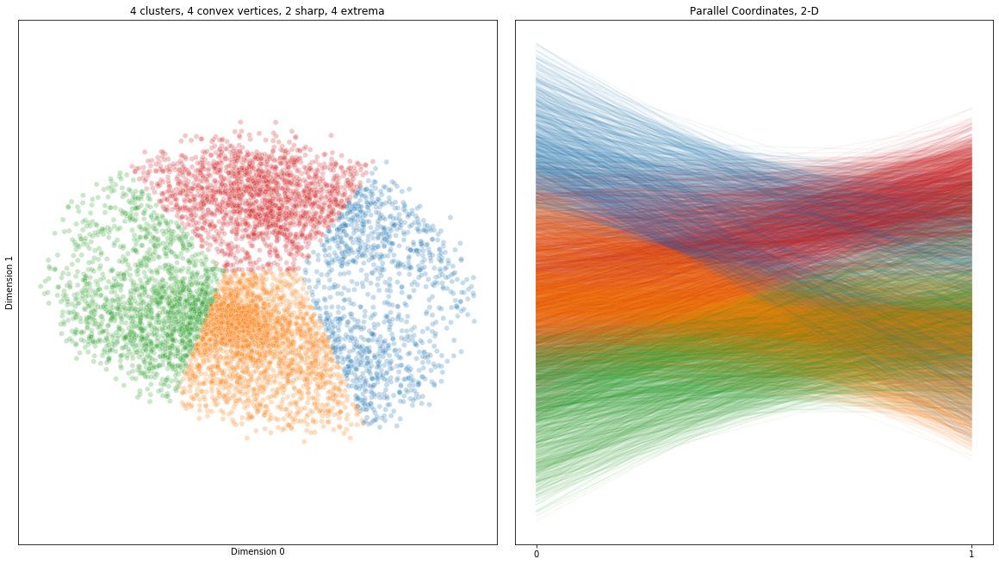

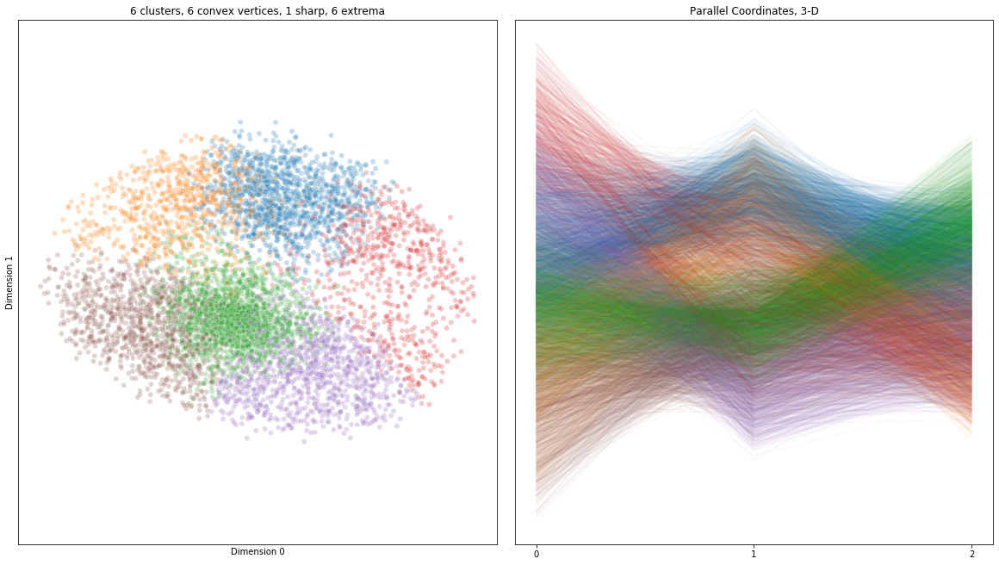

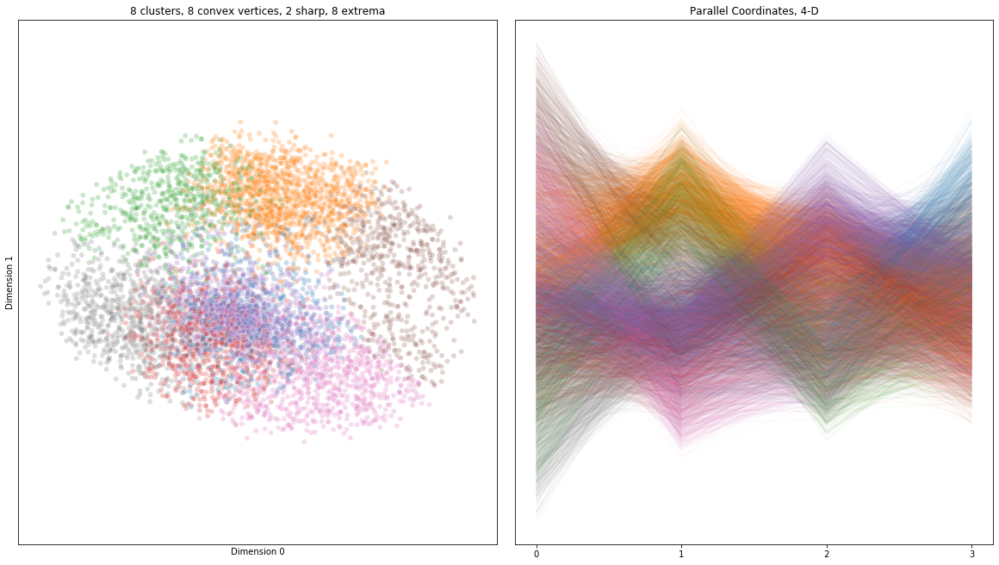

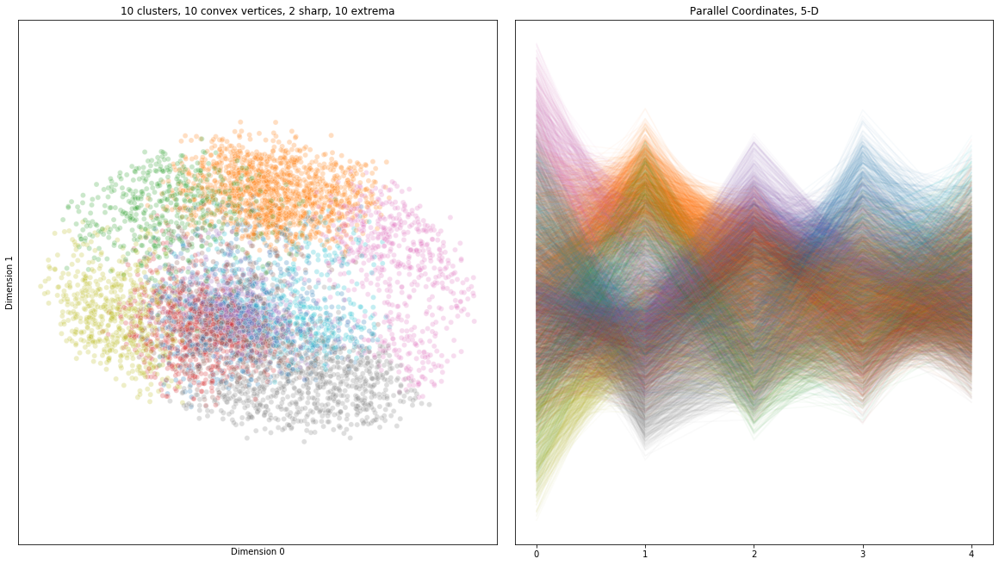

In [14]:
# demonstrate clusters pooling into extrema with parallel coordinates
for n_dims in [2, 3, 4, 5]:
    n_medoids = 2 * n_dims
    _ = plot_km_parallel(n_dims, n_medoids, 'extrema')

Since k-medoid clusters tend to pool into dimension-wise extrema, perhaps meaningful dimensions should show some association with cluster membership. Good dimensions should have at least one cluster able to position itself in an extremum in that dimension. Otherwise, that dimension is contributing substantially less to distinguishing profiles than the other dimensions. This does not override any significance we found by comparing embedding dimensions to features. Rather, I can use this to constrain the search for good clusters.

The simplest convex polytope in $d$ dimensions is the simplex with $d + 1$ vertices. If a cluster model in a $d$-dimensional embedding only finds $m < d$ convex vertices among cluster medoids, that suggests that the data are mostly aligned with some affine subspace, and it might be a good idea to try $m - 1$ dimensions instead. Analogously, we might expect a clustering to find $d * 2$ medoids that are coordinate-wise extrema, so we might set the dimension as $d \leq \lceil \frac{n_\text{extrema}}{2} \rceil$.

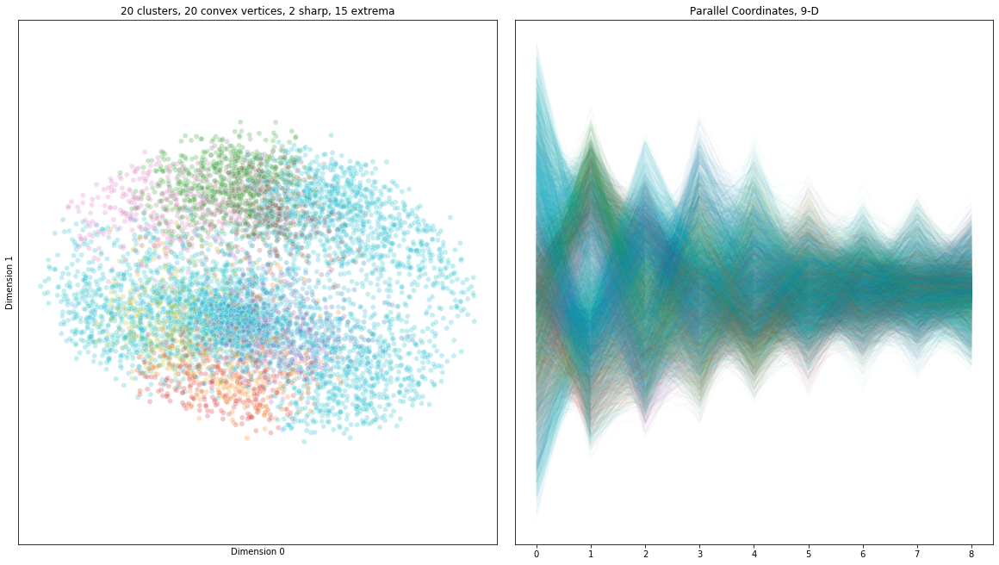

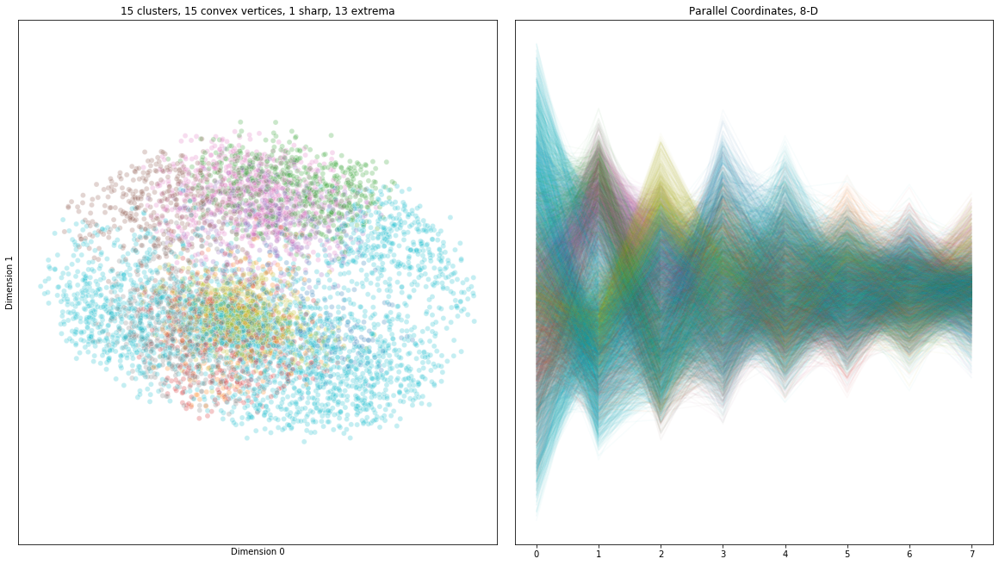

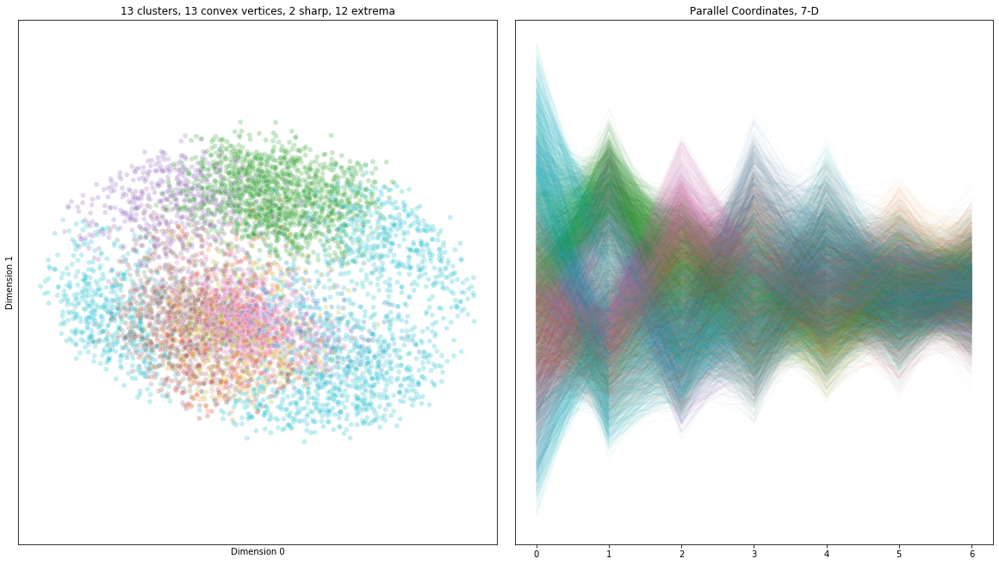

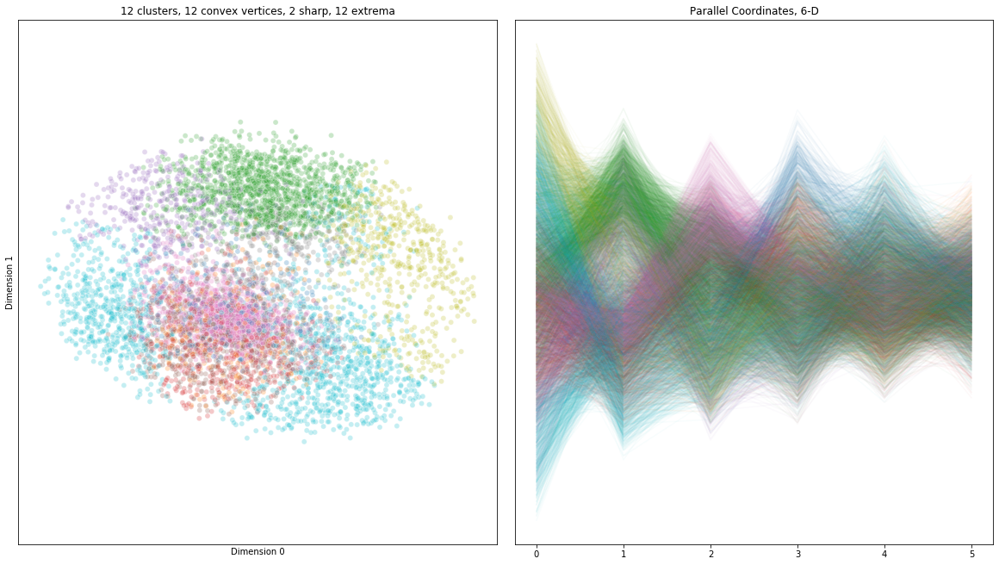

Selected n_medoids: 12


In [15]:
# experiment with k selection procedure
fit_dims = np.inf  # initial values to satisfy while loop condition
fit_medoids = np.inf

n_dims = emb_data.shape[1]
n_medoids = n_dims * 2 + 2

while n_dims < fit_dims or n_medoids < fit_medoids:
    n_medoids, n_corners, n_sharp_corners, n_extrema = plot_km_parallel(
        n_dims, n_medoids, 'extrema'
    )

    # select parameters to try next
    fit_dims = n_dims
    fit_medoids = n_medoids
    n_dims = max(utl.iceil(n_extrema / 2), 2)
    n_medoids = n_extrema

n_medoids = fit_medoids
print(f'Selected n_medoids: {n_medoids}')

In [16]:
# best clustering parameters from convex extrema method
n_dims = utl.iceil(n_medoids / 2)
km_model, km_labels = kmedoids_labels(
    emb_data[:, :n_dims], n_medoids, 'extrema')

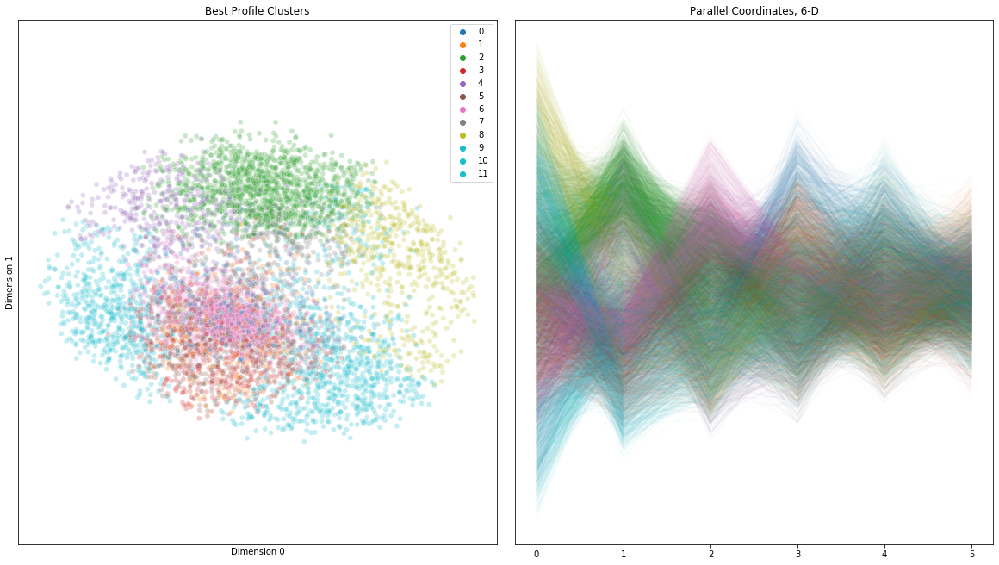

In [17]:
# plot clustering result
scatter_parallel(
    emb_data[:, :n_dims],
    labels=km_labels,
    scatter_title='Best Profile Clusters',
    parallel_title=f'Parallel Coordinates, {n_dims}-D',
    parallel_alpha=medoid_parallel_alpha(n_medoids),
)

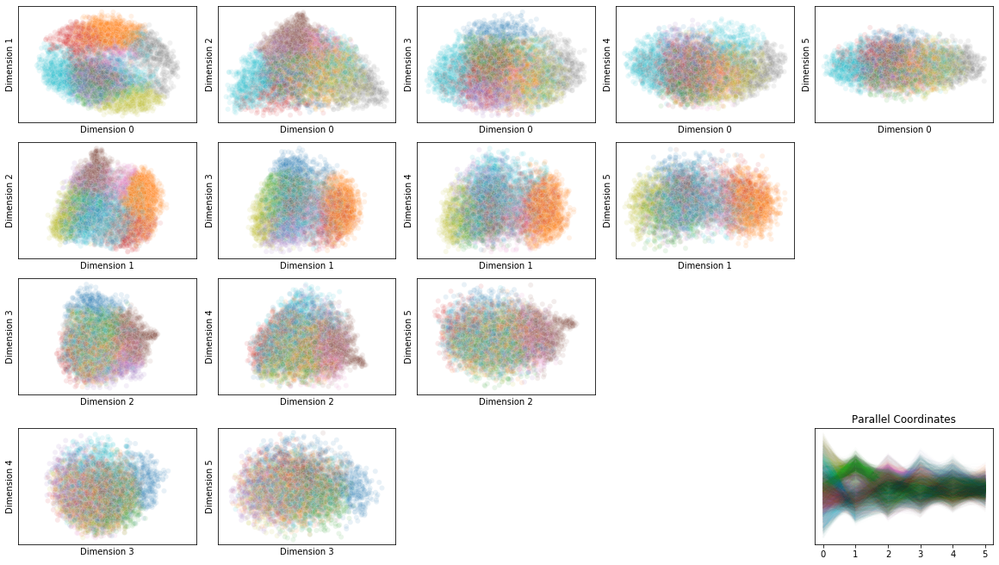

In [18]:
# alternate plot of clusters
n_rows = 4
n_cols = 7
viz.scatter_matrix(
    emb_data[:, :n_dims],
    n_rows,
    n_cols,
    labels=km_labels,
    scatter_alpha=0.1,
    parallel_alpha=0.007
)

### Characterizing Embedding Dimensions

Since my cluster tuning procedure specifically looked for clusters representing extrema in the largest (highest variance) dimensions of the embedding, the simplest description of each cluster is simply naming which end of which dimension.

In [19]:
# identify embedding dimensions for which each medoid is an extremum
medoids = emb_data[km_model.get_medoids()]
for i in range(n_dims):
    min_i = np.argmin(medoids[:, i])
    max_i = np.argmax(medoids[:, i])
    print(f'Dimension {i}, min: {min_i}, max: {max_i}')

Dimension 0, min: 10, max: 8
Dimension 1, min: 9, max: 2
Dimension 2, min: 4, max: 6
Dimension 3, min: 5, max: 0
Dimension 4, min: 7, max: 11
Dimension 5, min: 3, max: 1


## Clusters in terms of embedding dimension extrema

Cluster descriptions:

0. Wallflower
1. True Believer
2. Femme
3. Mundane
4. Playmate
5. Life of the Party
6. Grown-up
7. Smoker
8. Faithful
9. Masculine
10. Hedonist
11. Engagement

This reduces profile types to literal one-dimensional descriptions. While profile types are supposed to be simplifications, it's worth not making them any simpler than necessary. Each extremum in any one dimension does not have to be centered in the other dimensions. Describing other correlated features for each cluster will not change any profiles' types, but it will paint a more complete picture of what each type really is.

Similar to embeddings, I look for the variables most correlated with each cluster (as measured by mutual information). I then review those variables for any consistent patterns or themes to describe each type.

In [20]:
# identify features associated with clusters to help characterize the clusters
# create list of feature correlations with each cluster


def cluster_data_frame():
    data = {
        'text': questions[[q in features for q in questions.index]]['text']}
    unique_labels = np.unique(km_labels)
    cls_mask = []
    cls_features = [f for f in features if f in X.columns]
    for label in unique_labels:
        mask = np.array([x == label for x in km_labels])
        cls_mask.append(mask)
        data[f'cls_{label}'] = [
            mutual_info(X[col], mask.astype(int)) for col in cls_features
        ]

    return pd.DataFrame(data, index=cls_features), cls_mask


f_cluster_df, cls_mask = cluster_data_frame()

In [21]:
f_cluster_df.describe()

,cls_0,cls_1,cls_2,cls_3,cls_4,cls_5,cls_6,cls_7,cls_8,cls_9,cls_10,cls_11
count,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000
mean,0.000110,0.000083,0.028743,0.000147,0.000128,0.003849,0.049738,0.031927,0.000282,0.000210,0.000247,0.000150
std,0.000992,0.000702,0.020106,0.001437,0.002089,0.003762,0.031270,0.019794,0.002401,0.002285,0.002664,0.000701
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.012834,0.000000,0.000000,0.000835,0.021679,0.014752,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.026281,0.000000,0.000000,0.003039,0.045641,0.028859,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.043687,0.000000,0.000000,0.005970,0.075861,0.048009,0.000000,0.000000,0.000000,0.000000
max,0.024903,0.011461,0.303345,0.039313,0.050226,0.042682,0.120621,0.078524,0.047290,0.053090,0.072834,0.017029


In [22]:
# load question response coding data
q_codes = pd.read_feather('../processed_data/q_codes.feather')

In [23]:
# type description support functions
MAX_OPTIONS_TO_PRINT = 5


def cluster_question_barplot(qid, cluster_label):
    q_info = cluster_question_info(qid, cluster_label)
    options = np.flip(q_info['options'])
    in_rates = np.flip(q_info['in_rates'])
    out_rates = np.flip(q_info['out_rates'])

    fig, ax = plt.subplots(1, 1, figsize=(16, 9))

    y = np.arange(len(options))
    width = 0.4

    mi = f_cluster_df.loc[qid, f'cls_{cluster_label}']
    ax.set_title(f'{q_info["text"]} ({qid}, {mi:.4f})')

    ax.barh(y + width * 0.5, in_rates, width, label='Type')
    ax.barh(y - width * 0.5, out_rates, width, label='Not Type')
    ax.set_yticks(y)
    ax.set_yticklabels(options)
    ax.legend()

    plt.show()
    return None


def cluster_question_info(qid, cluster_label):
    """Returns a dictionary of information about a profile question"""
    # question text
    try:
        text = questions.loc[qid]['text']
    except:
        text = qid

    # response options
    if qid in q_codes['qid'].values:
        options = q_codes[q_codes['qid'] == qid]
        options = options.sort_values('code')['text'].values
    else:
        options = list(
            filter(lambda x: x != MISSING_IND, profiles[qid].unique()))
        options = np.sort(options)

    # response rates
    options, in_rates, out_rates = cluster_question_value_rates(
        cluster_label, qid, options
    )

    # mutual information with cluster
    mi = f_cluster_df.loc[qid, f'cls_{cluster_label}']
    headline = f'{text} ({qid}, {mi:.4f})'

    return {
        'qid': qid,
        'text': text,
        'mi': mi,
        'headline': headline,
        'options': options,
        'in_rates': in_rates,
        'out_rates': out_rates,
    }


def cluster_question_value_rates(cluster_label, qid, options=None):
    X_cls = non_missing_series(X[cls_mask[cluster_label]][qid])
    X_not_cls = non_missing_series(X[~cls_mask[cluster_label]][qid])
    cls_rates = X_cls.value_counts(normalize=True)
    not_cls_rates = X_not_cls.value_counts(normalize=True)

    # X_cls and X_not_cls might not both have all values
    if options is not None:
        n = len(options)
    else:
        n = max(cls_rates.index.max(), not_cls_rates.index.max())
    cls_rates = np.array(
        [cls_rates[i] if i in cls_rates.index else 0 for i in range(n)]
    )
    not_cls_rates = np.array(
        [not_cls_rates[i] if i in not_cls_rates.index else 0 for i in range(n)]
    )

    # order options with greatest in-cluster rates first
    order = np.argsort(-1 * cls_rates)
    cls_rates = cls_rates[order]
    not_cls_rates = not_cls_rates[order]
    if options is None:
        options = order
    else:
        options = options[order]
    return options, cls_rates, not_cls_rates


def plot_top_questions(cluster_label, n):
    top_mi = f_cluster_df[f'cls_{cluster_label}']
    top_mi = top_mi.sort_values(ascending=False)[:n]
    for qid in top_mi.index:
        cluster_question_barplot(qid, cluster_label)
    return None


def print_cluster_question(qid, cluster_label):
    q_info = cluster_question_info(qid, cluster_label)
    options = q_info['options']
    n_options = len(options)

    # headline
    print(q_info['headline'])

    if len(options) == 0:
        print('---')
        return None

    # responses
    inr = q_info['in_rates']
    outr = q_info['out_rates']
    print_allowance = MAX_OPTIONS_TO_PRINT
    for o, j in zip(options, range(n_options)):
        print(f'- {o} ({inr[j]:.1%} in type, {outr[j]:.1%} not in type)')

        print_allowance -= 1
        if print_allowance < 1:
            break

    if n_options > MAX_OPTIONS_TO_PRINT:
        print('- ...')

    print('---')
    return None


def print_top_questions(cluster_label, n):
    top_mi = f_cluster_df[f'cls_{cluster_label}']
    top_mi = top_mi.sort_values(ascending=False)[:n]
    for qid in top_mi.index:
        print_cluster_question(qid, cluster_label)
    return None

#### Cluster 0, "Wallflower" Type

Wallflowers tend to:
- Be men looking for women, for short- or long-term dating or new friends
- Describe their bodies as "average," "a little extra," "overweight," or "thin" (`d_bodytype`)
- Support government welfare programs (`q34113`)
- Have lower self-confidence than non-Wallflowers, but still mostly "Average" and "Higher than average" (`q20930`)
- Work in "technology," "other," or "science / engineering" (`d_job`)
- Usually not be "unemployed", but still more often than non-Wallflowers (`d_job`)

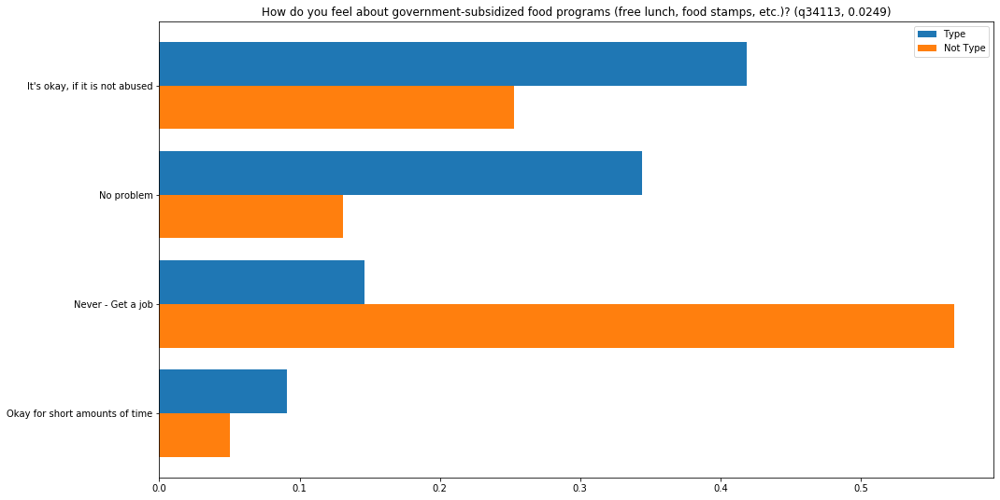

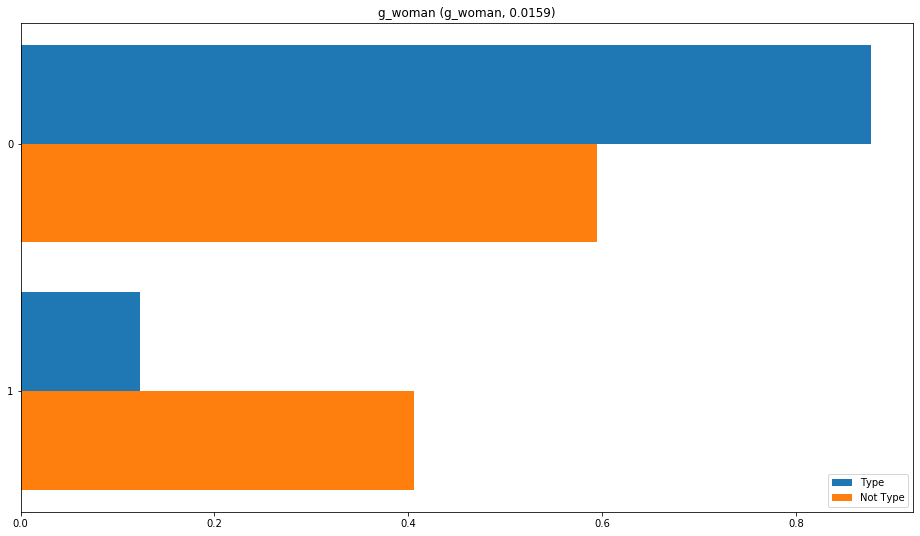

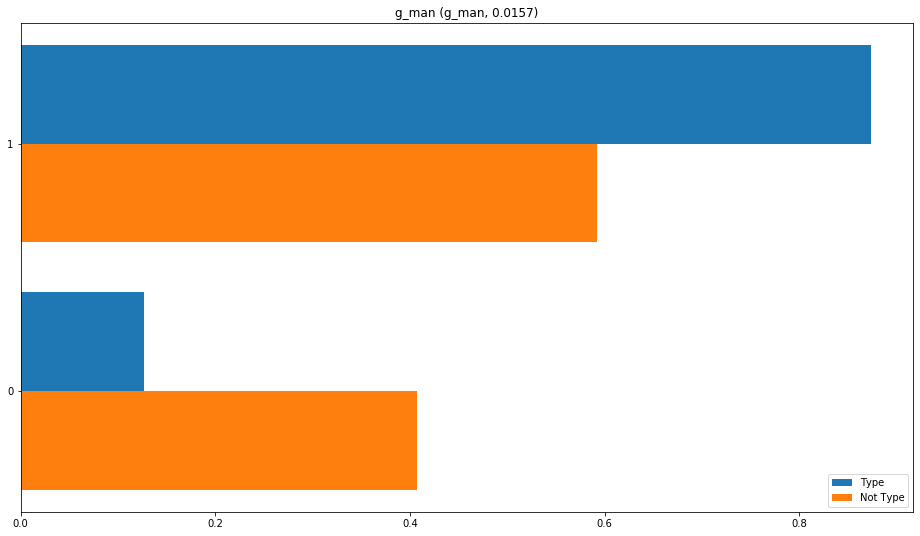

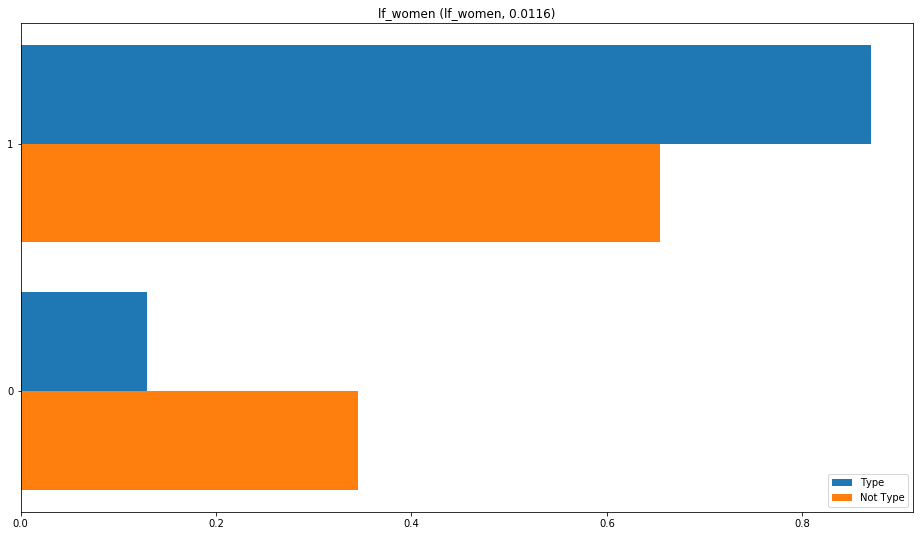

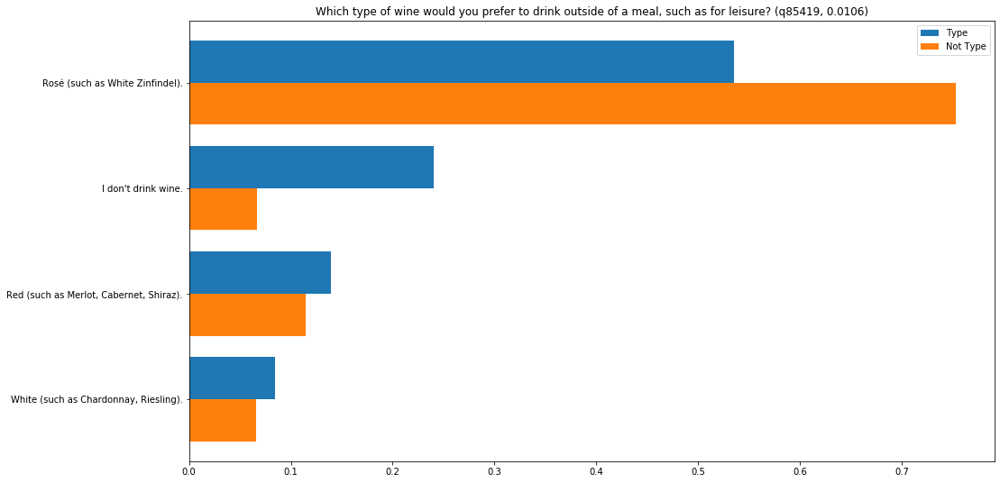

...

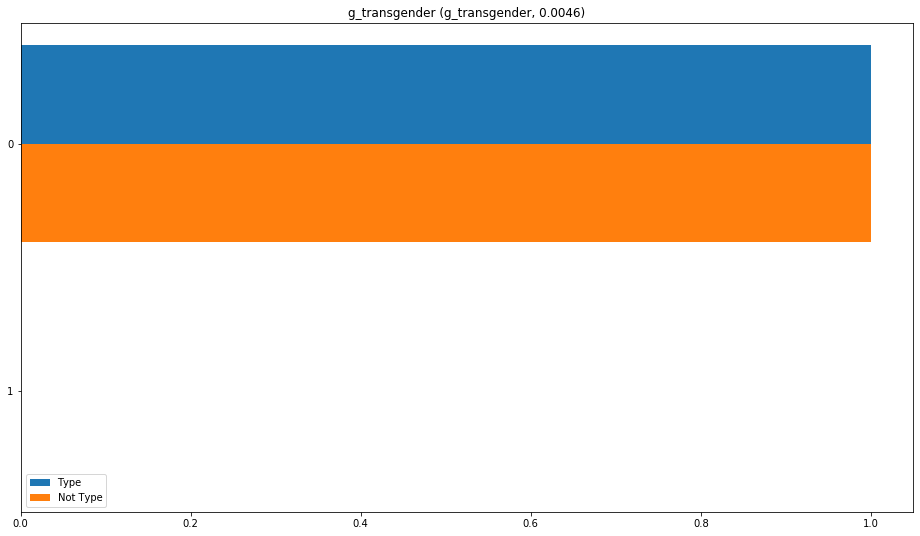

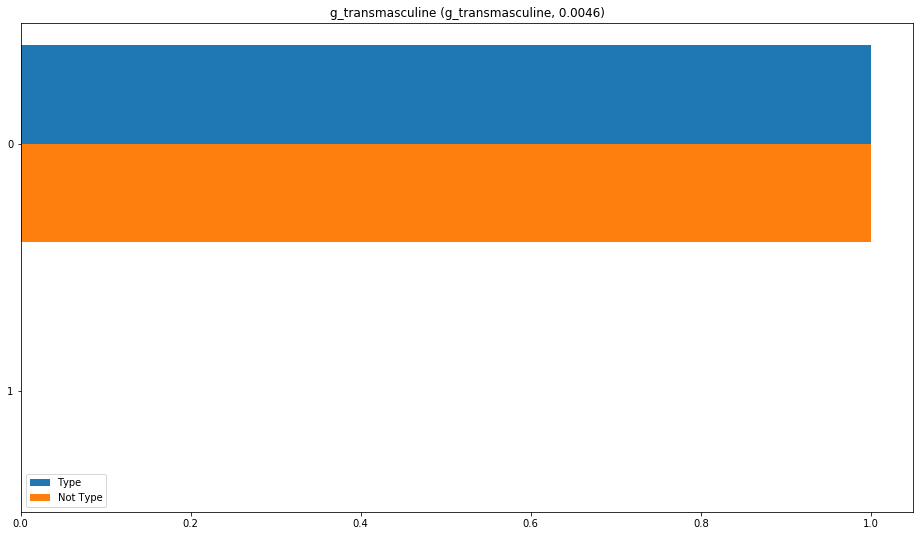

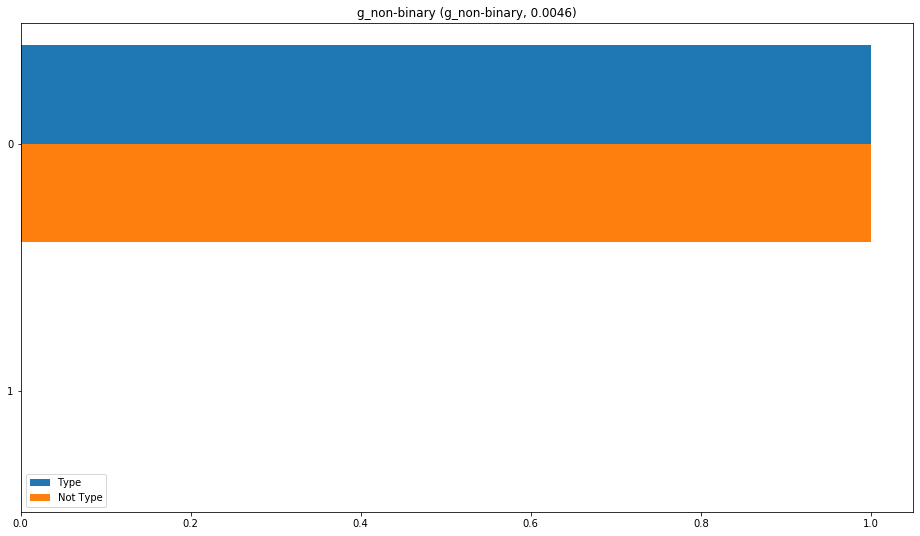

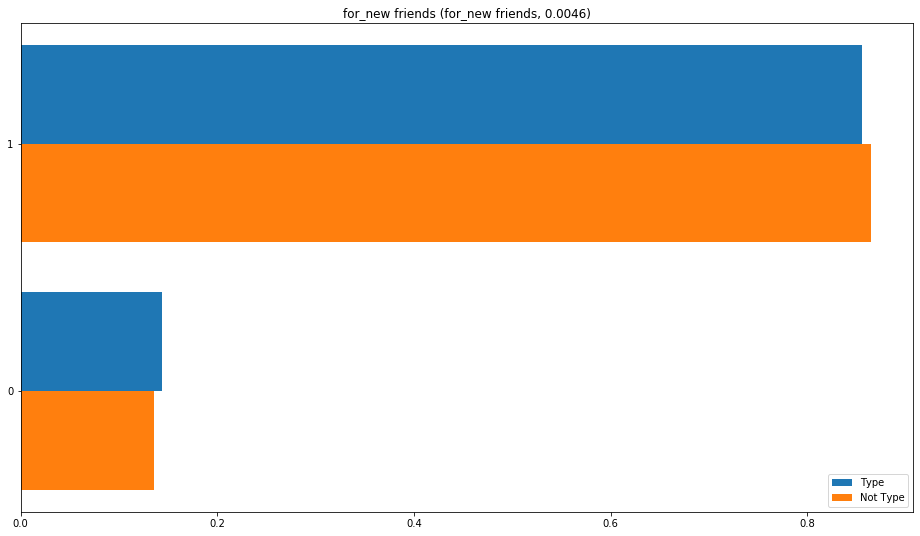

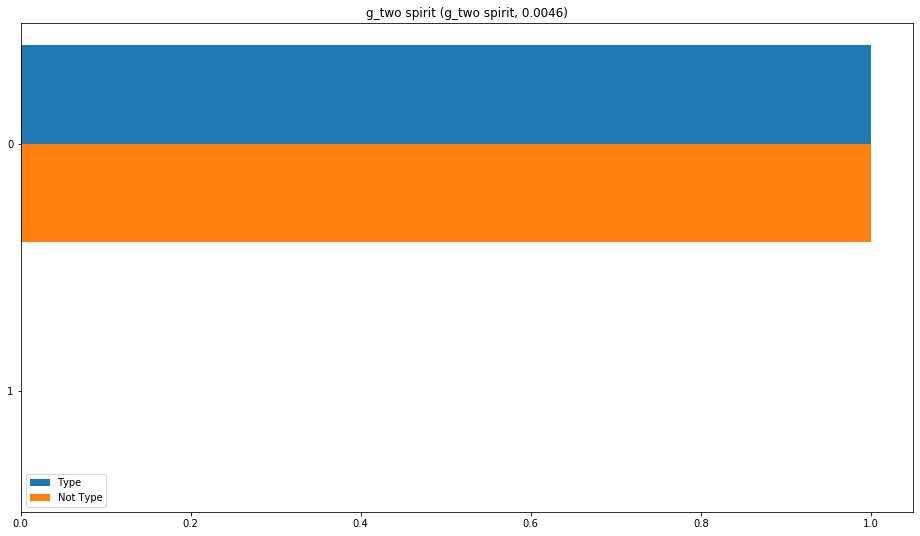

In [24]:
# report questions most strongly associated with each cluster
# scores next to each question/feature description are mutual information between the cluster and the question
plot_top_questions(0, 30)

#### Cluster 1, "True Believer" Type

True Believers tend to:
- Be men (84%) looking for women
- Support government welfare programs (`q34113`)

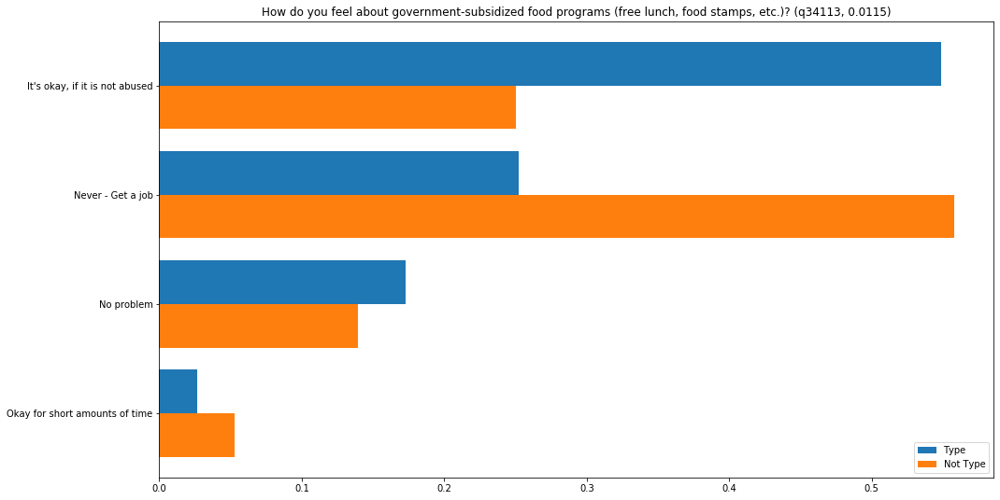

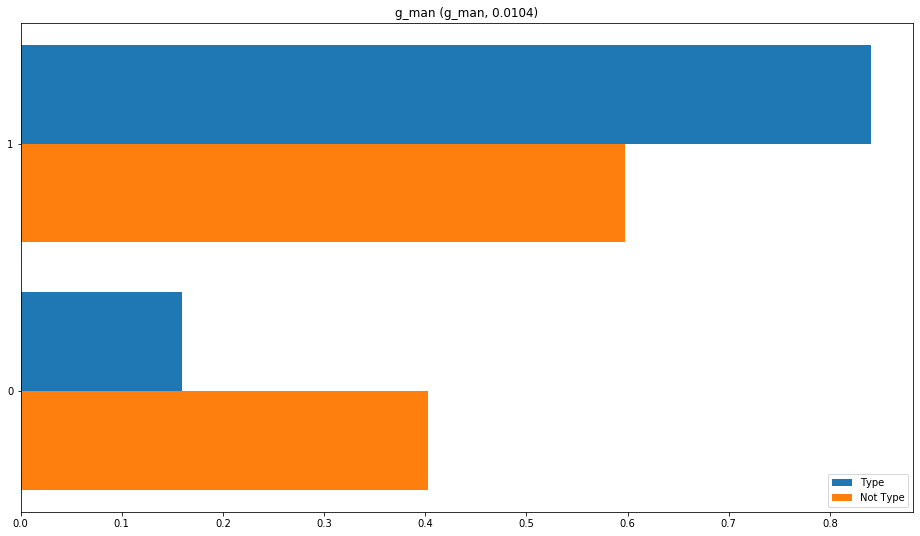

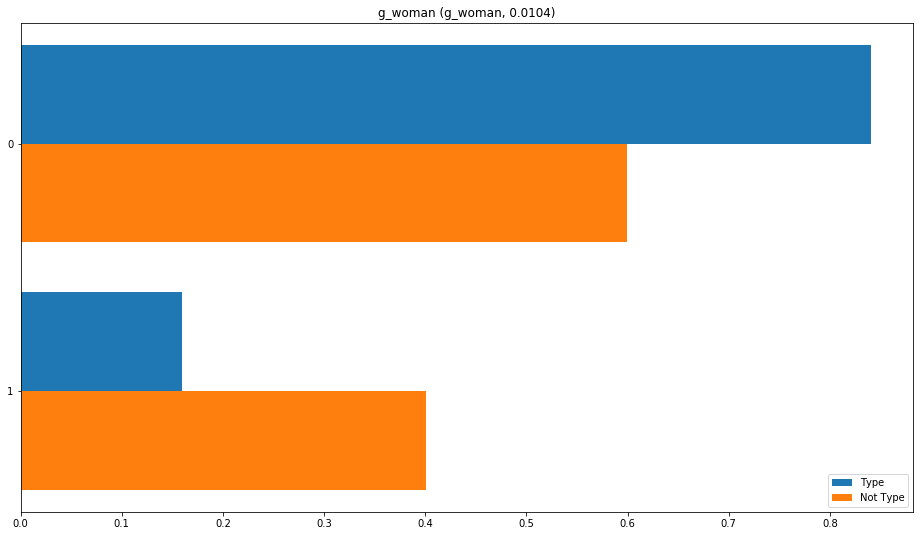

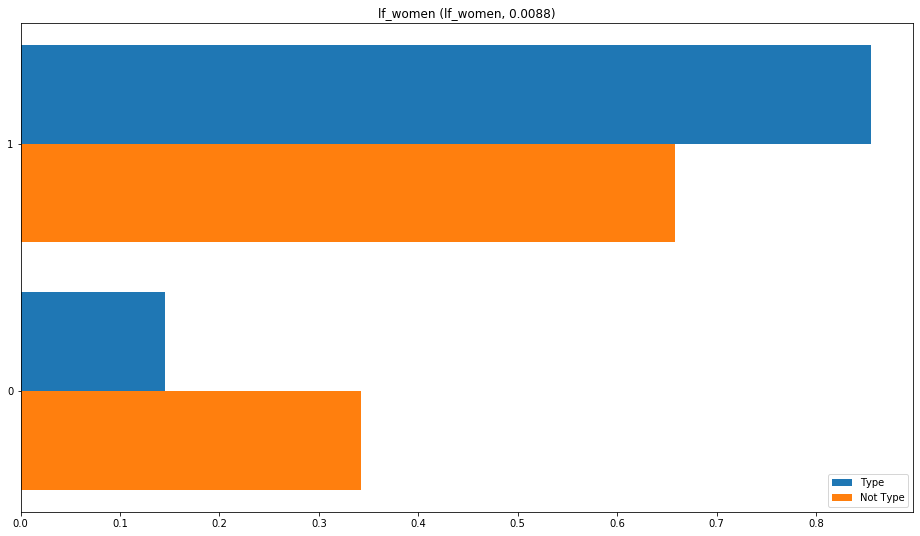

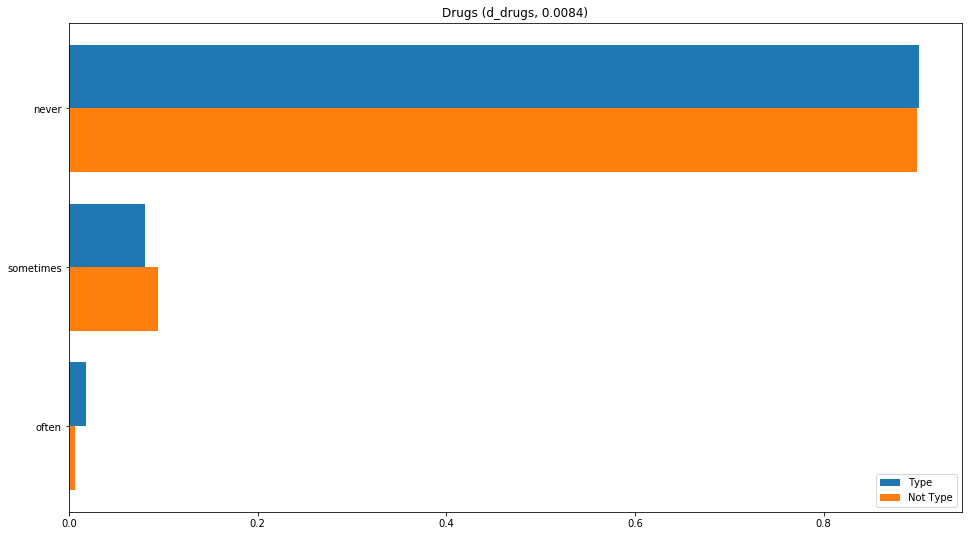

...

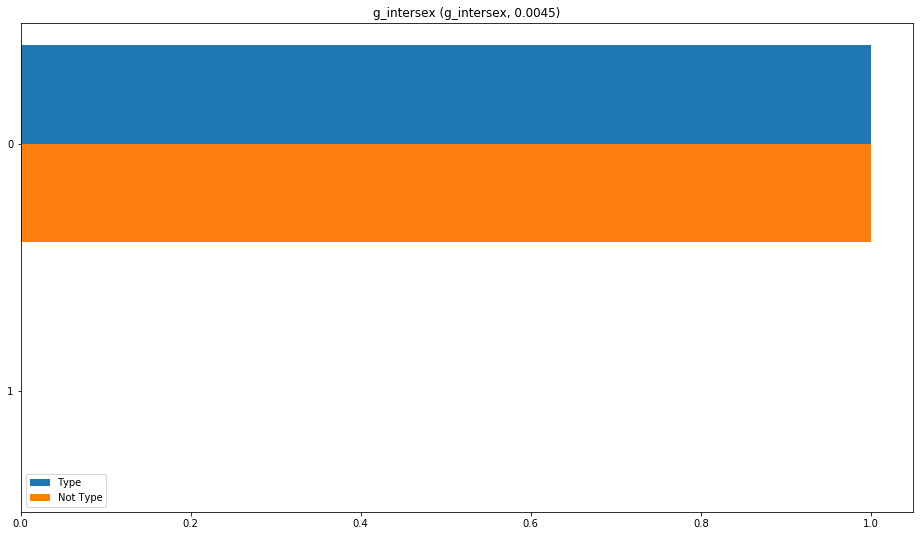

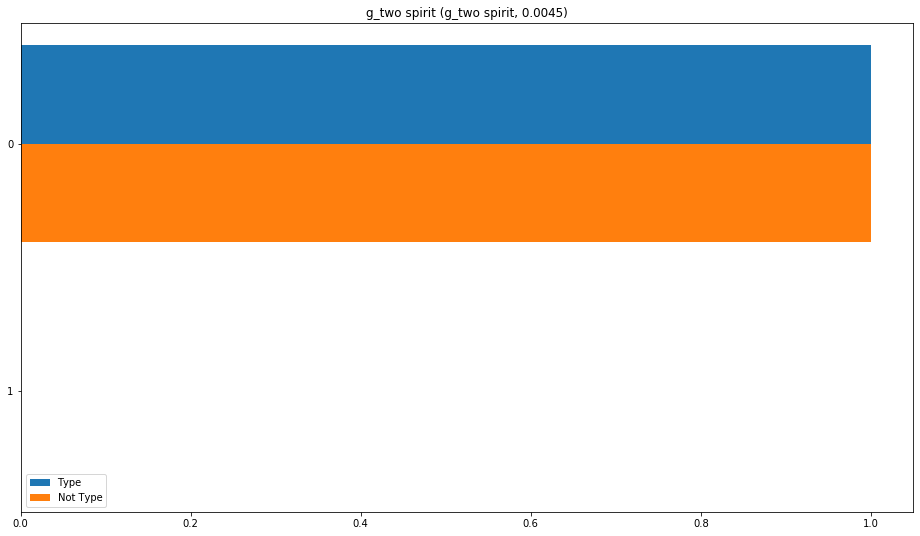

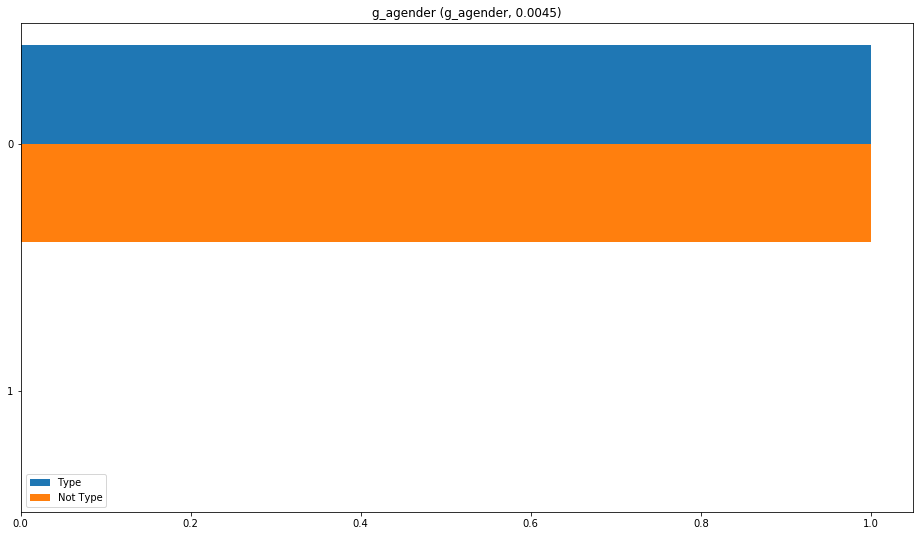

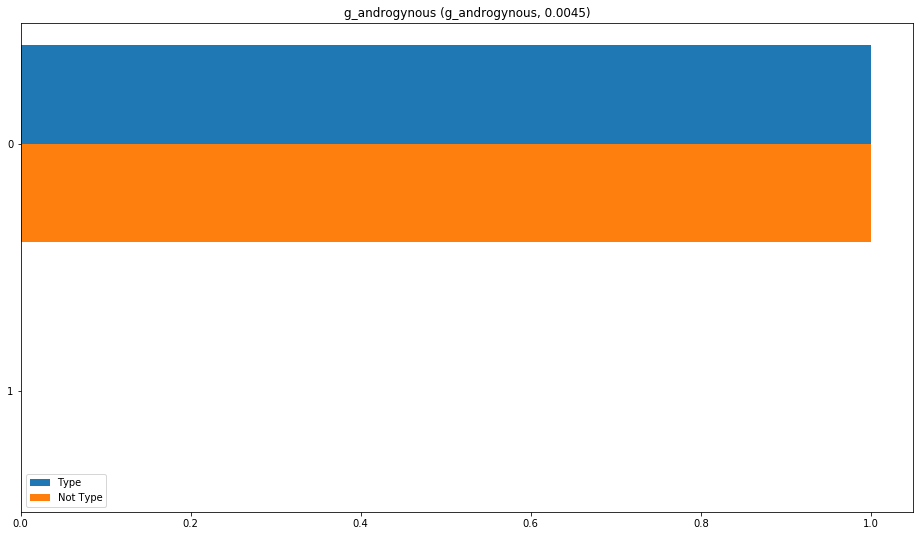

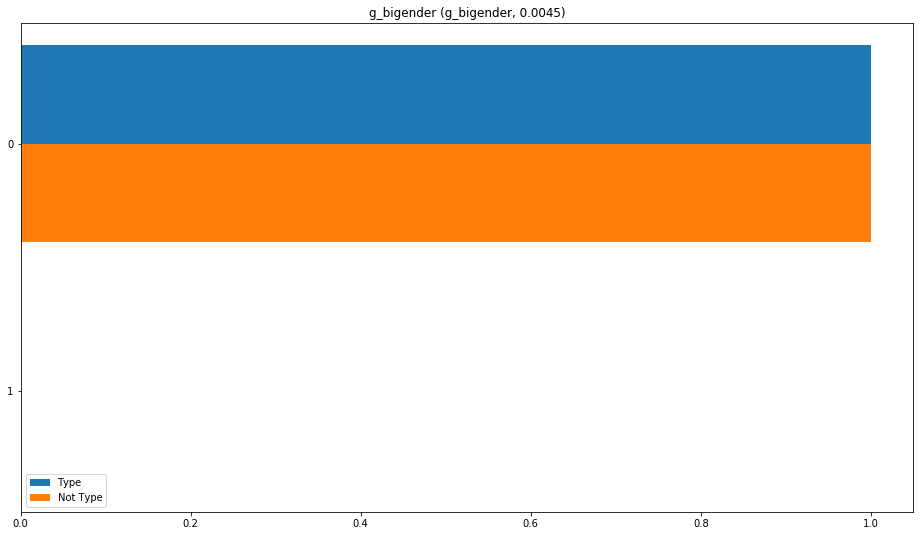

In [25]:
plot_top_questions(1, 30)

#### Cluster 2, "Feminine" Type

Femmes tend to:
- Be women looking for men
- Consistently shave armpits (`q32855`)
- Prefer submissive sexual roles (`q463`, `q18530`, `q29`, `q28545`)
- Prefer taller partners (`q13669`, `q66544`)
- Be uninterested in group sex (`q32`)
- Own sexy underwear (`q65043`)
- Prefer partners of similar age or older (`q31920`)
- Wait for sex (`q1597`)
- Not play video games (`q37693`)

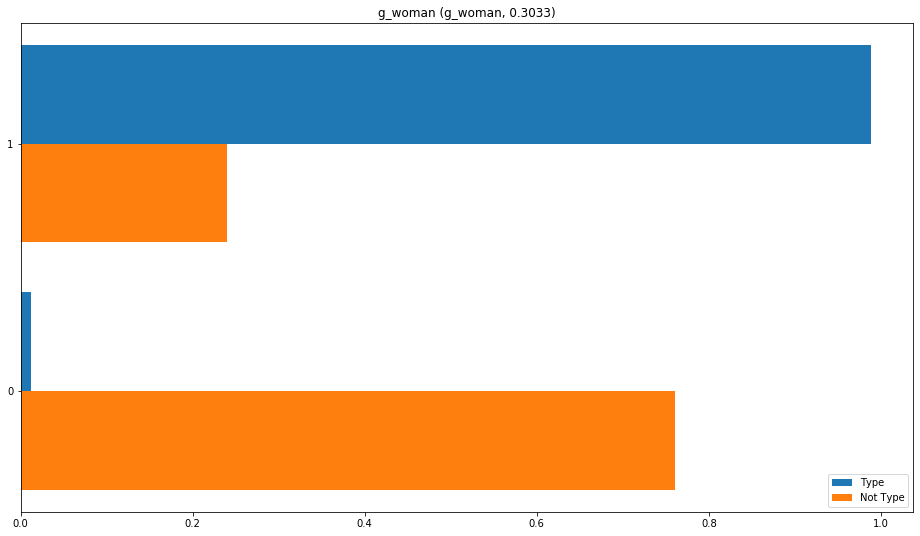

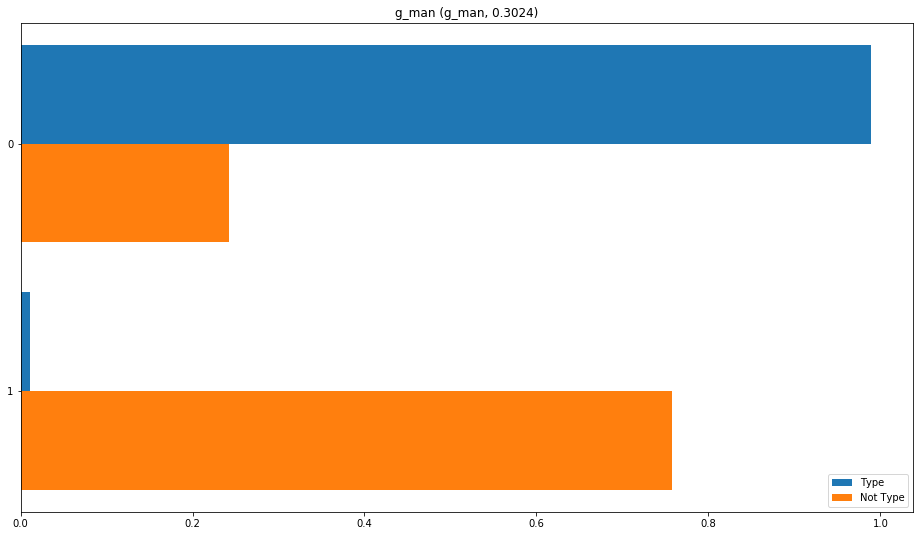

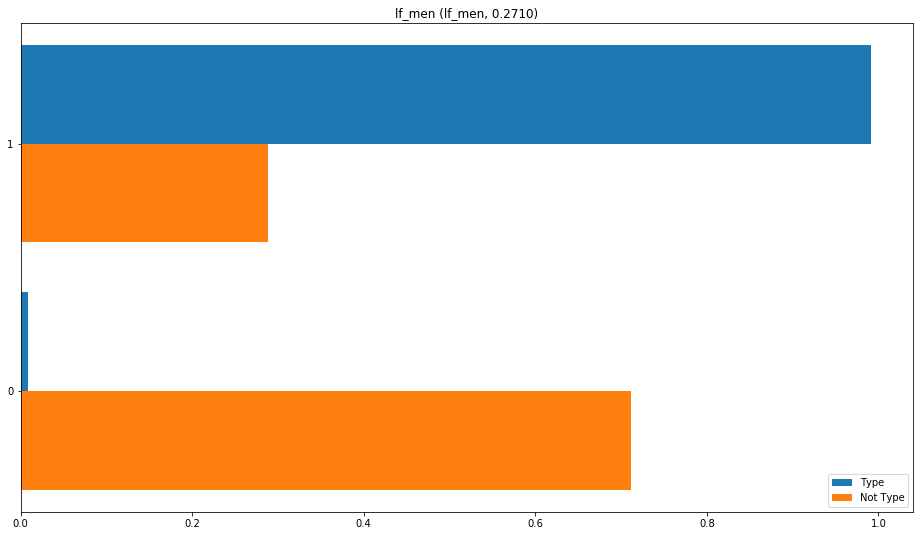

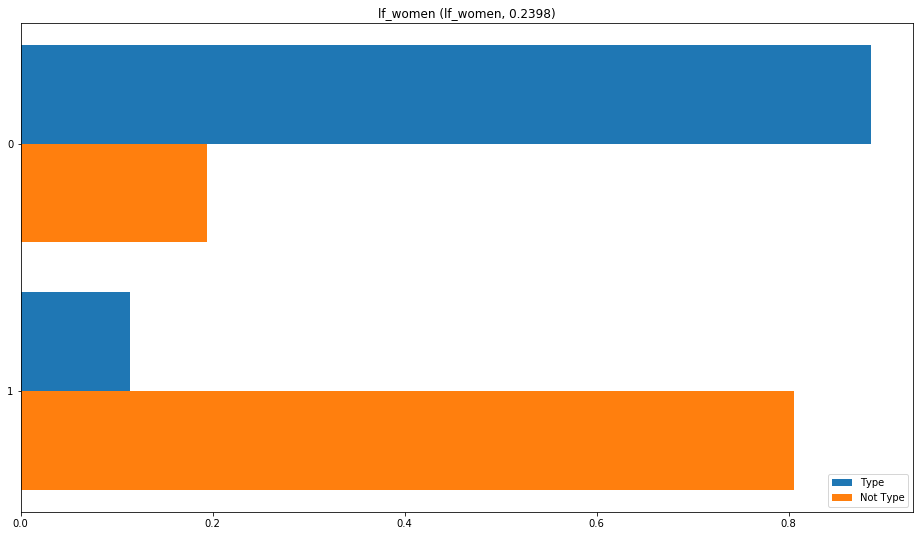

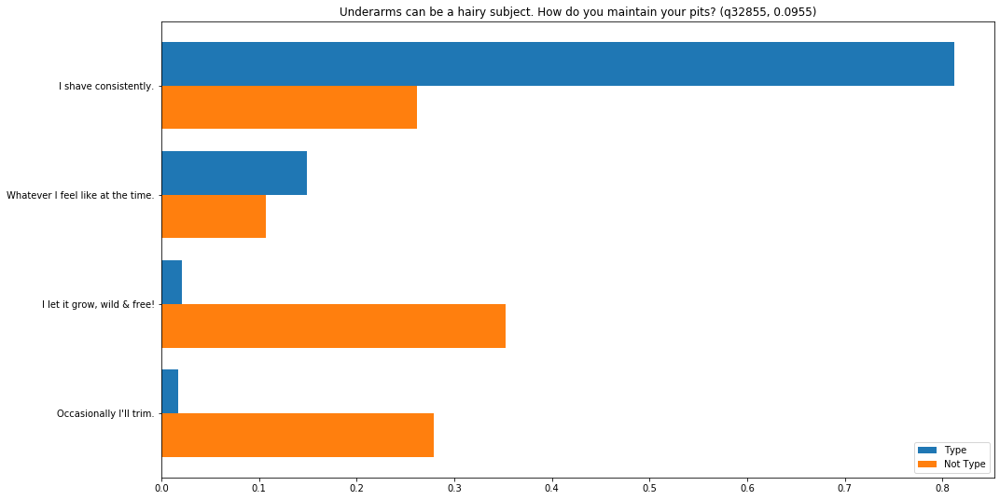

...

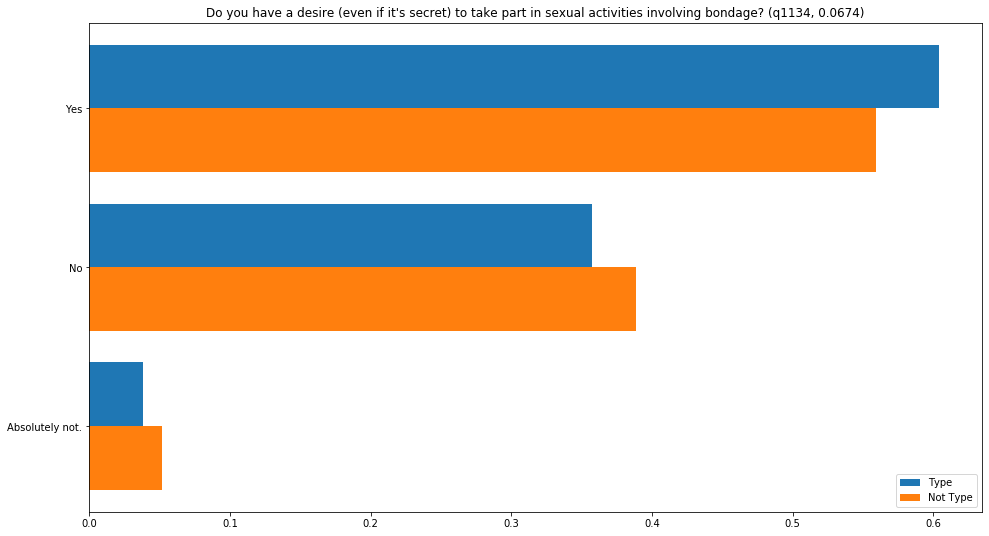

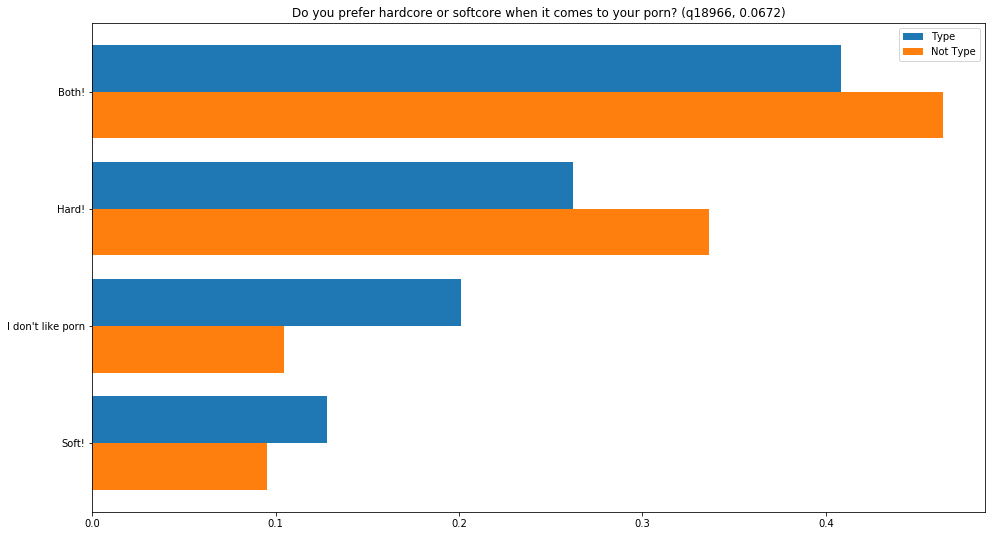

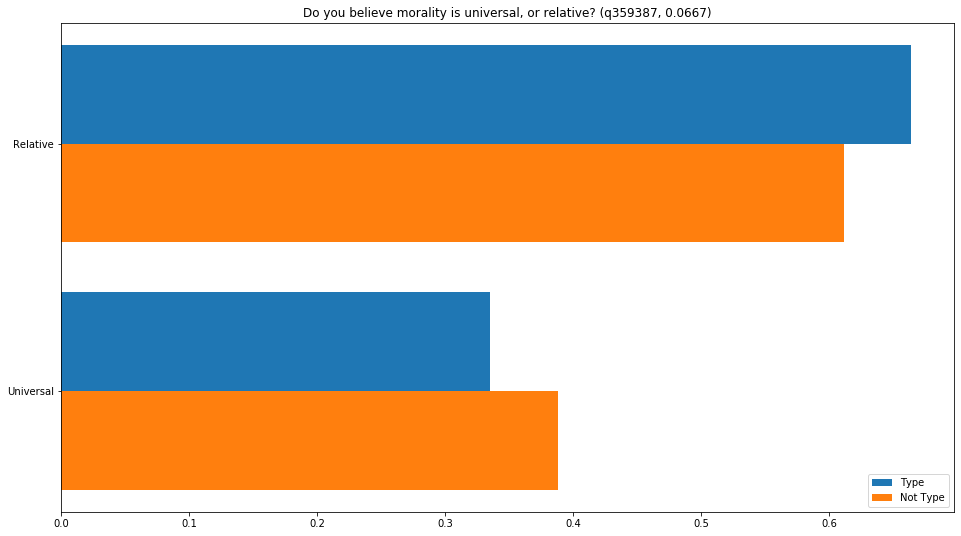

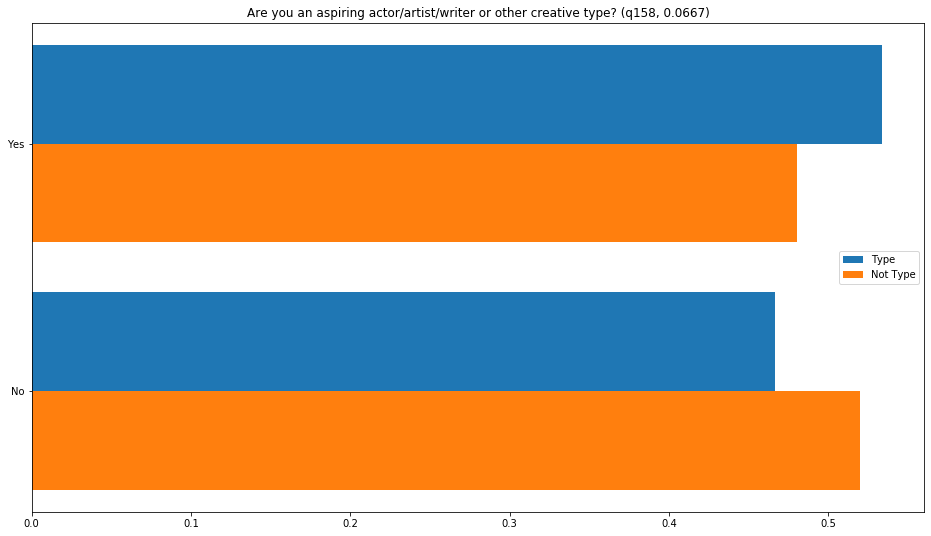

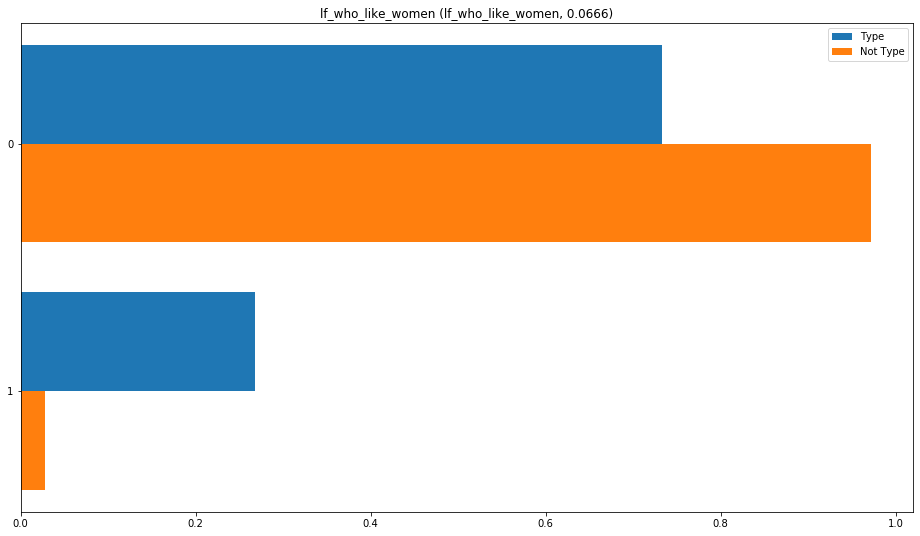

In [26]:
plot_top_questions(2, 30)

#### Cluster 3: "Mundane" Type

Mundanes tend to:
- Be men looking for women
- Describe their bodies as "average" or "a little extra" (`d_bodytype`)
- Have a 2- or 4-year college education (`d_education_type`)
- Be employed in "technology", "science / engineering", "construction", and "other" (`d_job`)
- Want their partner to be the main caretaker for their children (`q85730`)
- Endorse verbal communication as an adequate in the absence non-verbal communication in relationships (`q69429`)
- Describe their self-confidence as "average" (`q20930`)

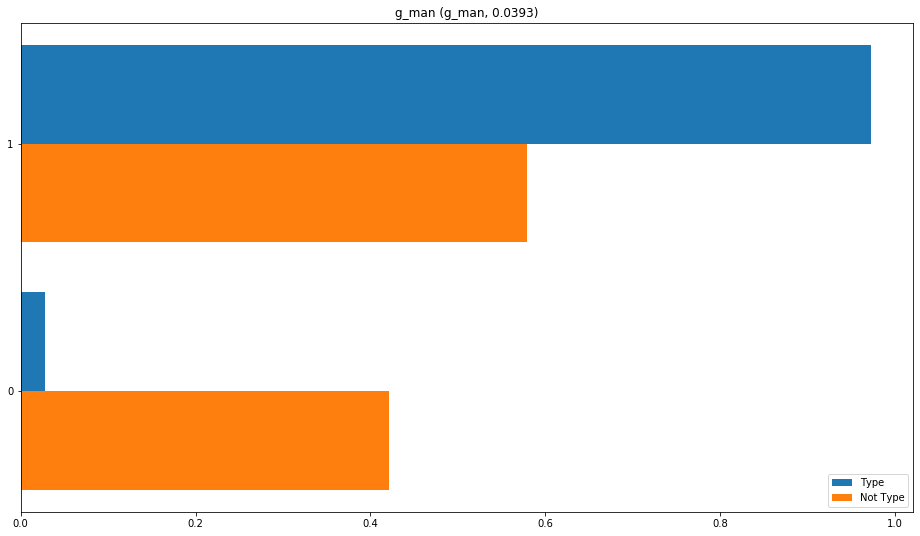

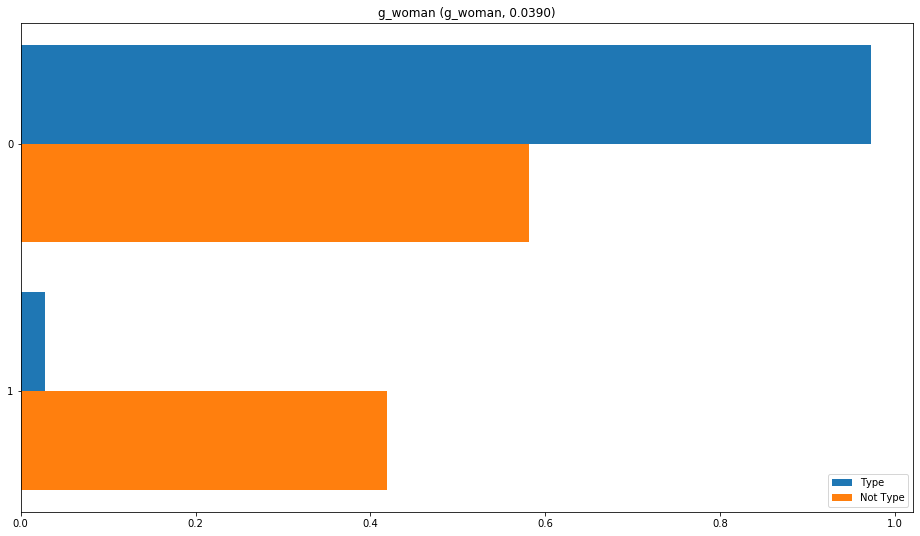

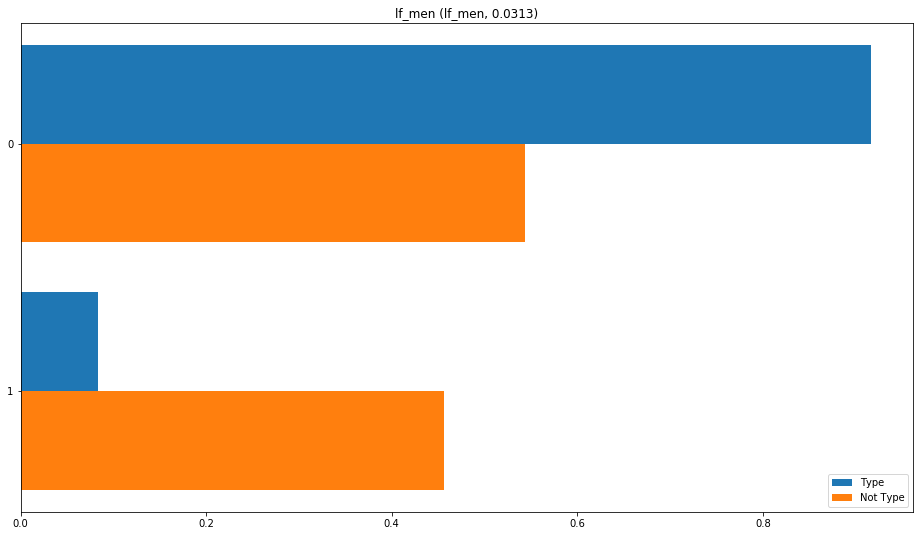

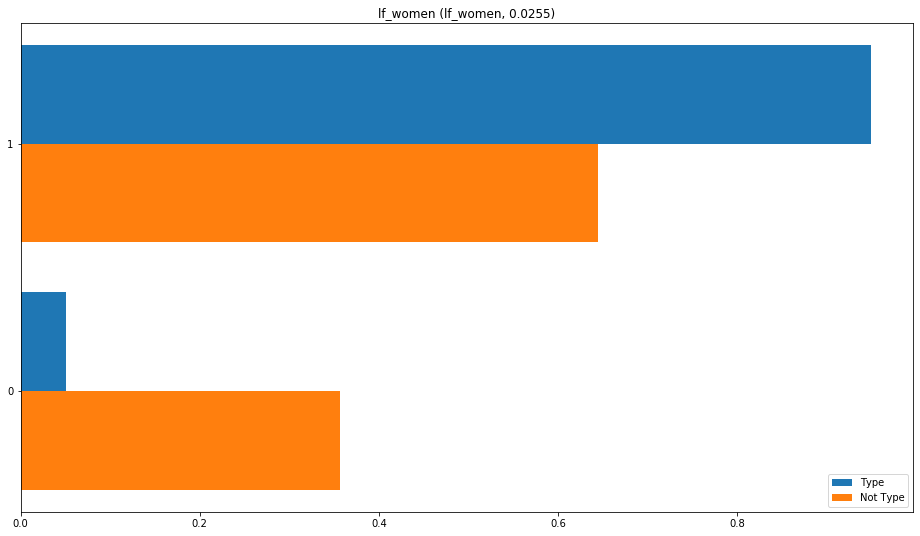

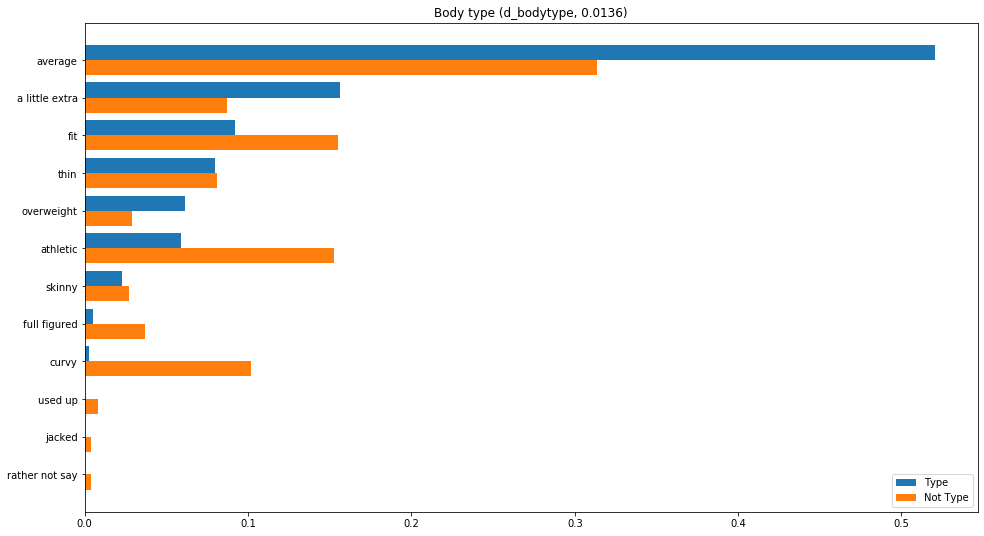

...

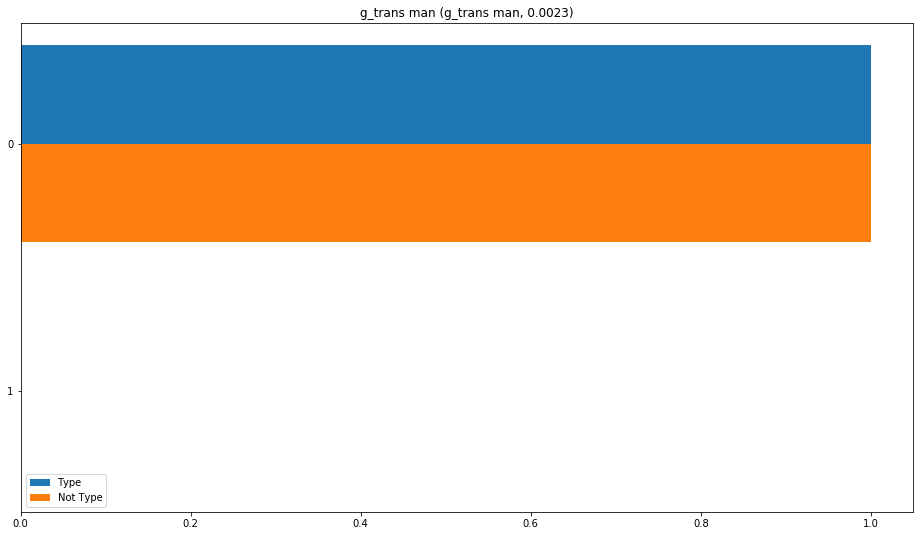

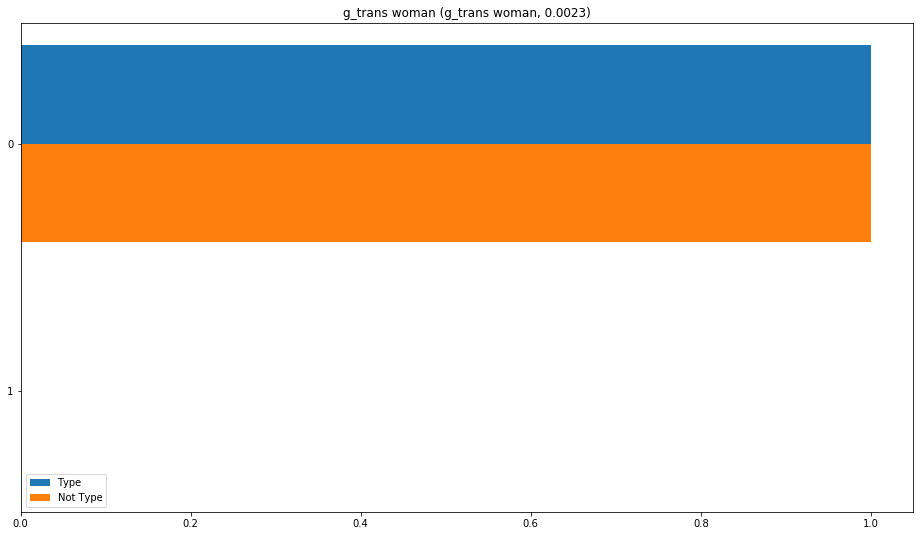

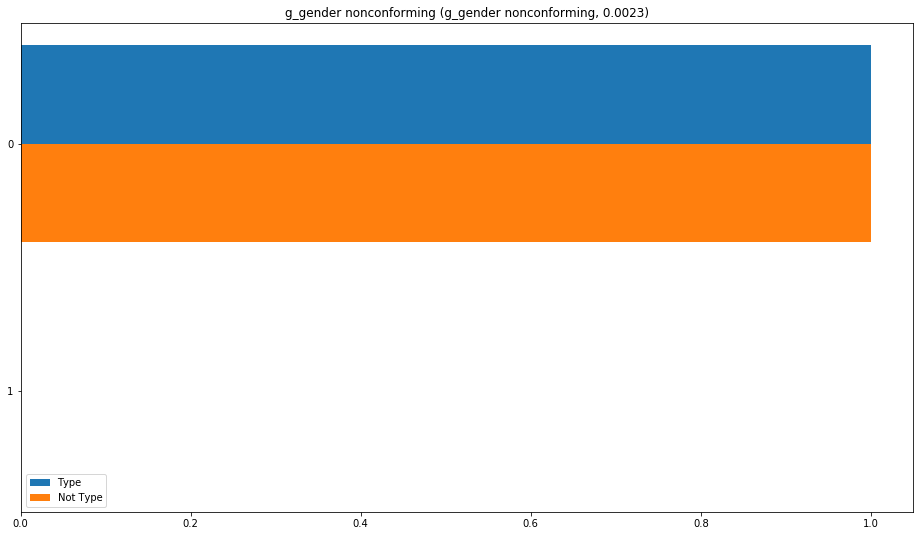

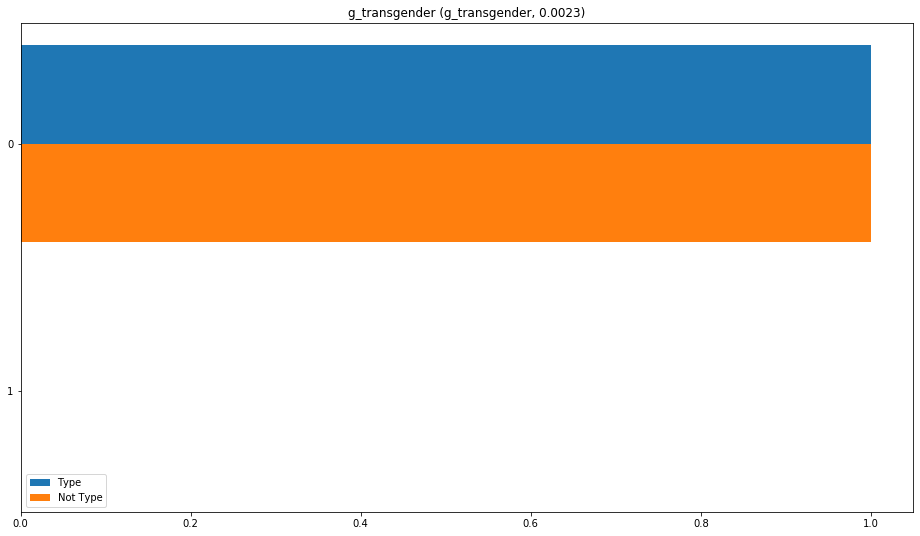

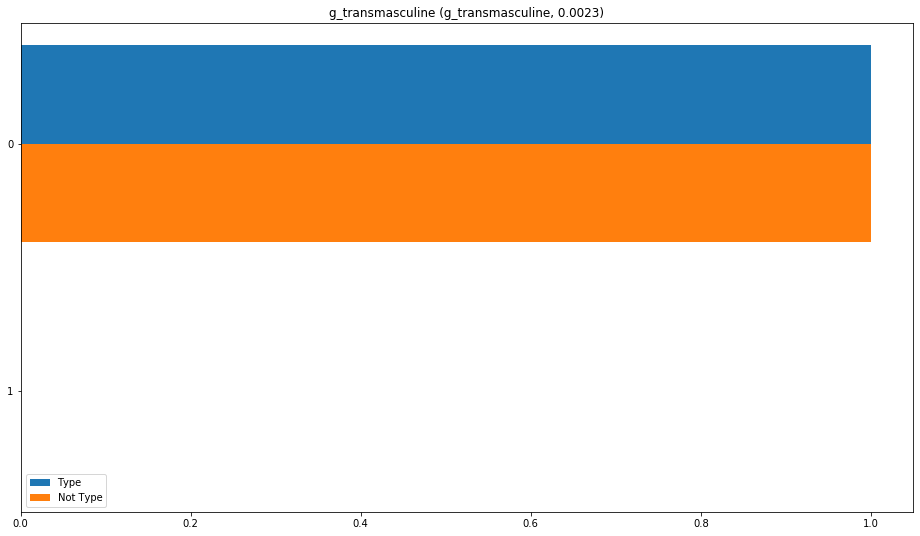

In [27]:
plot_top_questions(3, 30)

#### Cluster 4: "Playmate" Type

Playmates tend to:
- Be women looking for men for short-term dating
- Endorse or participate in homosexual sex (`q1401`)
- Support government welfare programs (`q34113`)
- Describe their bodies as "curvy", "average", "full figured", or "thin" (`d_bodytype`)
- Endorse recreational drug use (`q9688`), and are more likely to have used drugs than others (`q80`, `q79`)
- Be employed in "art / music / writing", "entertainment / media", or "other" (`d_job`)
- Disapprove of guns (`q62649`)
- Would rather be weird than normal (`q48`)

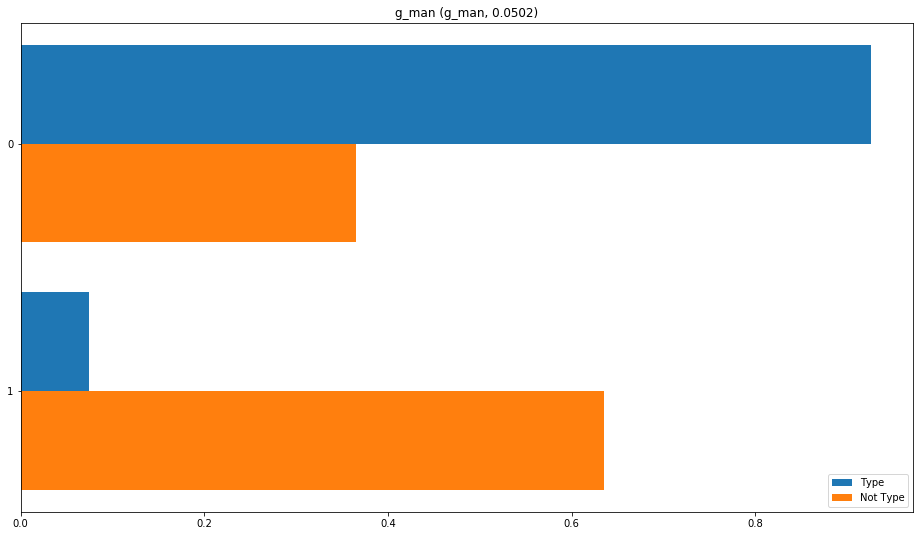

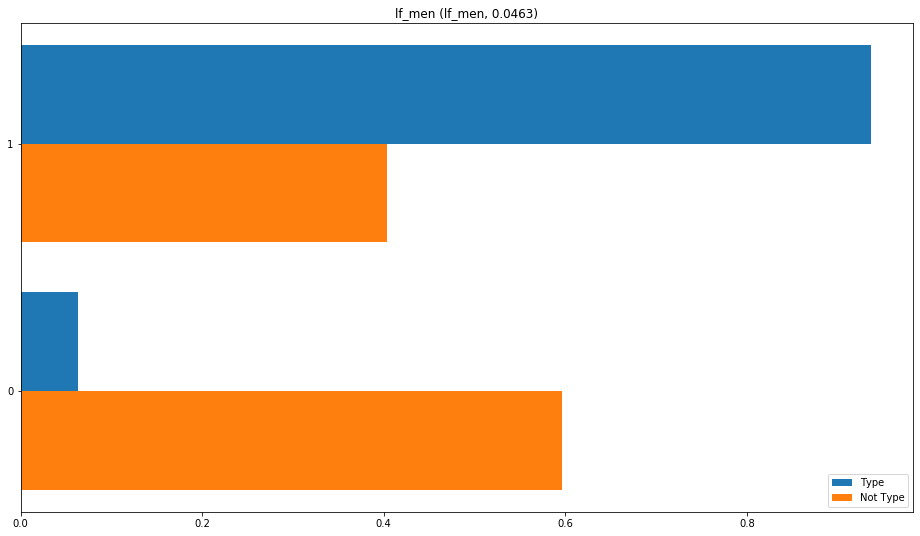

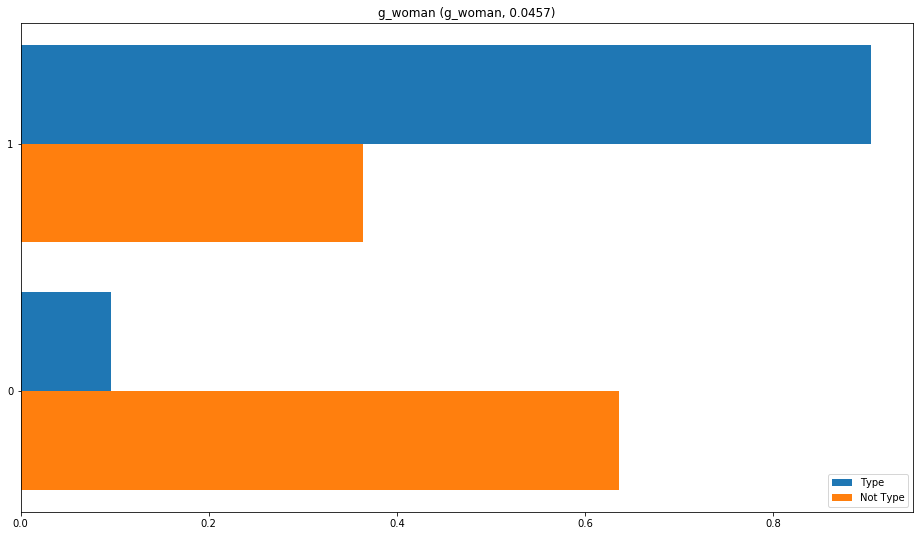

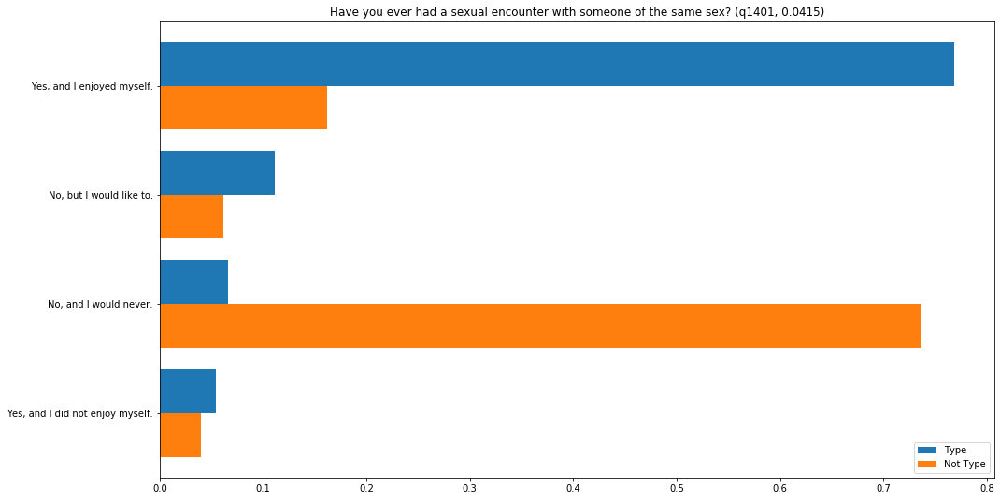

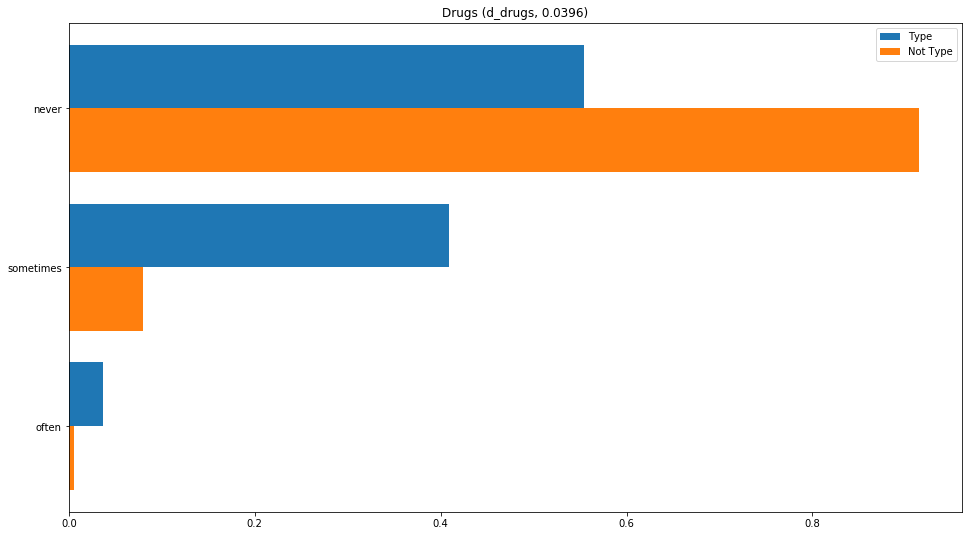

...

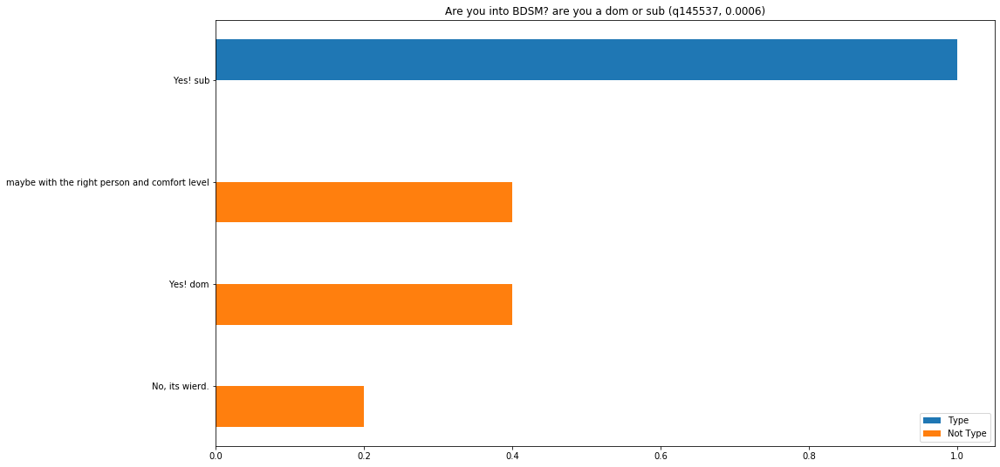

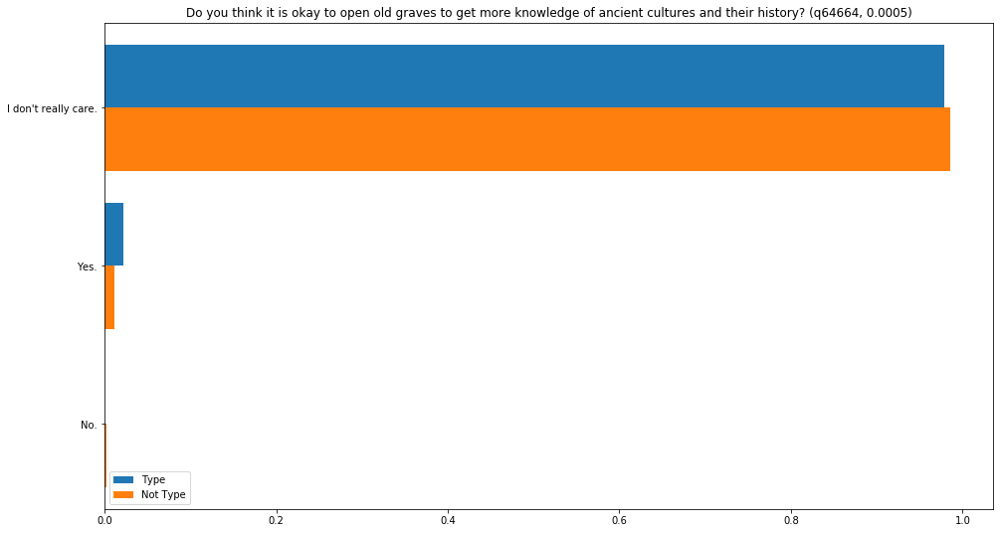

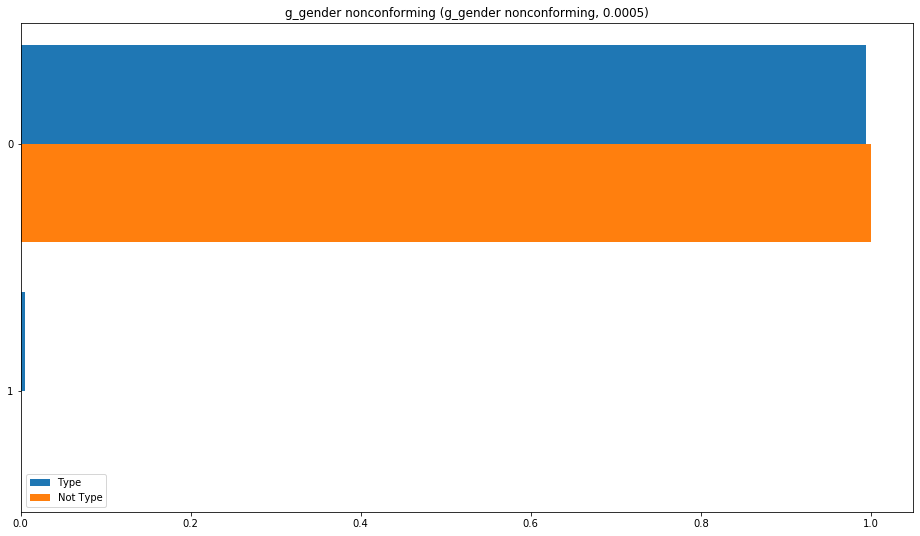

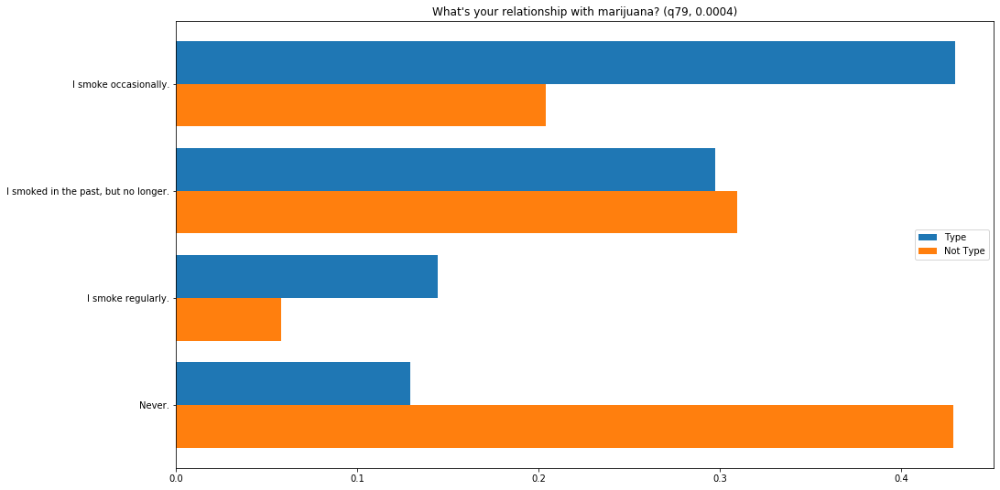

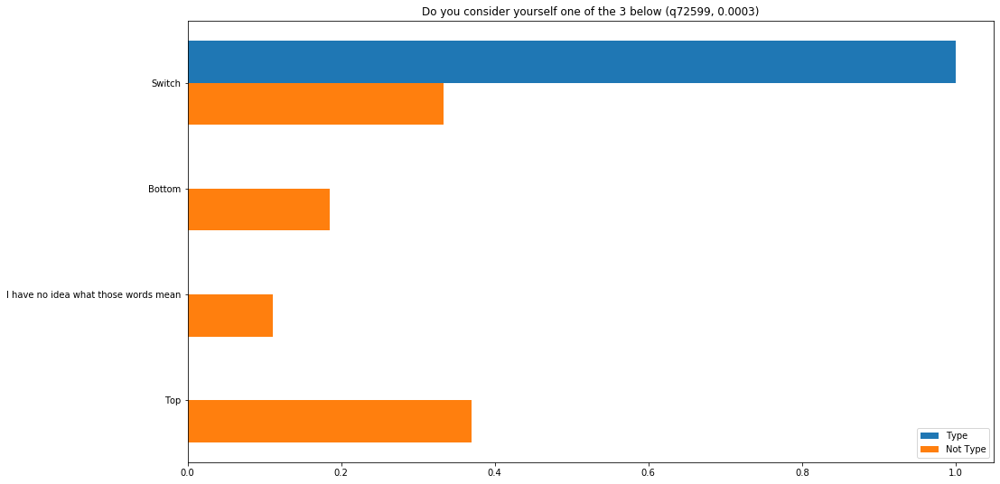

In [28]:
plot_top_questions(4, 30)

#### Cluster 5: "Life of the Party" Type

Lives of the Party tend to:
- Be men looking for women, for short-term dating (`for_short-term dating`)
- Mostly not use recreational drugs (`d_drugs`, `q80`), but admit to past use (`q79`, `q15414`), and accept drug use in others (`q9688`, `q25228`)
- Be promiscuous more than non-partiers (`q1597`, `q17`, `q24375`)
- Be open to polyamory (`q325`, `q48278`)
- Describe their bodies as "fit" or "athletic" (`d_bodytype`)
- Not practice mainstream religion (`d_religion_type`)
- Not worry (`q321`)

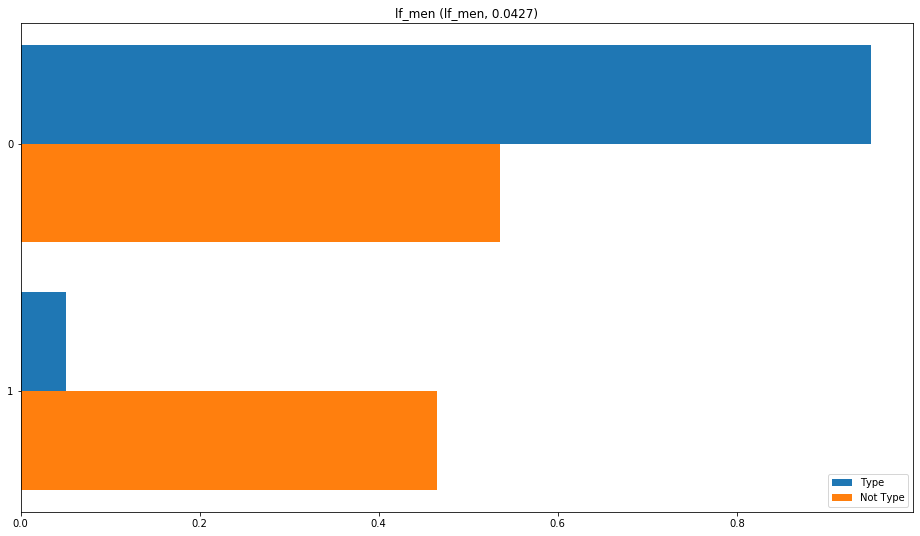

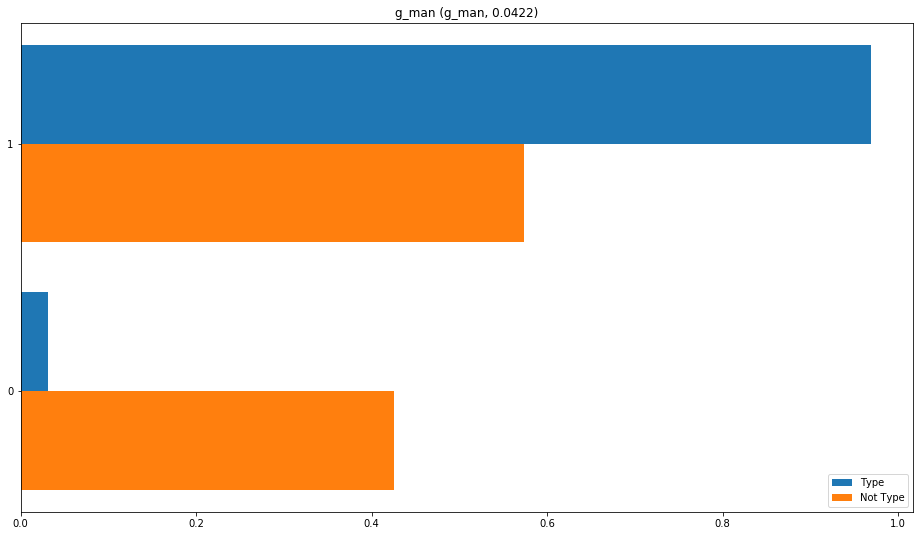

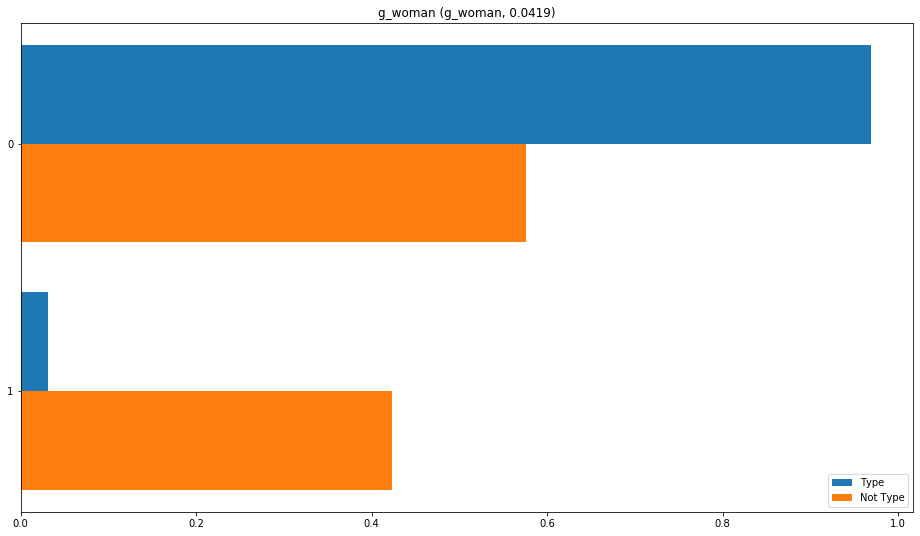

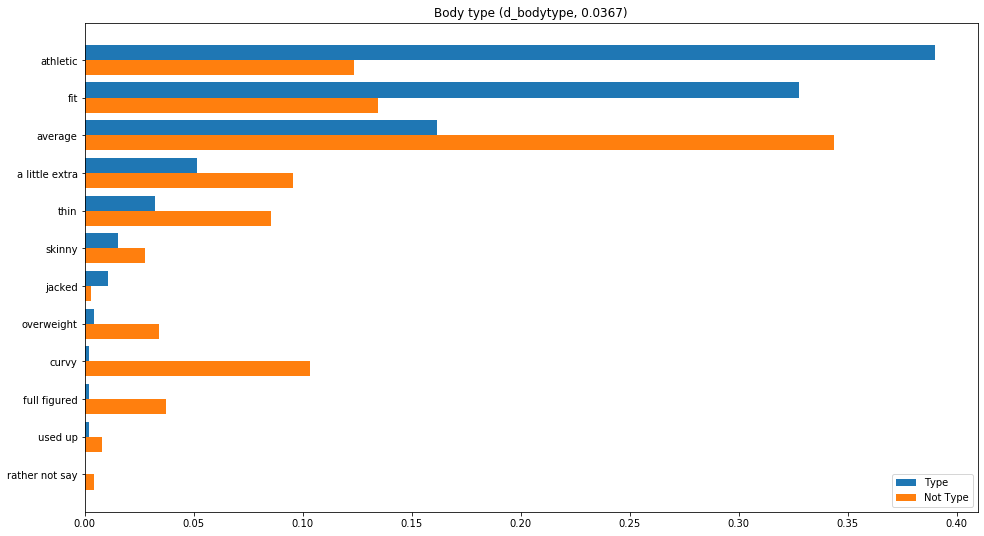

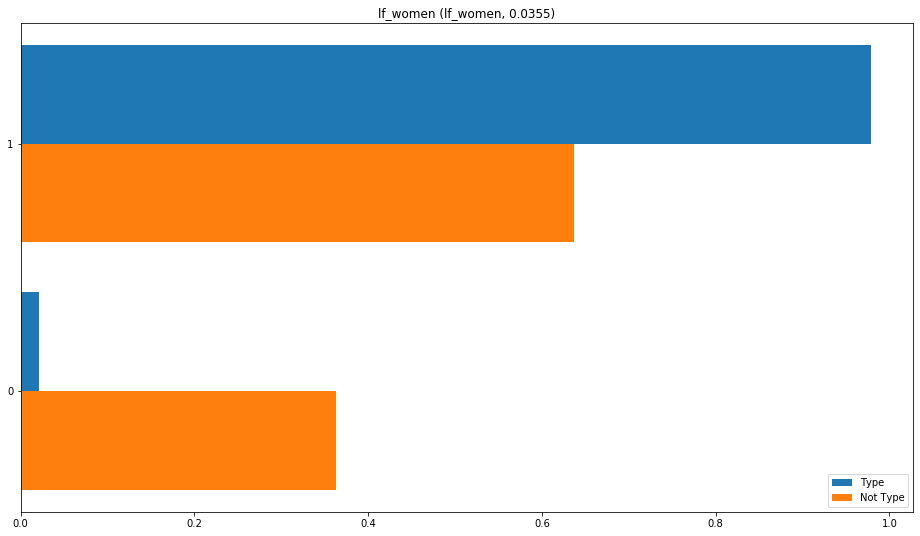

...

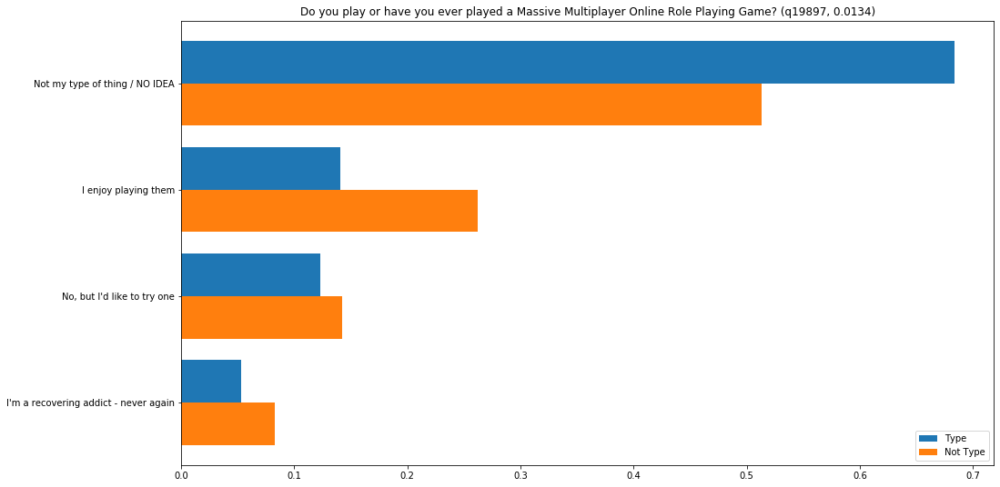

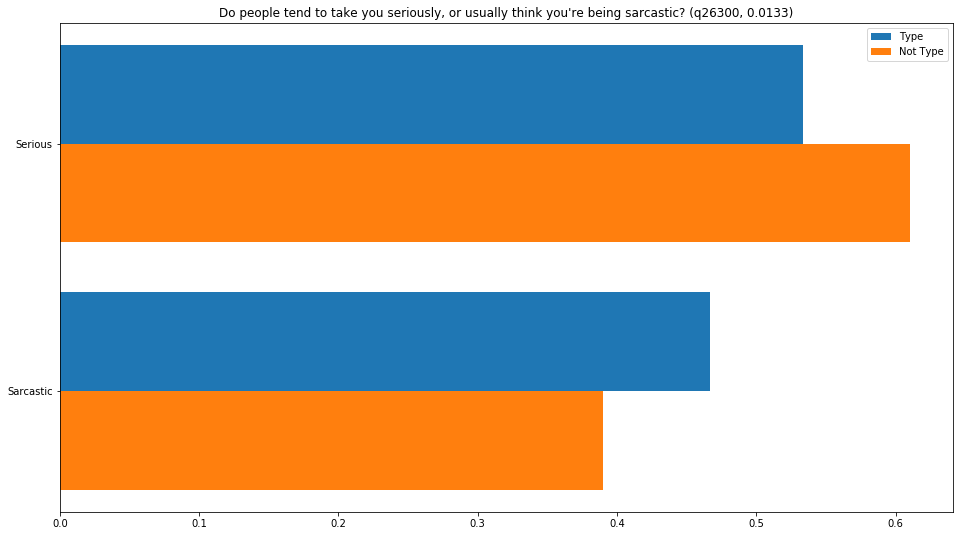

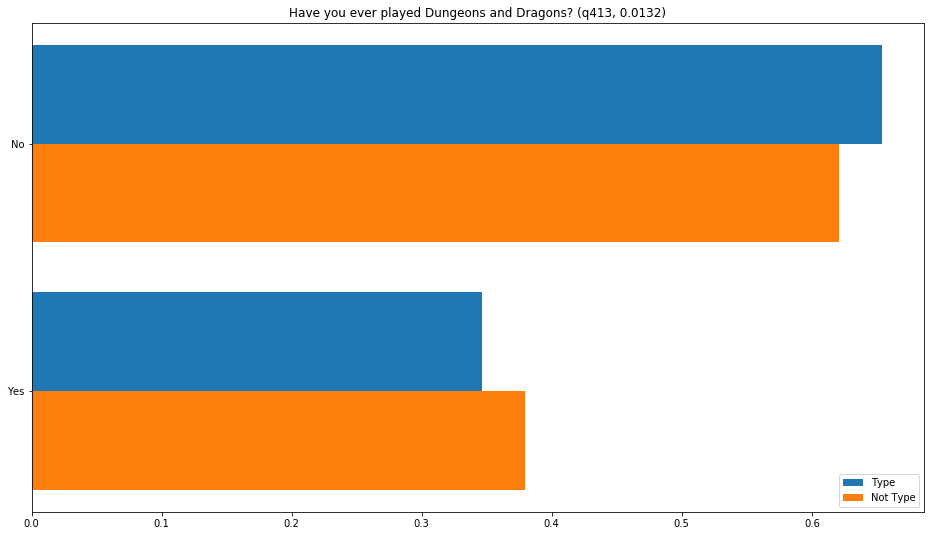

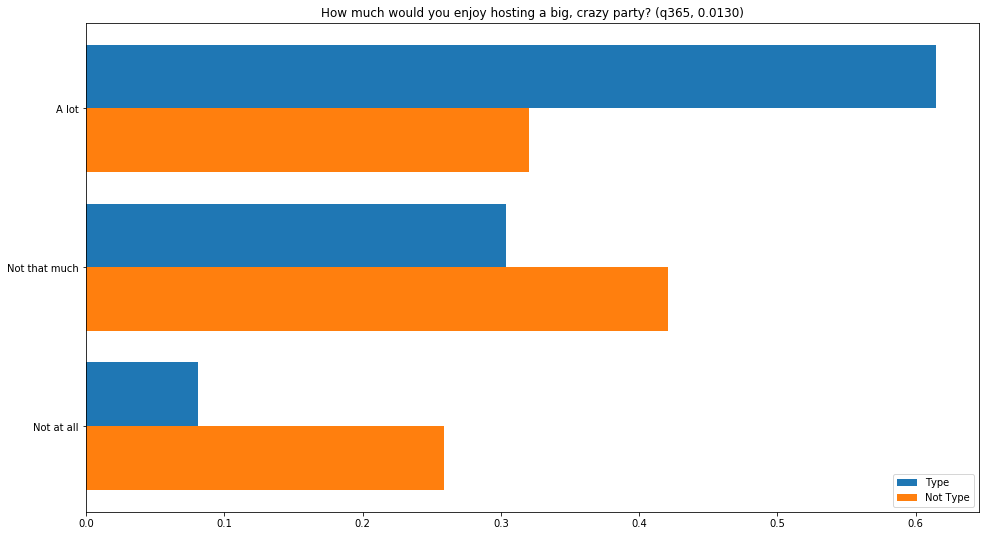

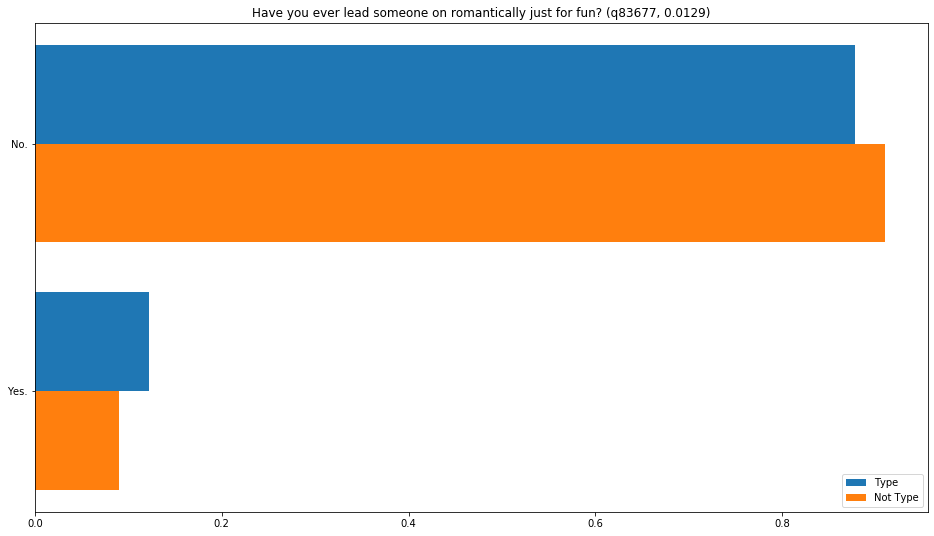

In [29]:
plot_top_questions(5, 30)

#### Cluster 6: "Grown-up" Type

Grown-ups tend to:
- Favor practicality (`q614`)
- Enjoy children (`q15698`)
- Care how their partners smell (`q18875`)
- Not have tattoos (`q128`)
- Rarely get drunk (`q8155`)
- Care about physical attractiveness (`q122`)
- Favor college education (`q19265`)
- Be atheist (`q210`)
- Prefer balanced power in relationships (`q9668`)
- Rarely get angry (`q1052`)

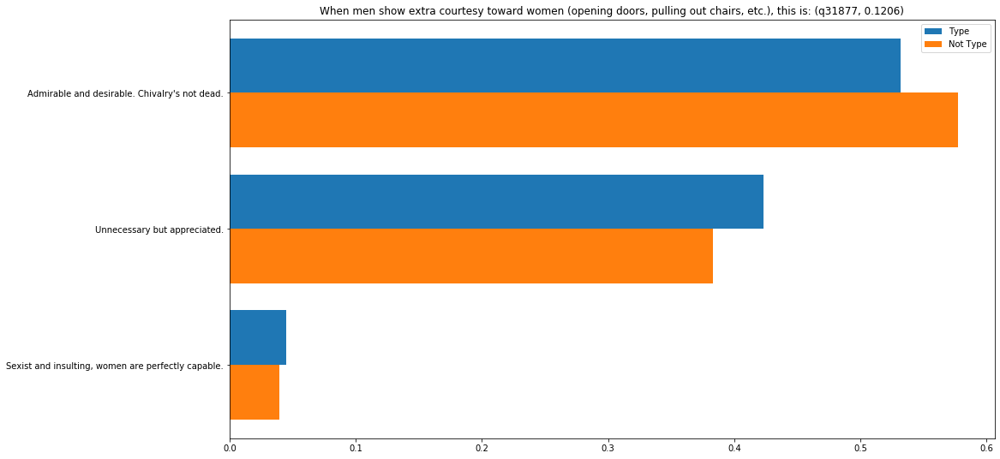

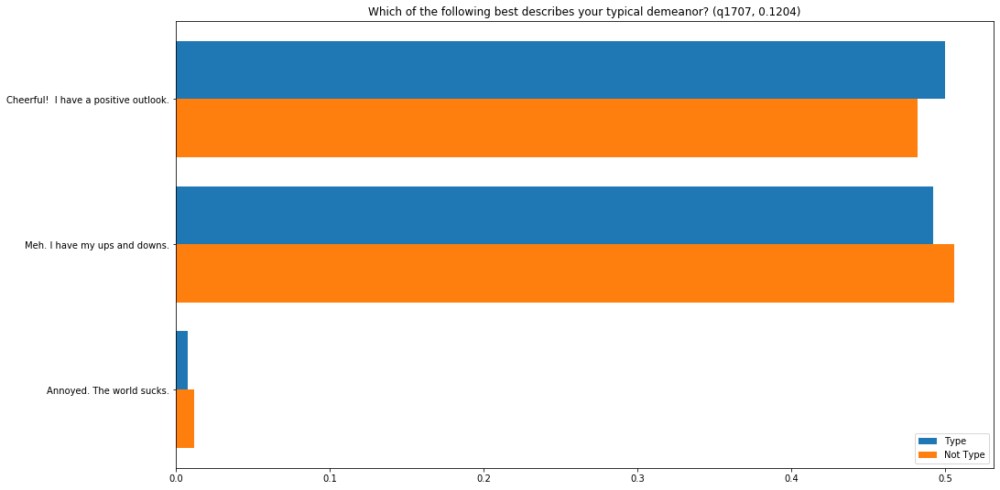

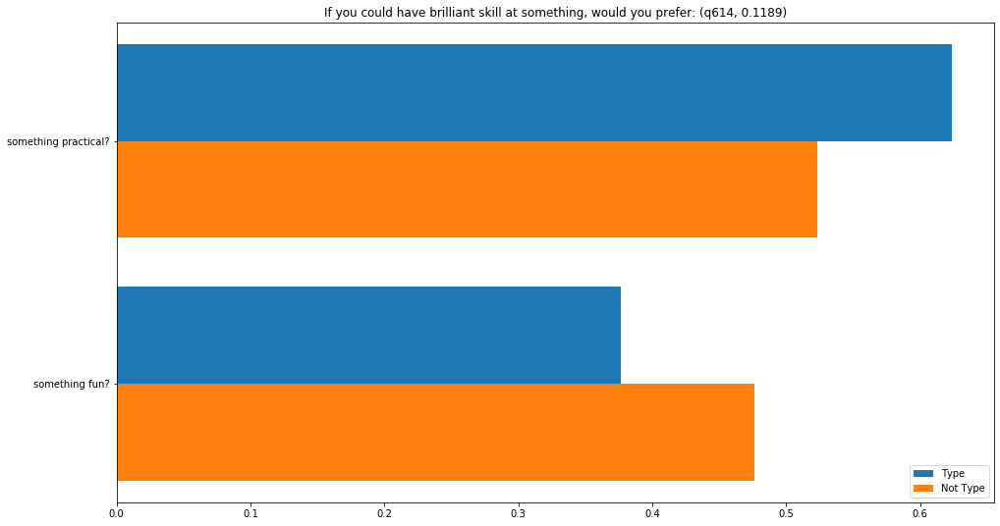

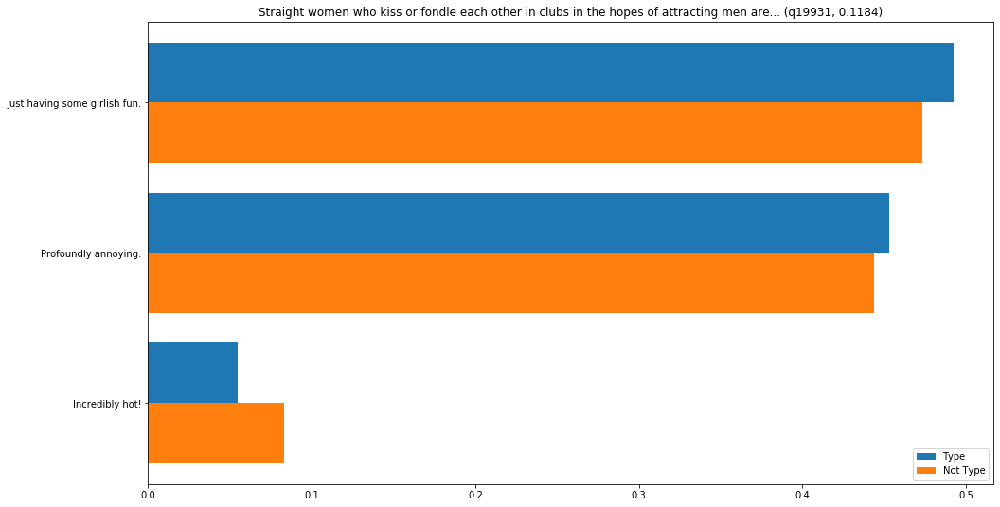

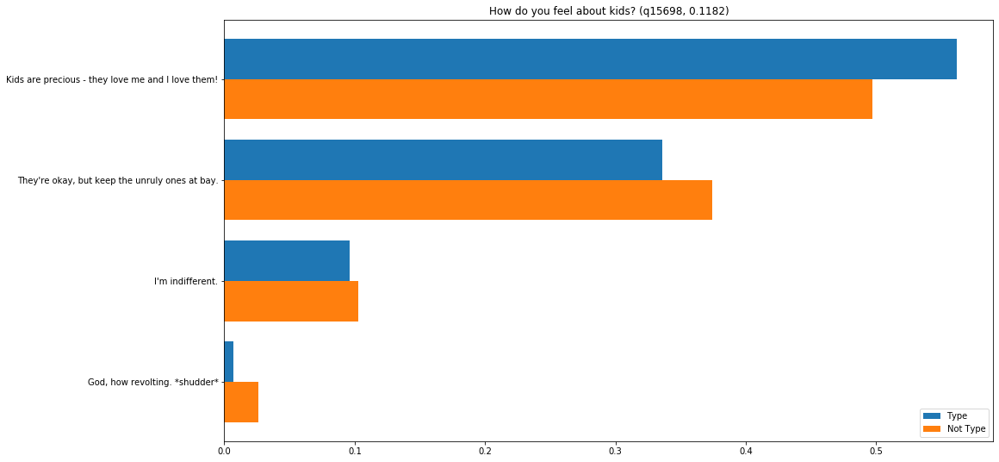

...

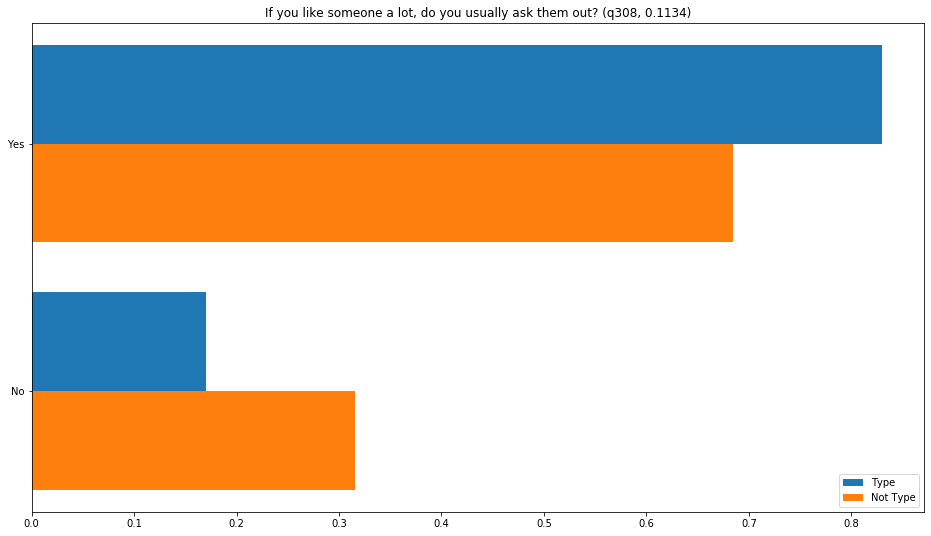

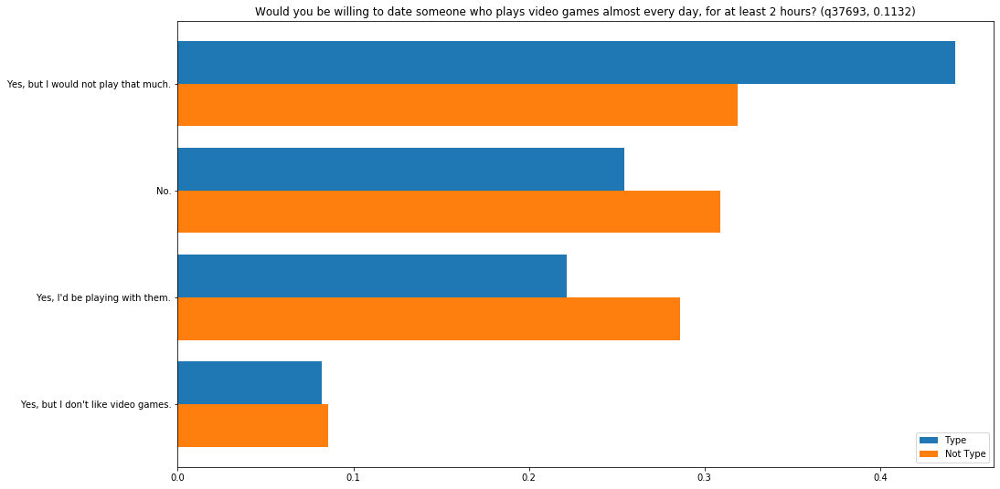

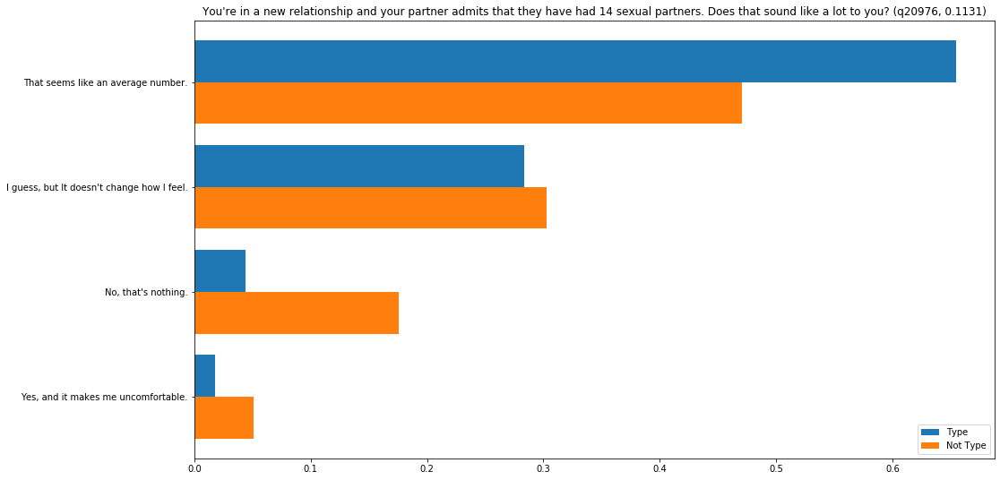

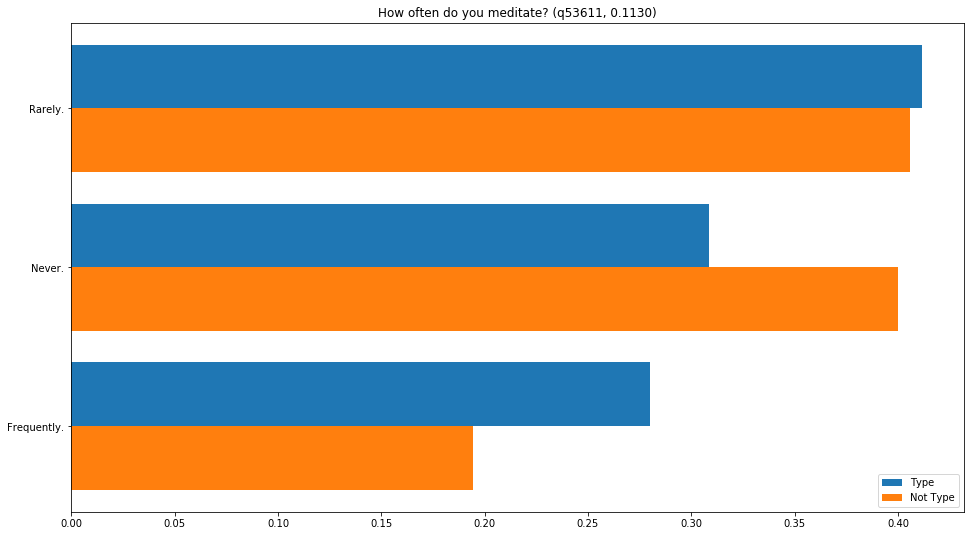

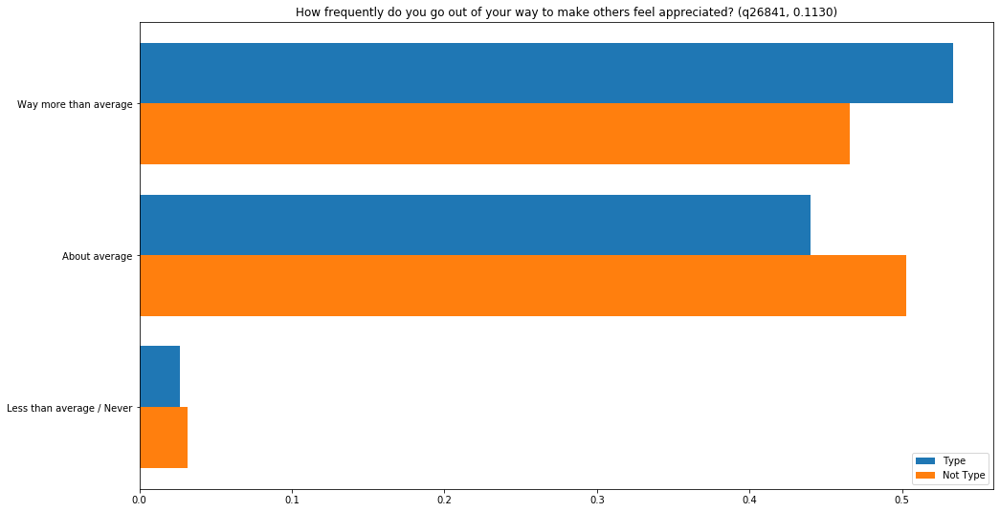

In [30]:
plot_top_questions(6, 30)

#### Cluster 7: "Smoker" Type

Smokers tend to:
- Endorse monogamy (`q1128`)
- Get close with their pets (`q35778`)
- Endorse traditional gendered etiquette (`q31877`)
- Consider money in their matches (`q22021`, `q318`)
- Have neutral to positive typical moods (`q1707`)
- Control their tempers (`q23696`)
- Care about physical attractiveness (`q122`)
- Be adventurous eaters (`q32973`)

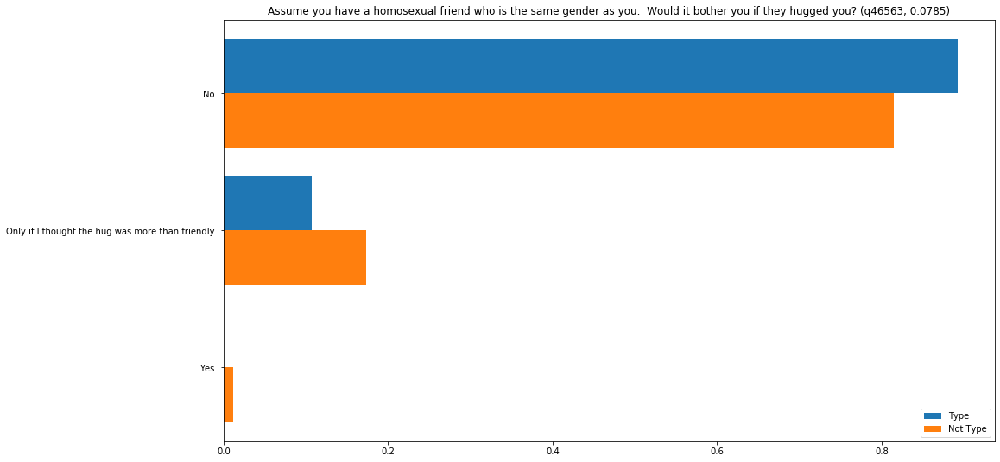

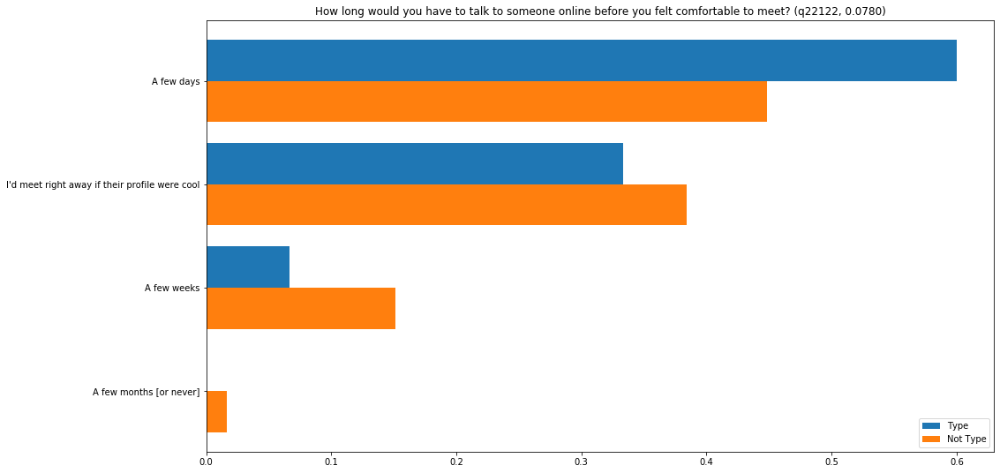

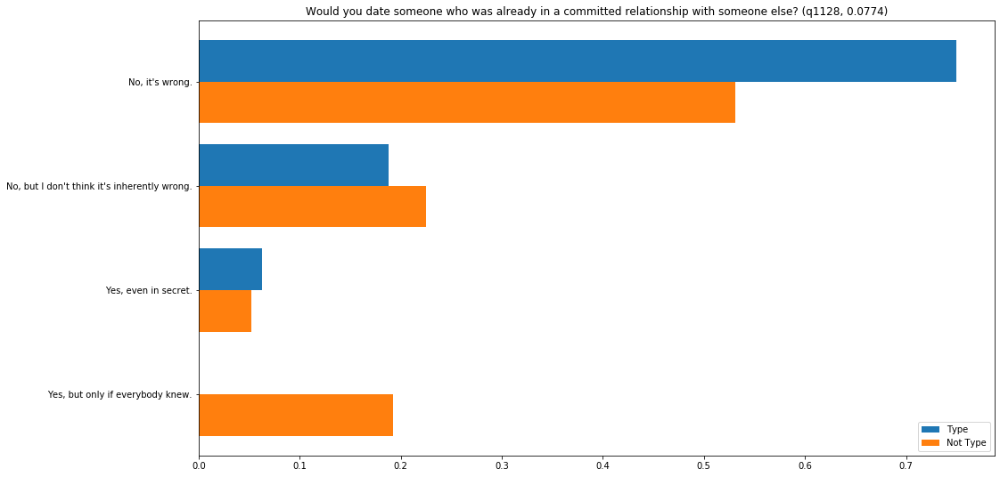

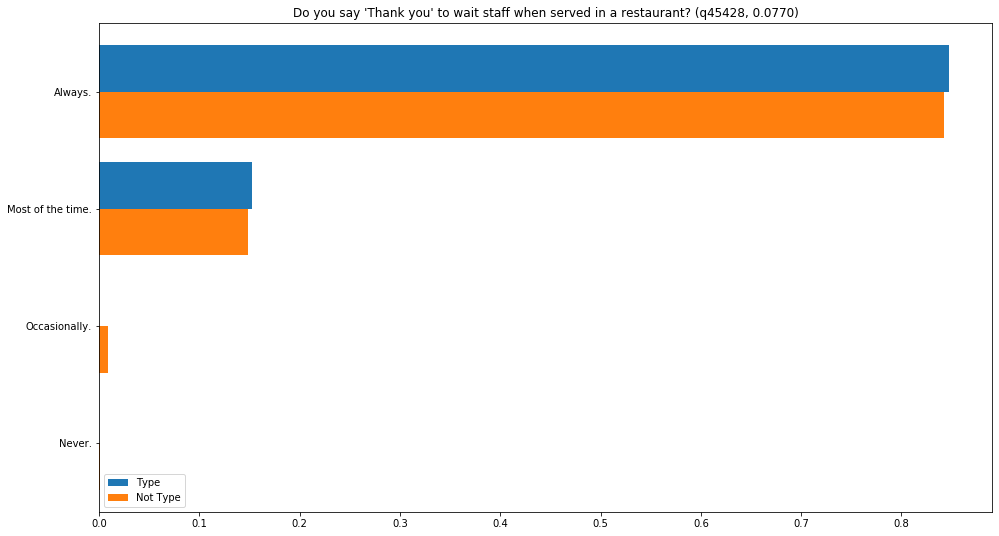

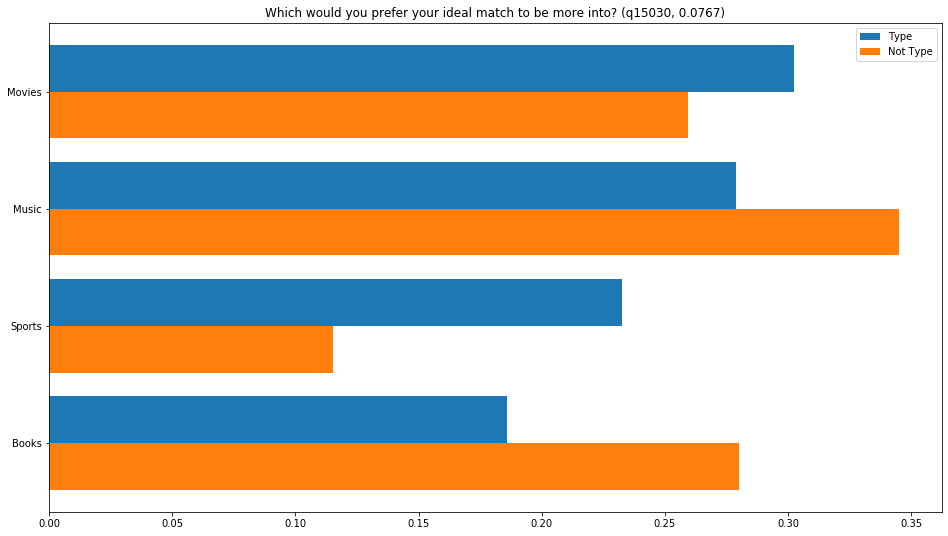

...

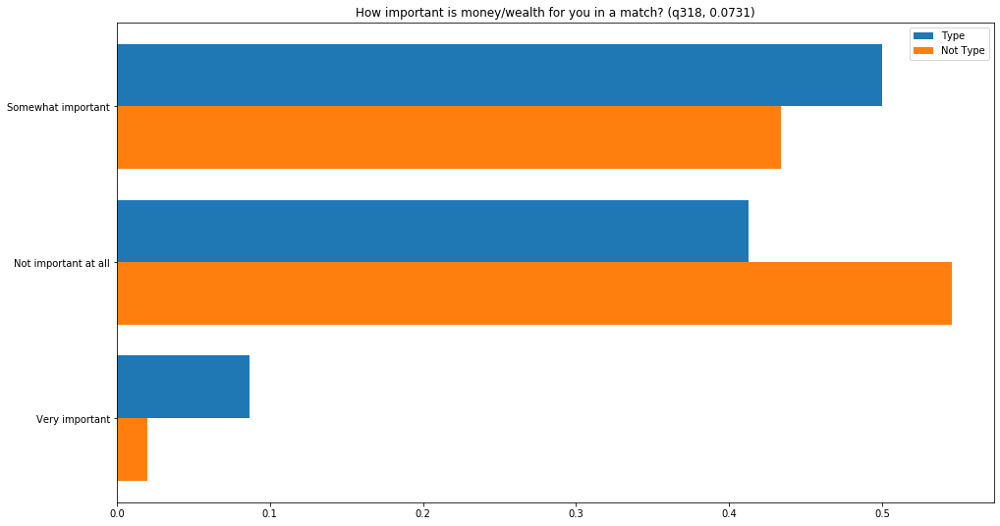

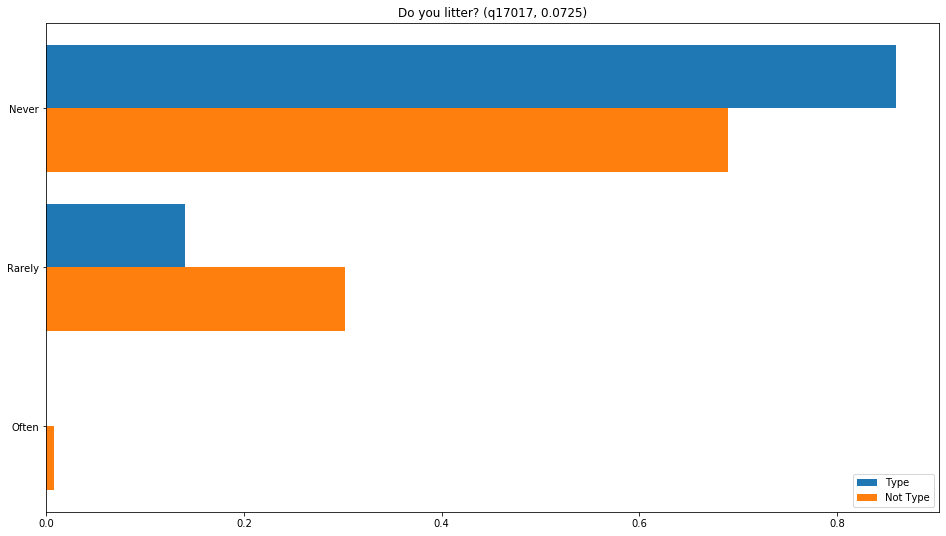

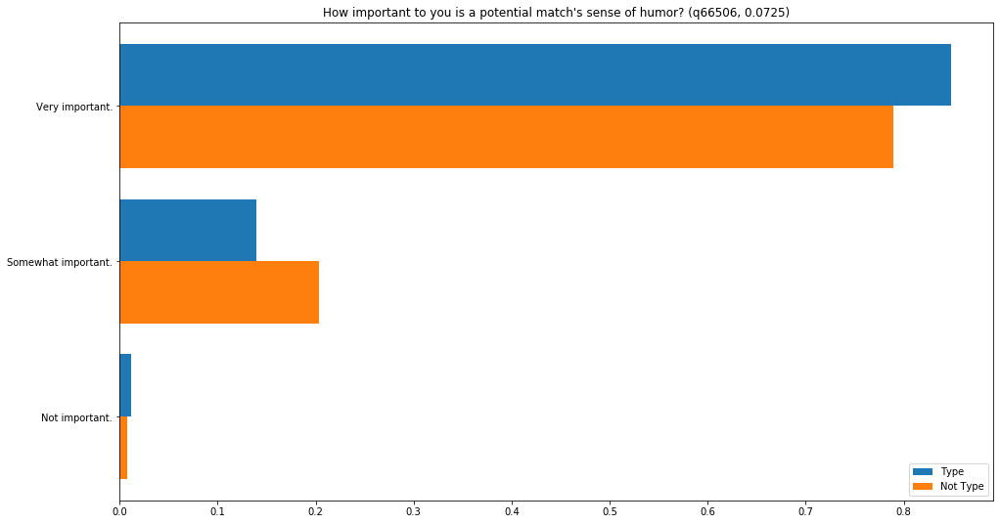

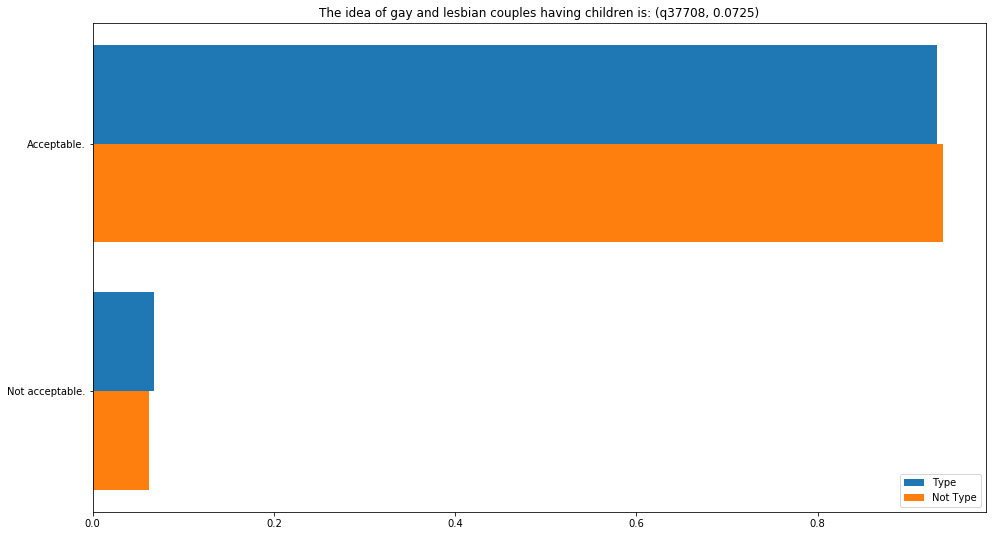

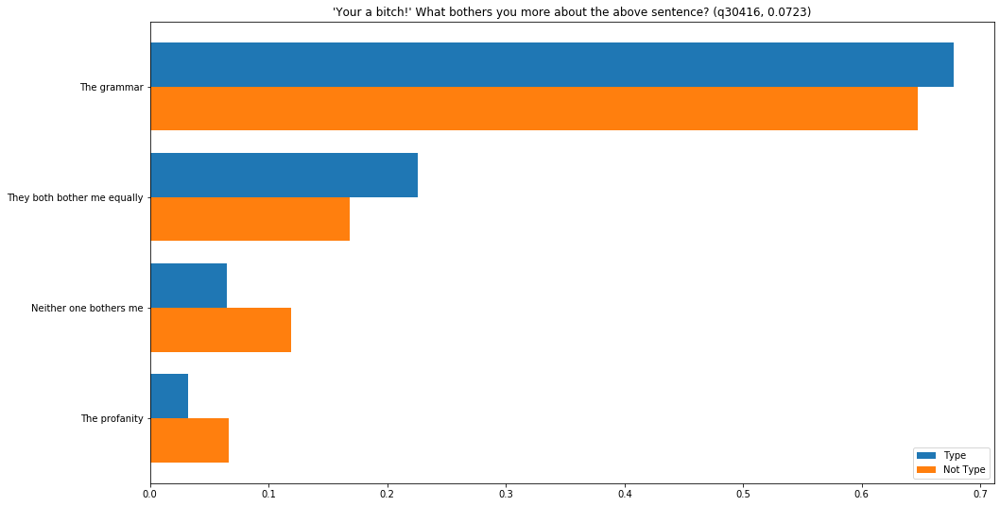

In [31]:
plot_top_questions(7, 30)

#### Cluster 8: "Faithful" Type

Faithfuls tend to:
- Be women looking for men
- Disapprove of recreational drugs (`q9688`, `q59457`)
- Endorse government welfare programs (`q34113`)
- Disapprove of promiscuity (`q24375`, `q1597`, `q53981`, `q42524`, `q28742`)
- Disapprove of homosexuality (`q35203`, `q6258`, `q30392`)
- Be Christian (`d_religion_type`)
- Disapprove of abortion (`q838`)
- Believe in supernatural phenomena (`q15695`, `q52789`)

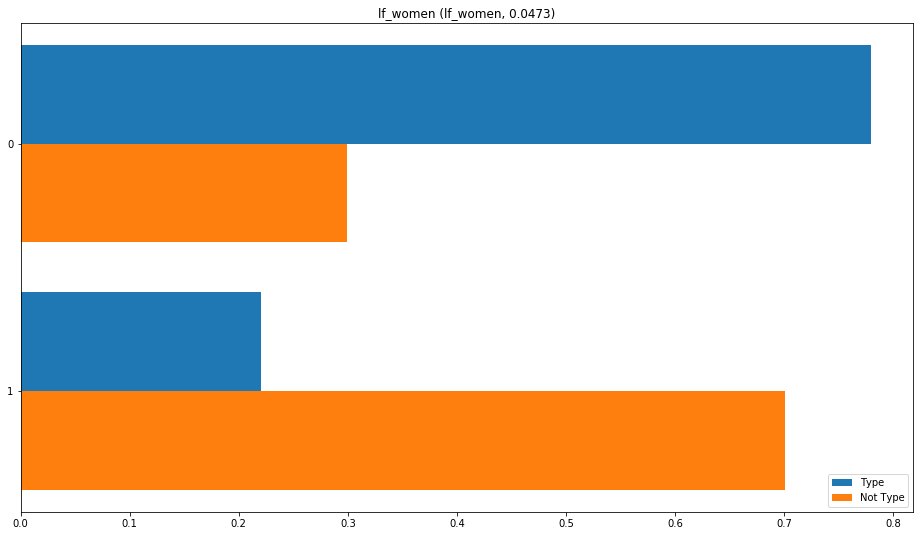

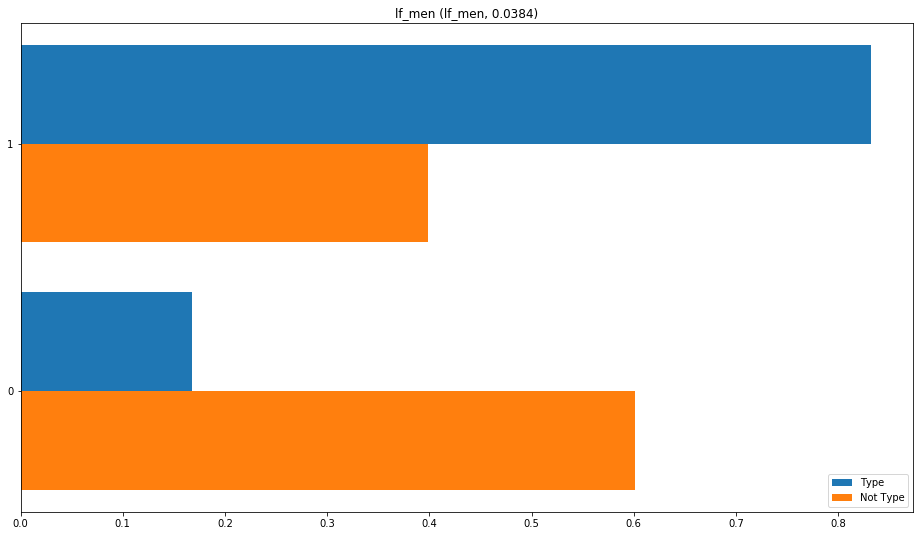

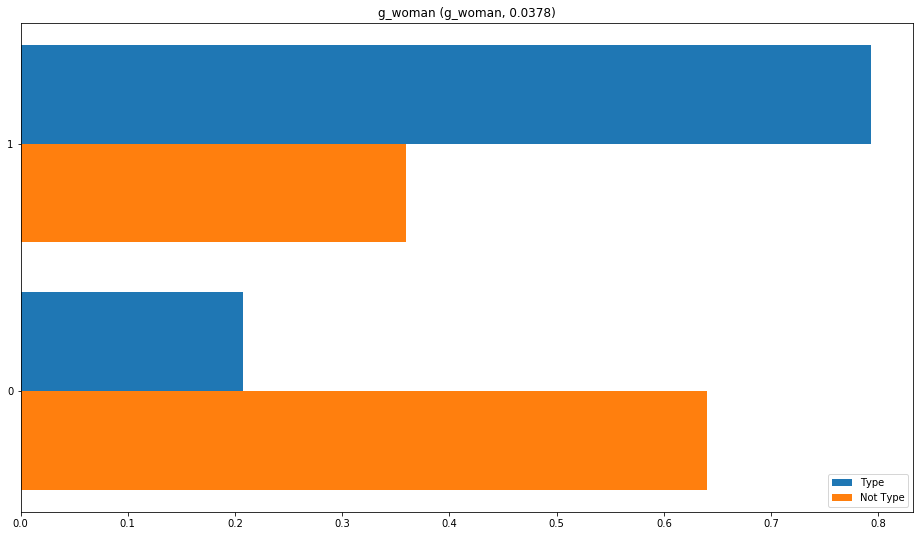

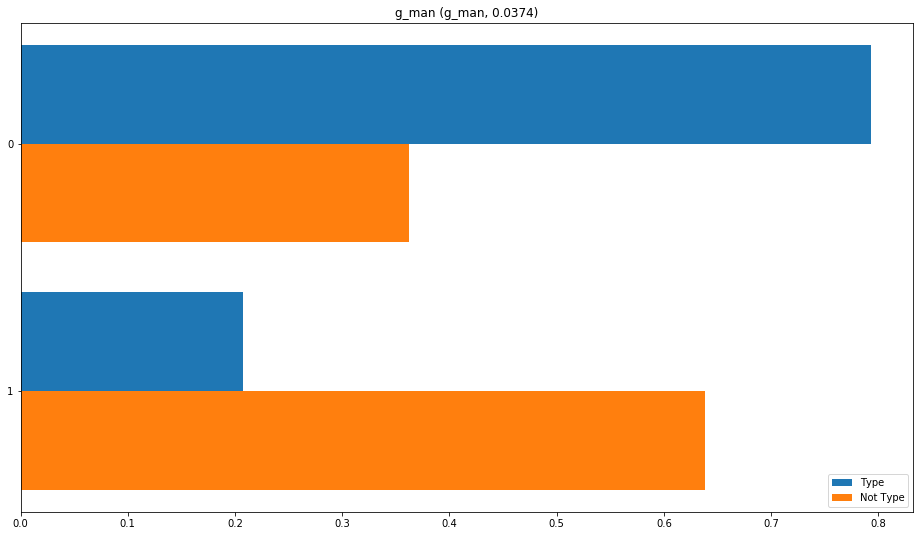

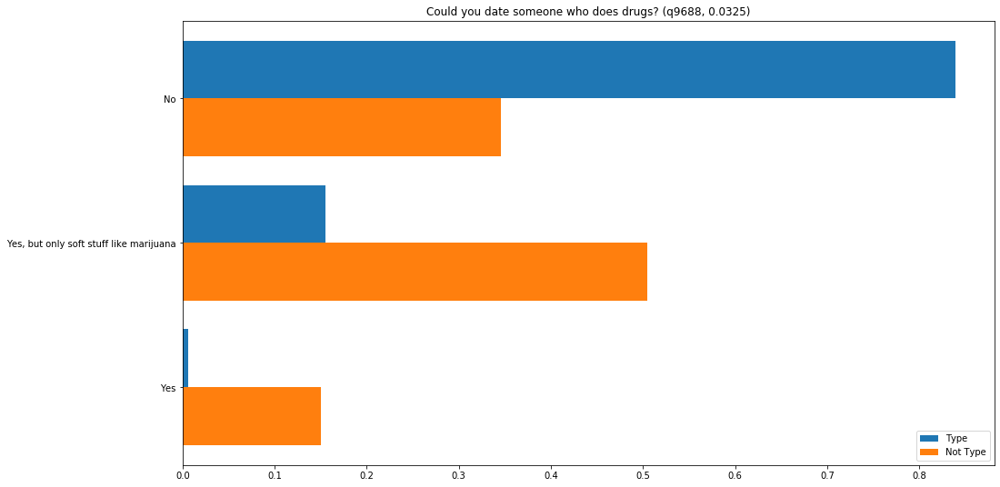

...

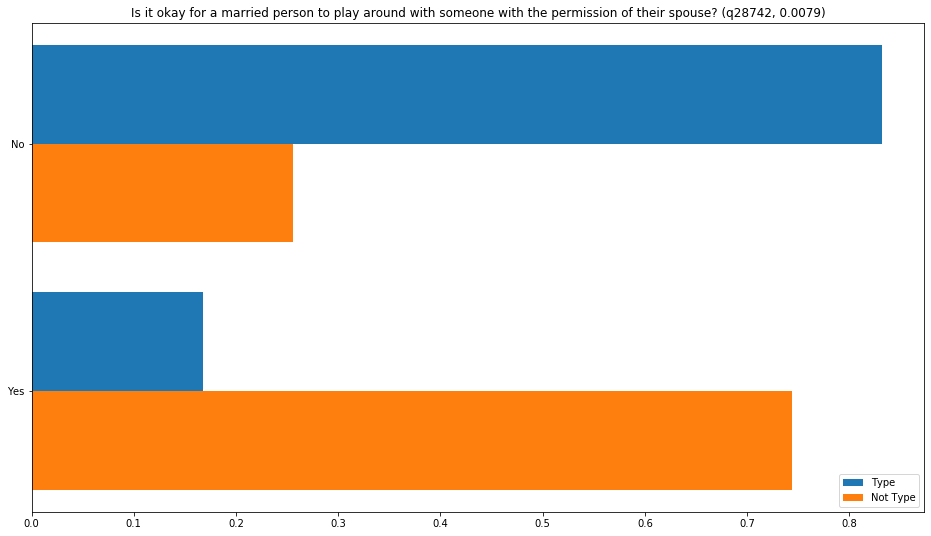

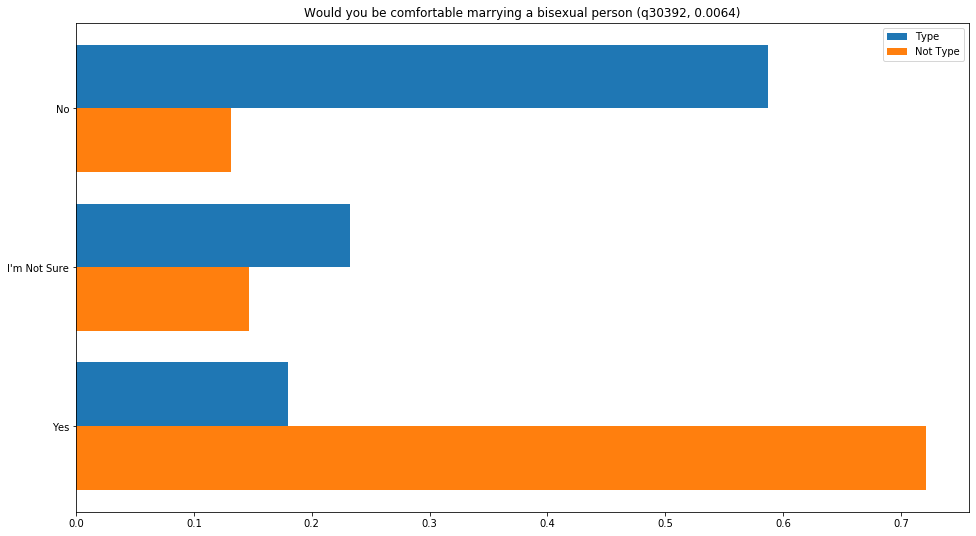

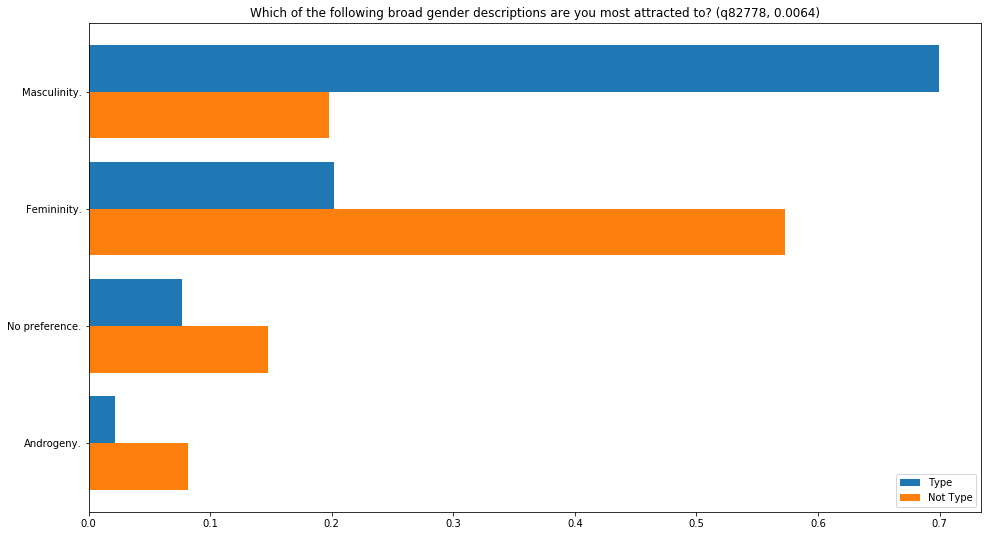

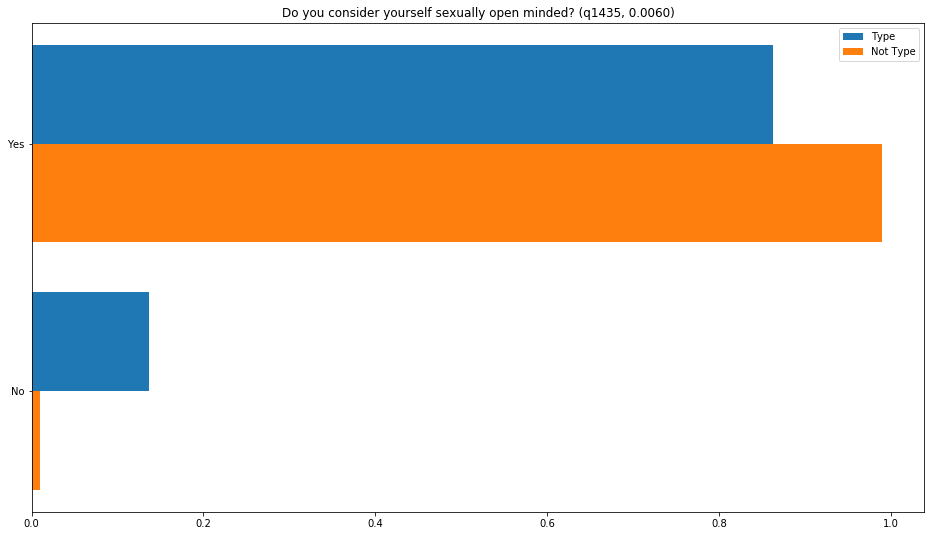

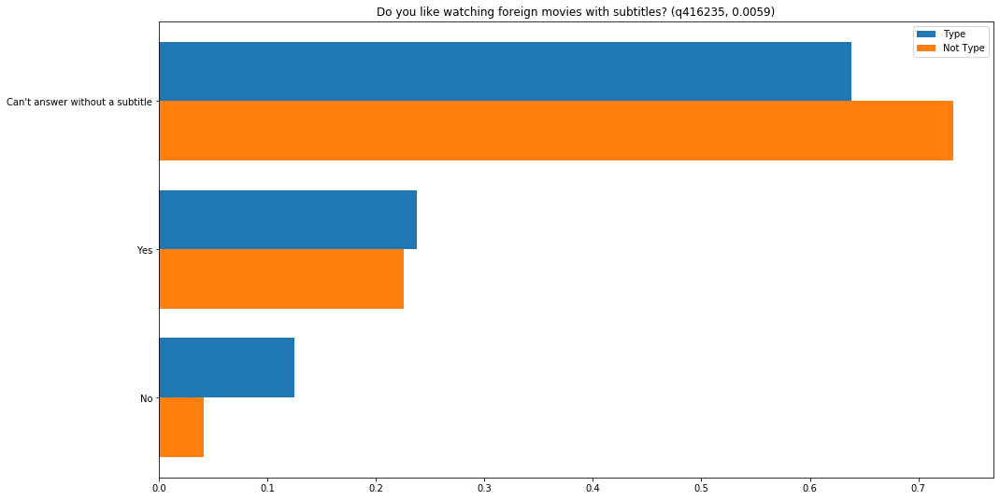

In [32]:
plot_top_questions(8, 30)

#### Cluster 9: "Masculine" Type

Masculines tend to:
- Be men looking for women for long-term dating
- Be Christian (`d_religion_type`)
- Endorse government welfare programs (`q34113`)
- Be less educated (`d_education_type`, `q13110`)
- Support gun ownership (`q27921`)
- Be employed in "construction", "sales / marketing", "technology", "transportation", "management", and "other" (`d_job`)
- Not hold leftist political views (`q212813`, `q166`, `q227646`)
- Oppose flag burning (`q39185`, `q175`)

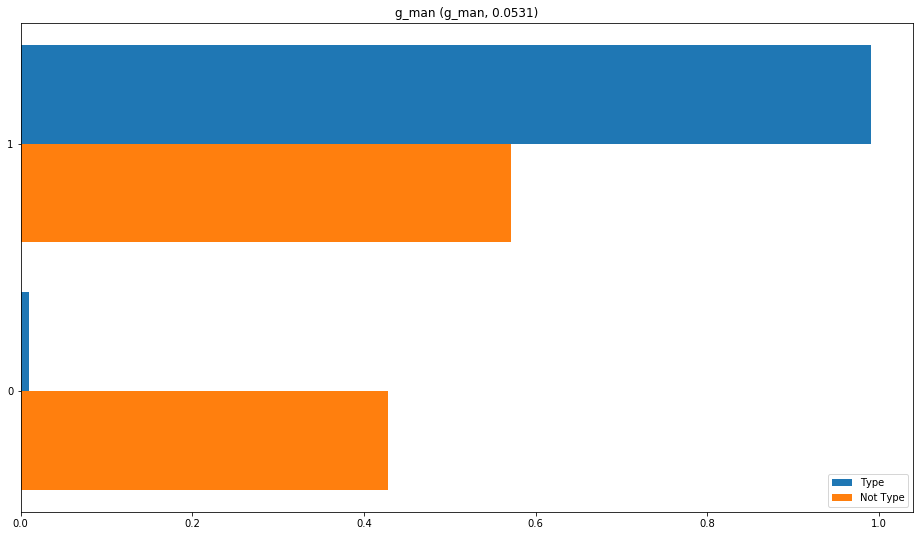

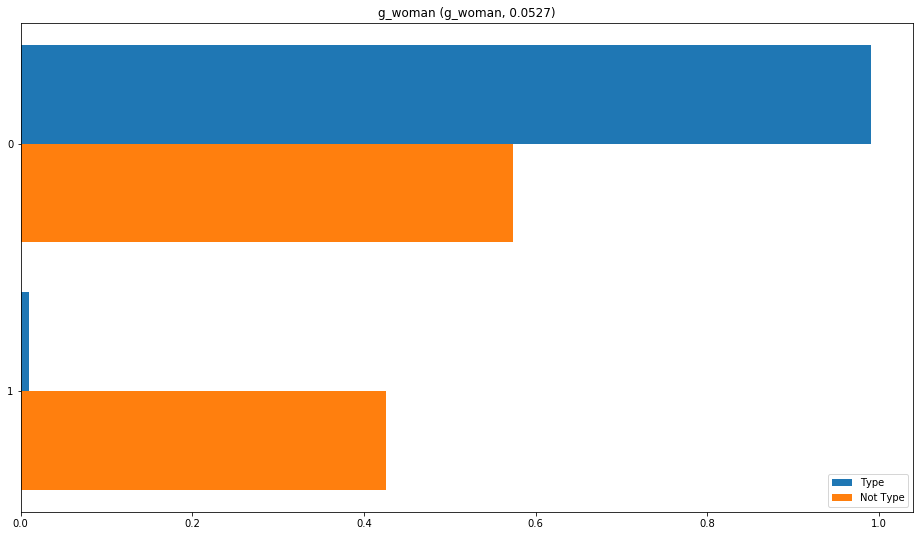

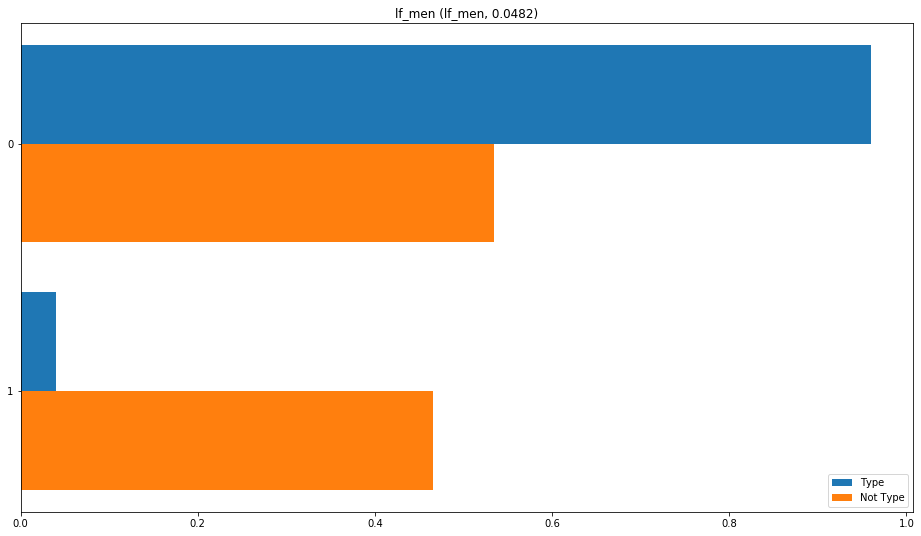

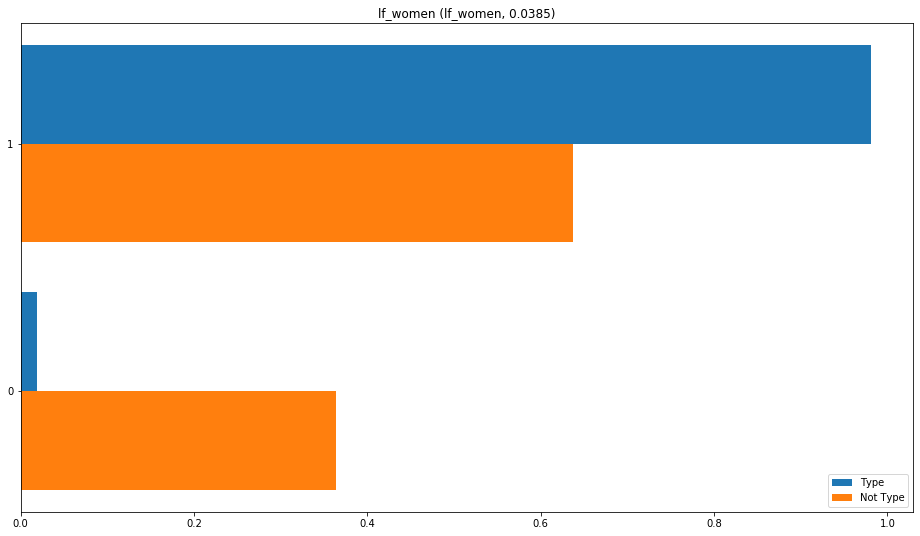

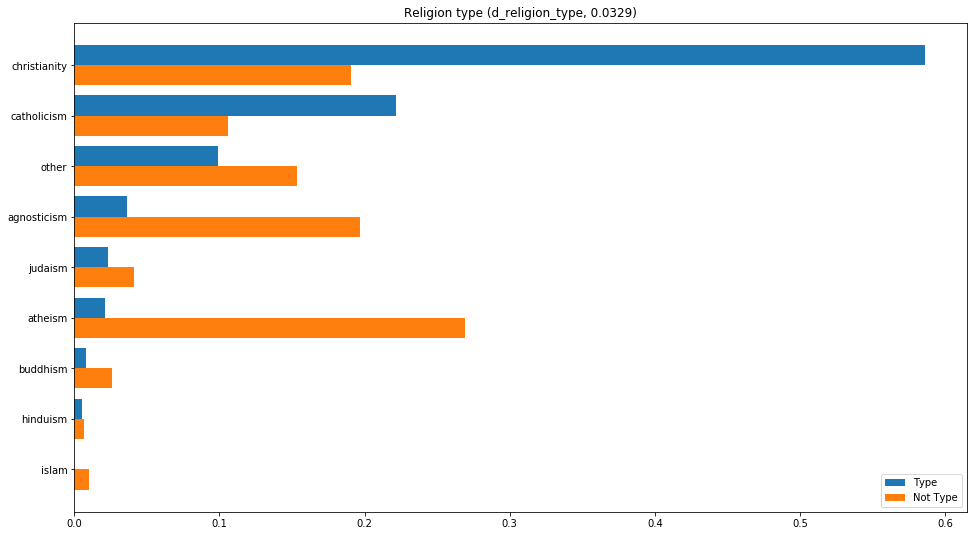

...

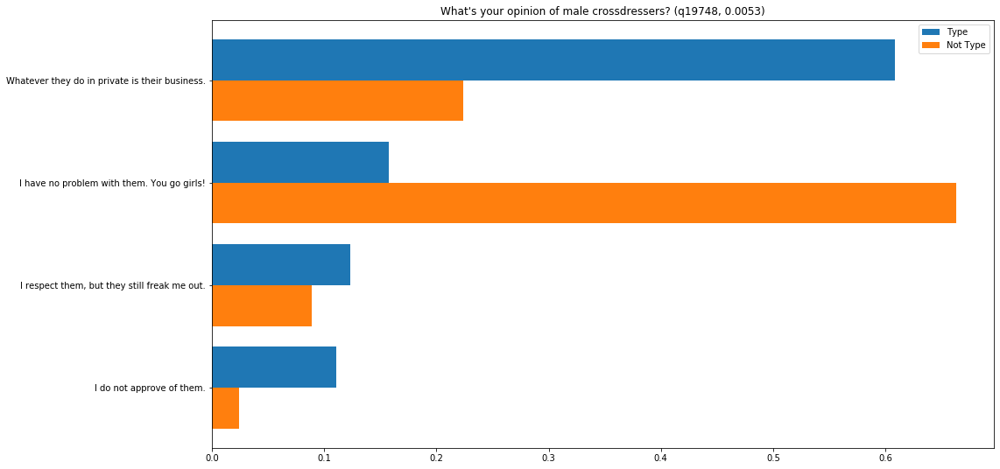

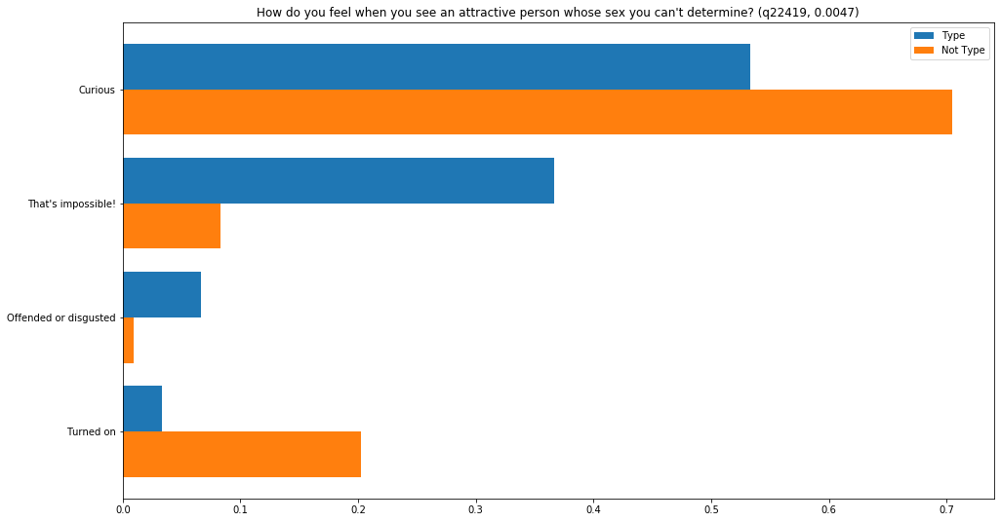

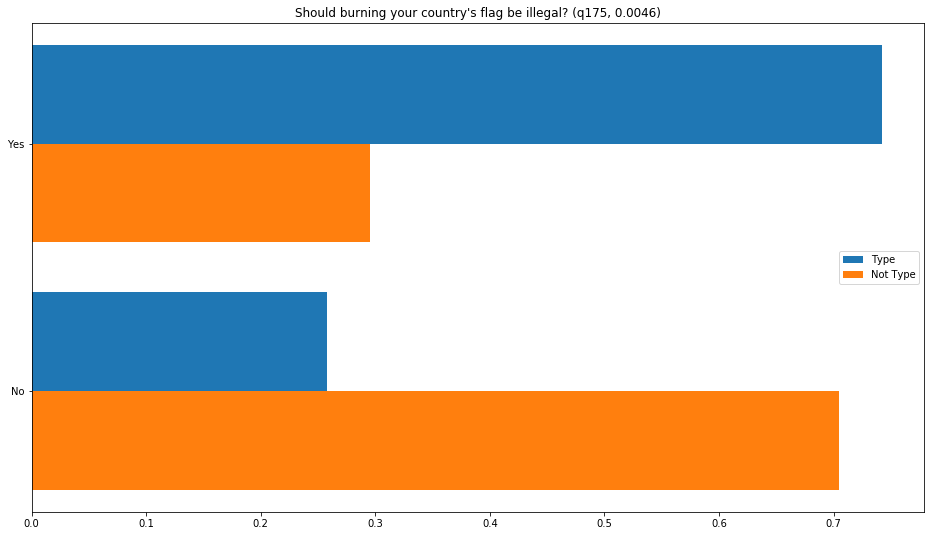

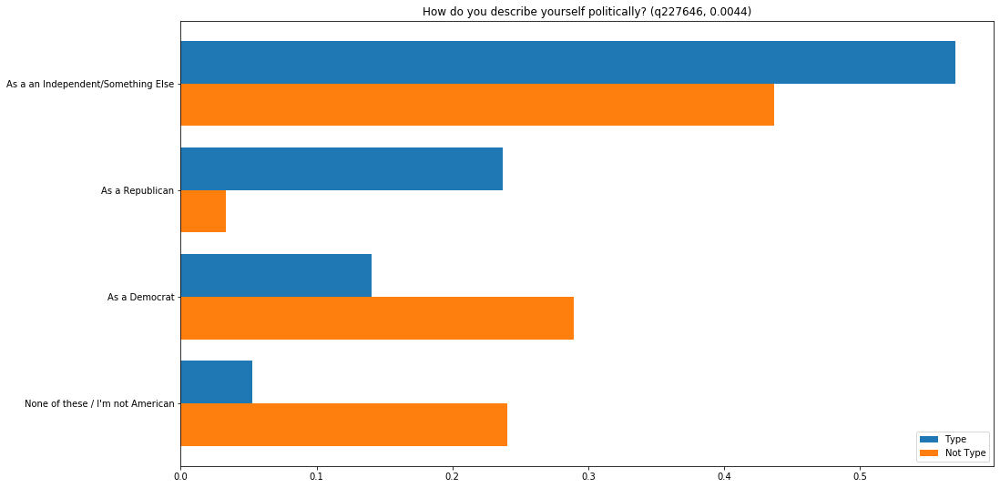

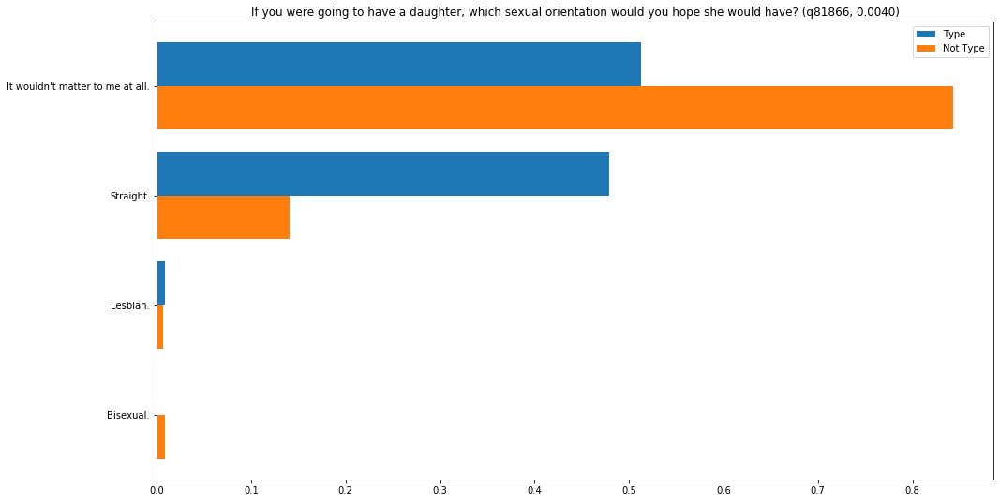

In [33]:
plot_top_questions(9, 30)

#### Cluster 10: "Hedonist" Type

Hedonists tend to:
- Be men looking for women for short-term dating
- Endorse government welfare programs (`q34113`)
- Endorse recreational drug use (`q9688`, `q80`, `q25228`, `q79`)
- Endorse promiscuity (`q325`, `q1597`, `q24375`)
- Not be religious (`q41`, `d_religion_type`)
- Endorse polyamory (`q52827`, `q37772`, `q1128`, `q16371`)
- Accept less communication in relationships (`q23543`)

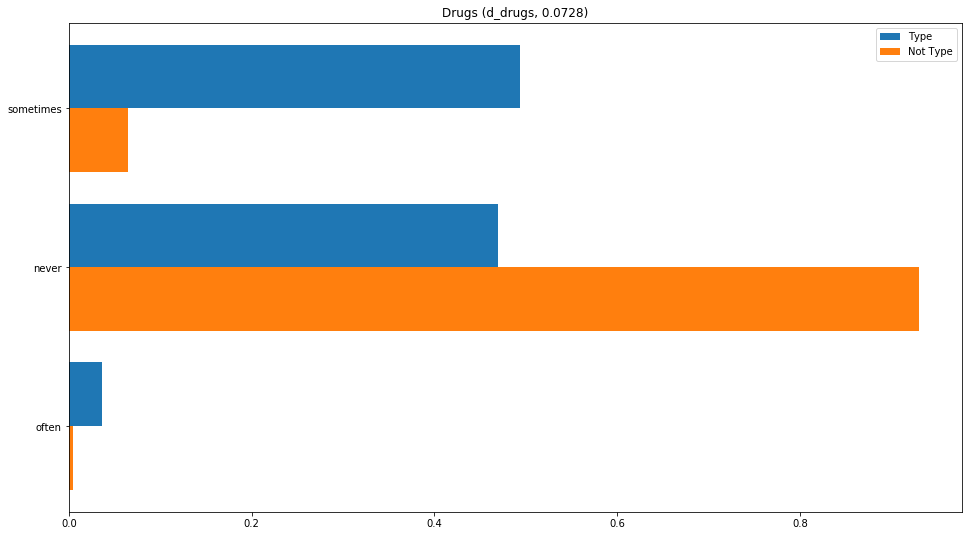

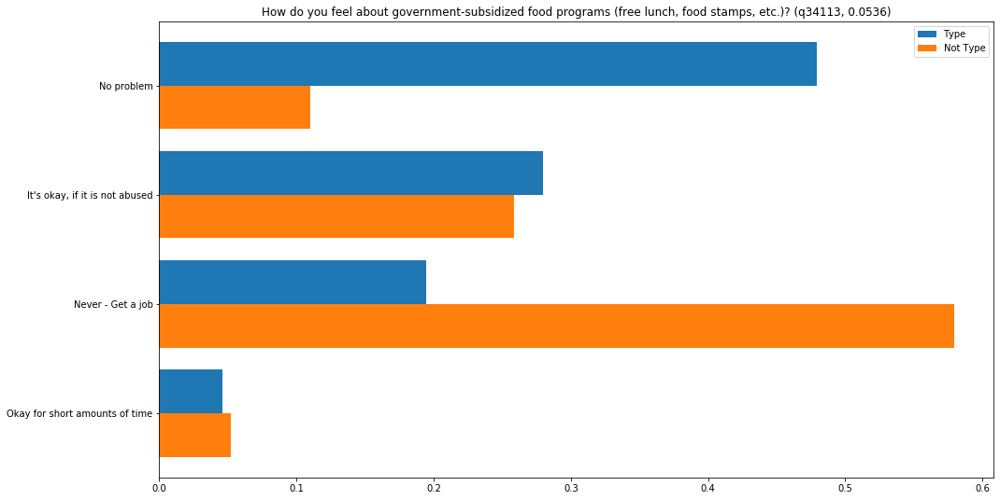

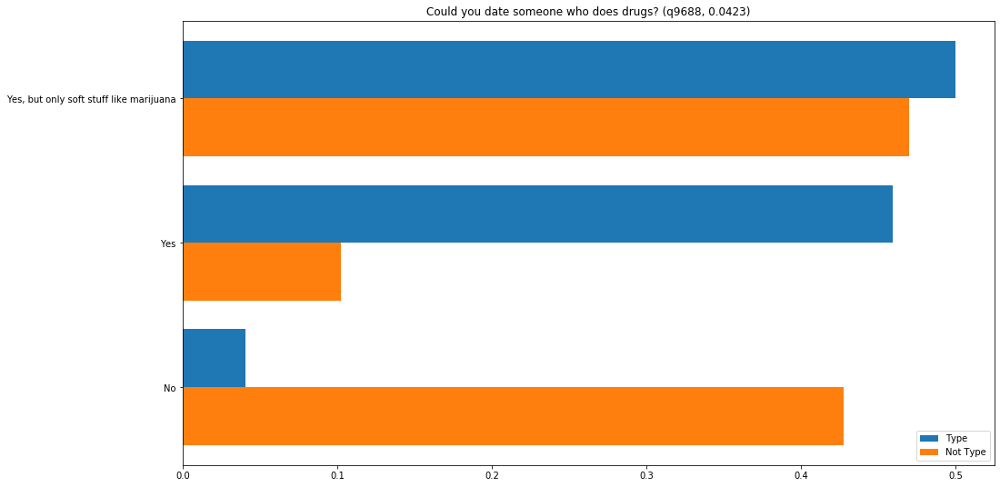

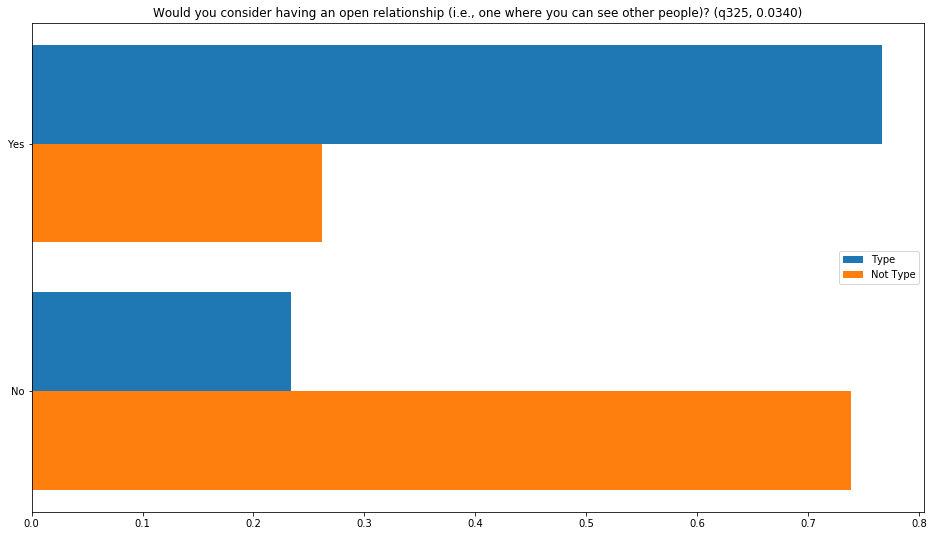

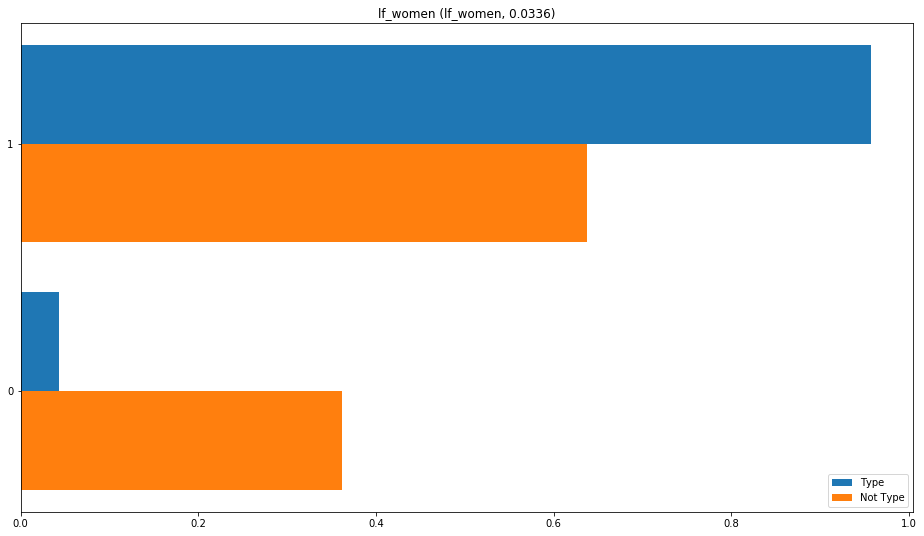

...

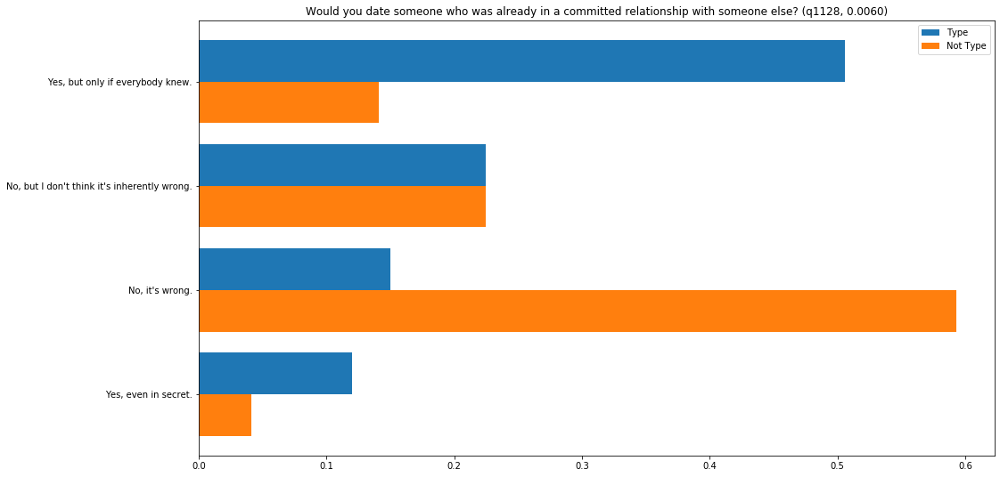

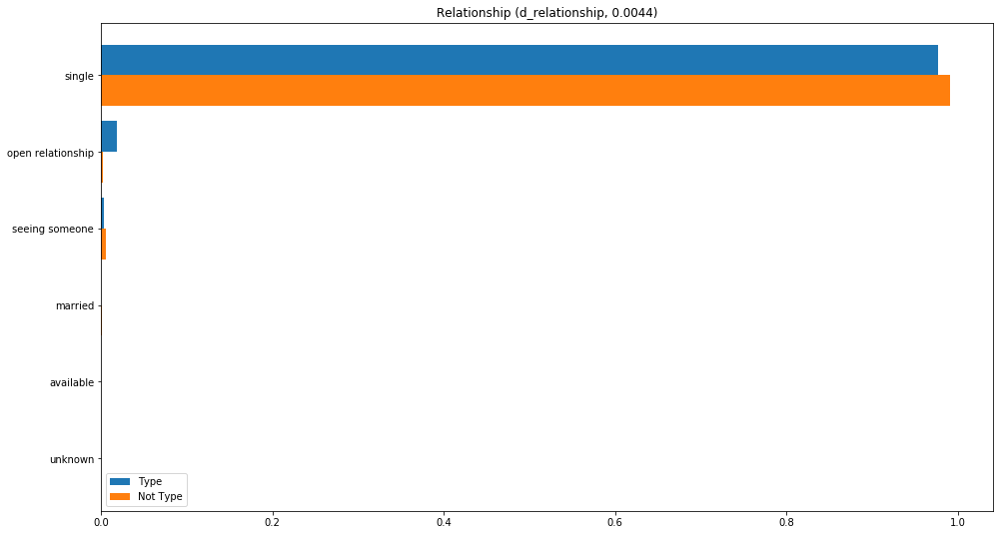

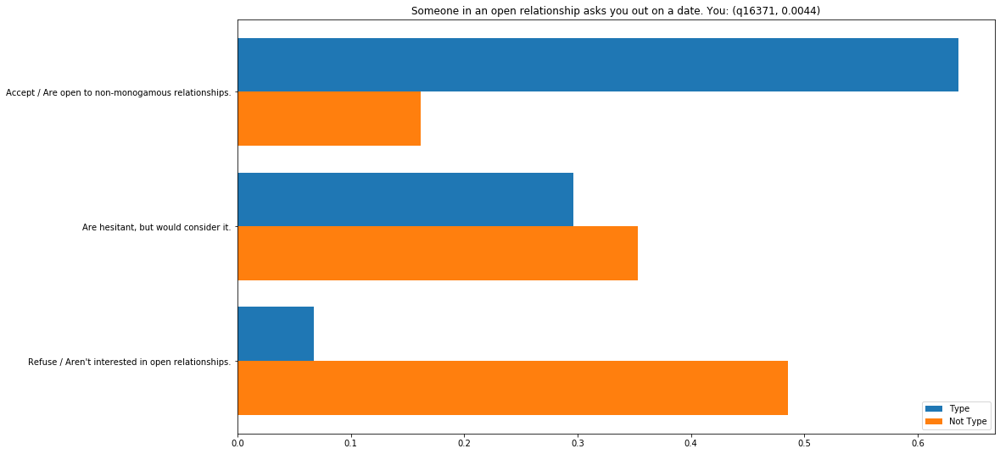

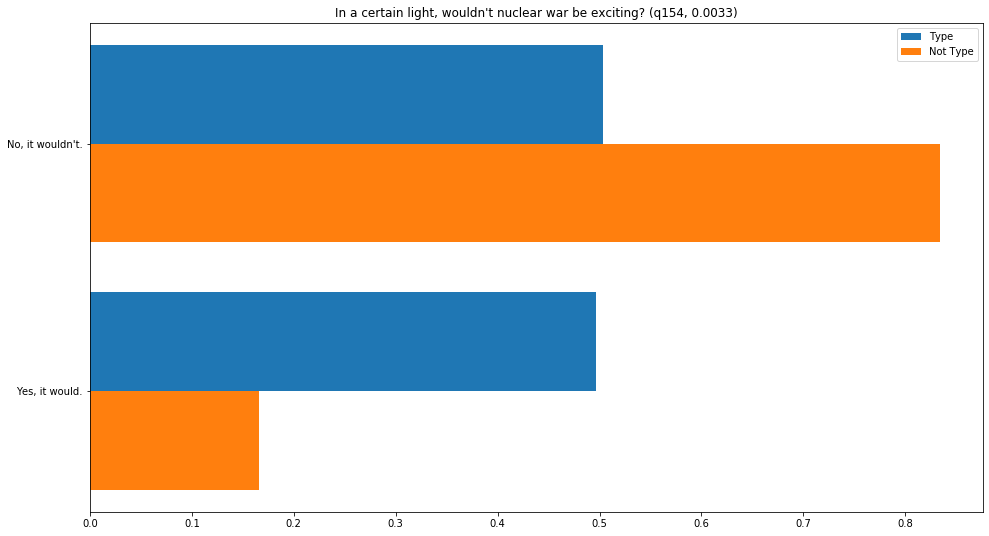

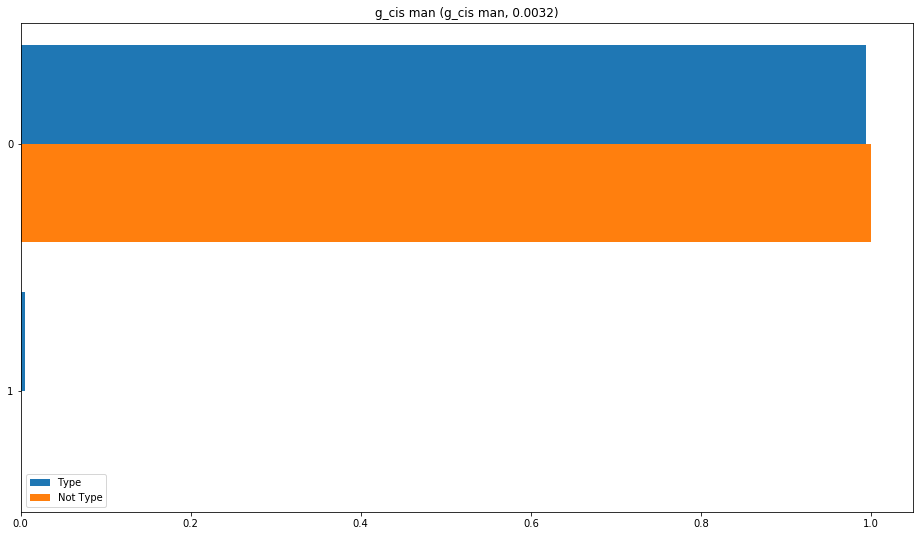

In [34]:
plot_top_questions(10, 30)

#### Cluster 11: "Engagement" Type

Engagers tend to:
- Be men looking for women for long-term dating
- Disapprove of recreational drug use (`q9688`, `q79`, `d_smokes`)
- Describe their bodies as "fit", "average", or "athletic" (`d_bodytype`)
- Be employed in "banking / finance", "technology", "management", "science / engineering", "medicine", or "law" (`d_job`)
- Disapprove of promiscuity (`q1597`, `q19891`, `q33107`, `q18048`)

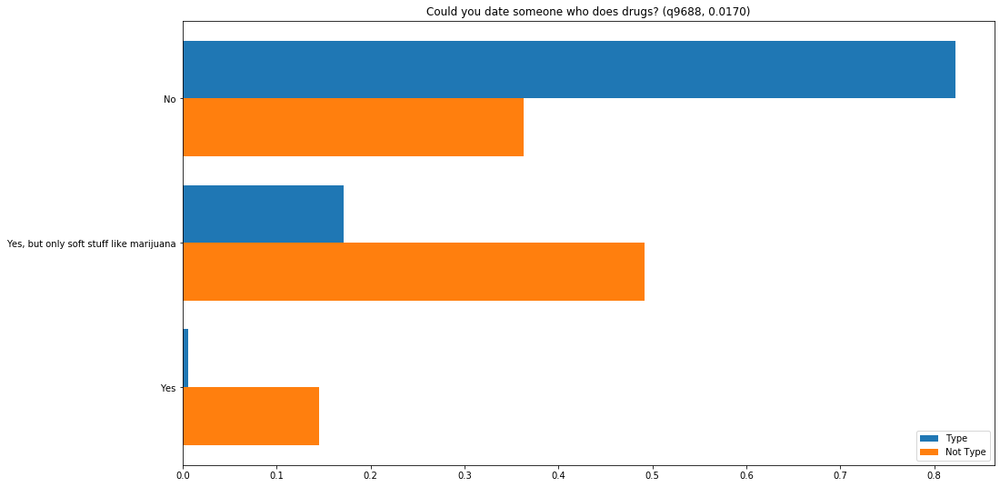

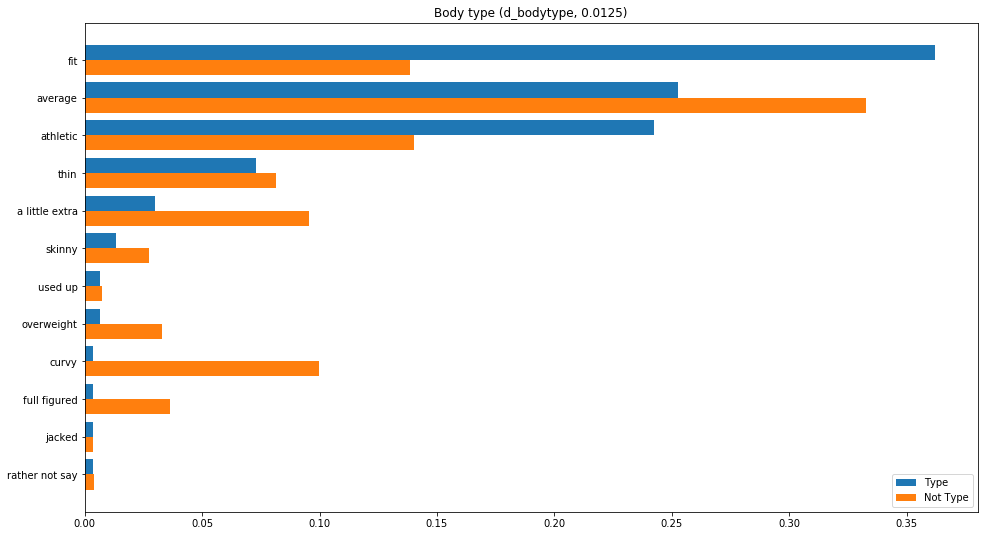

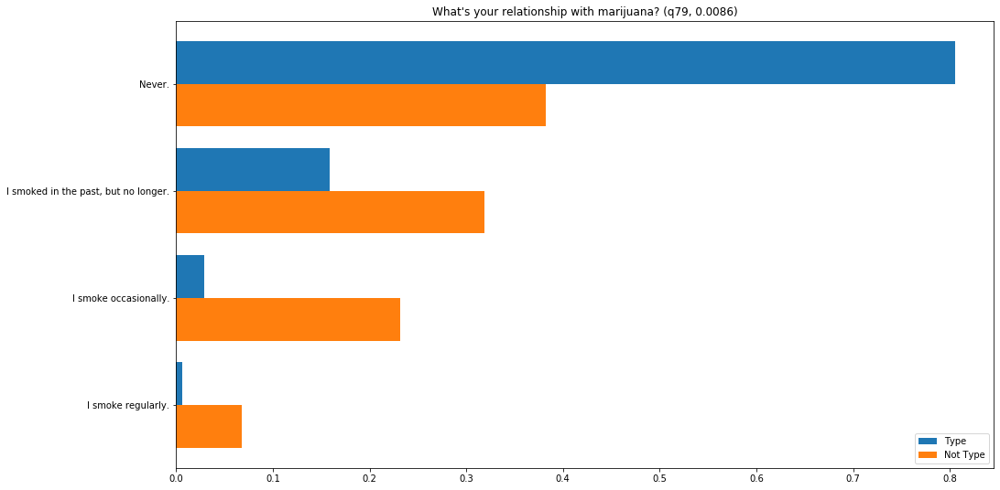

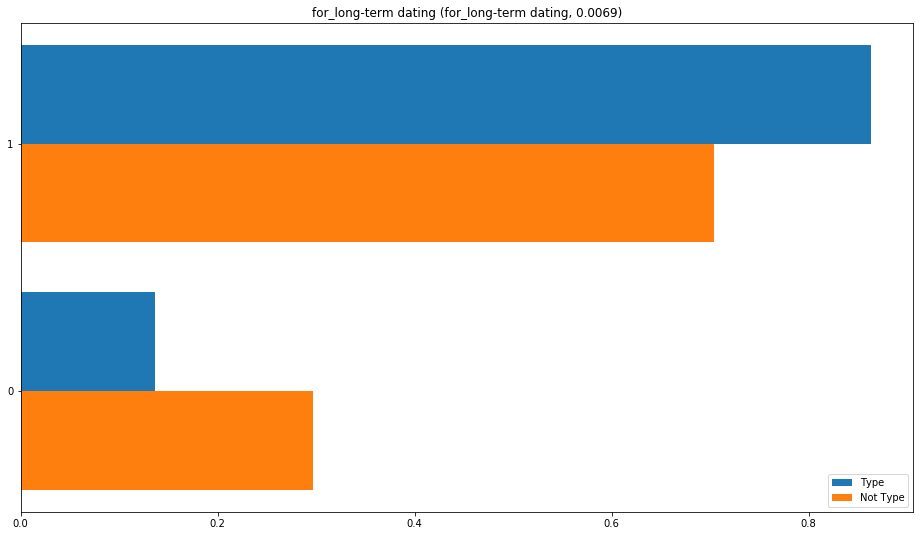

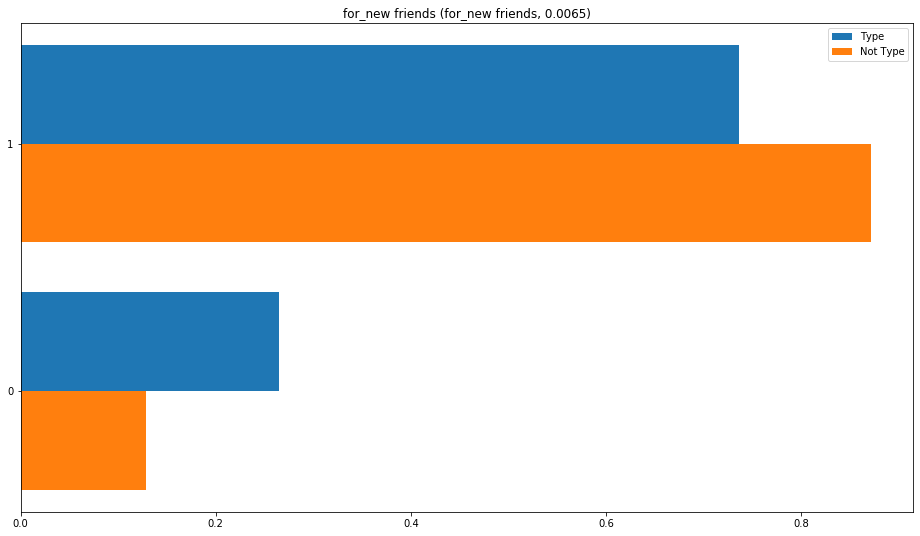

...

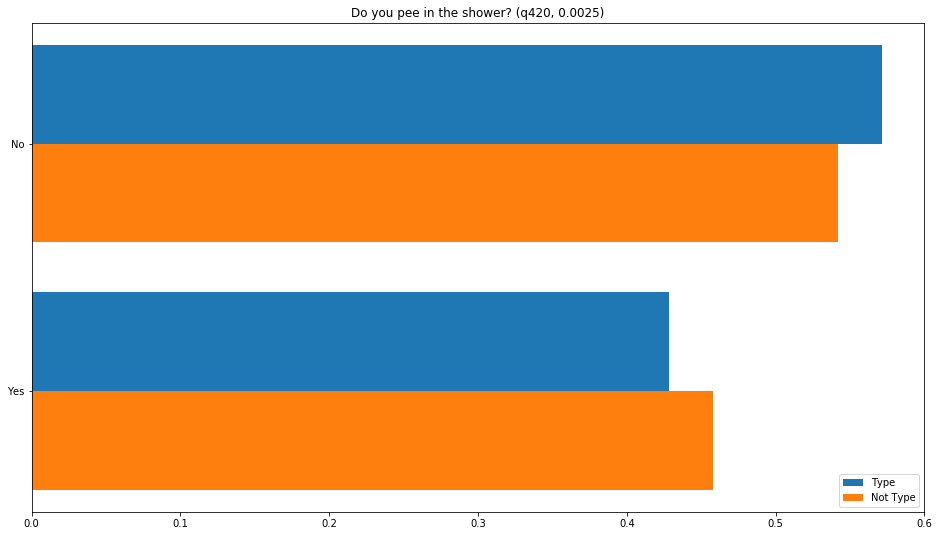

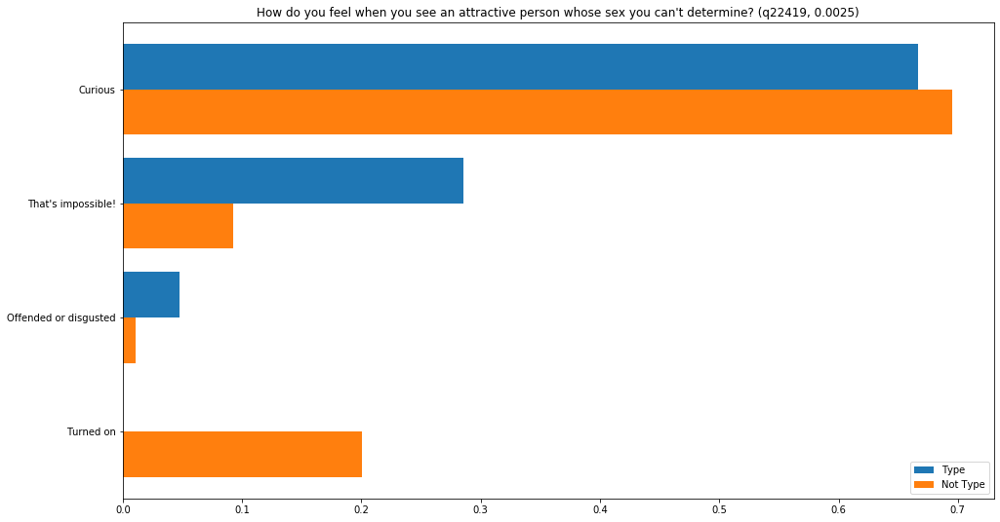

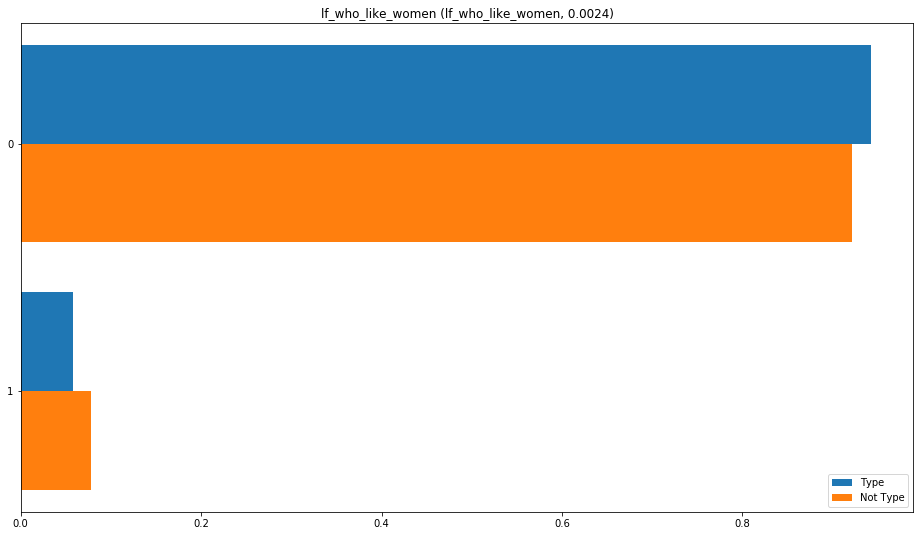

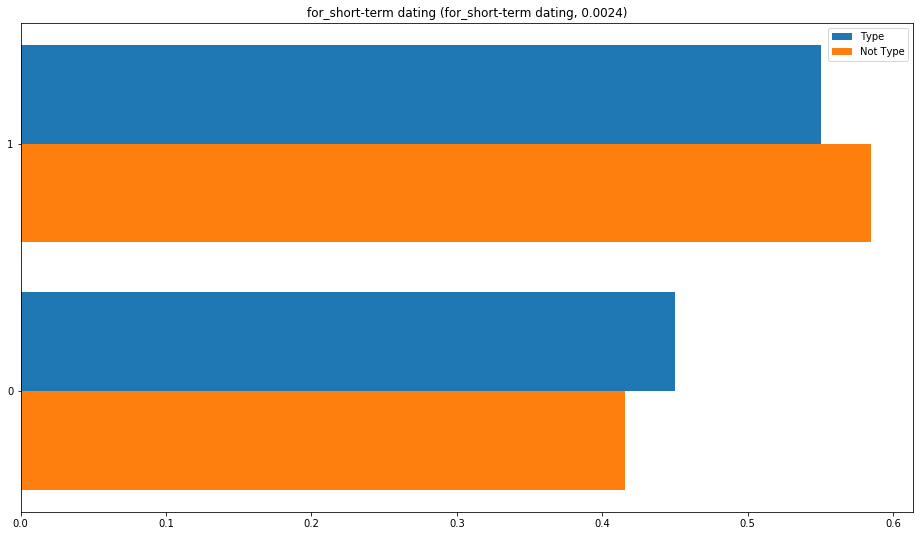

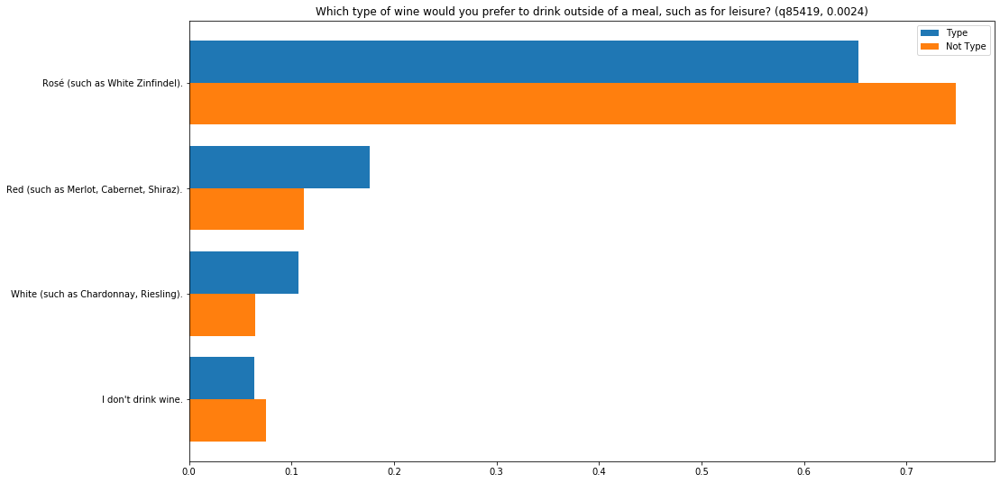

In [35]:
plot_top_questions(11, 30)